# **PROYECTO DATA SCIENCE - INVENTARIOS NUTRELUC**

En este proyecto se analiza el resultado de los inventarios físicos de la compañía NUTRELUC realizados de enero a agosto de 2023 para el 100% de los materiales resguardados en sus nueve almacenes. Con este fin, se busca conocer la cantidad de cajas que se tendrán en los próximos inventarios a fin de prevenir la obsolescencia, es decir el producto con corta caducidad, dañado o caducado que ya no puede ser comercializado de forma regular y que representa una pérdida para la compañía.

NUTRELUC cuenta con dos plantas donde se fabrican golosinas tipo chocolate (Chocolate, Chocolate Industrial), mezclas de nueces (Snacks) y bebidas instantáneas en polvo (Bif), con comercialización a nivel Nacional y Exportación en los canales Retail e Industrial.

En el dataset utilizado para este proyecto "Inventarios_2023" se consolidan los datos: Fecha, Planta, Almacén, Material, Descripción, Caducidad, Lote, Estatus, Proyección, Mercado, Categoría, Cajas, Costo y Vida útil, entre otros.

Con la información suministrada, se estudia a través de diversas visualizaciones como histogrmas y gráficos de puntos y cálculos tales promedio, mediana, cuartiles, etc., el compartamiento de la variable target "TOTAL_CJ", se describen sus características generales, distribución, medidas de posición y se determina si existen outliers que desvirtuen los resultados futuros de la predicción.

Los resultados obtenidos indican que el estatus libre utilización es el que tiene la mayor participación en el dataset con un 97%, seguido del producto con corta caducidad con 1.6%. El chocolae industrial es el que tiene mayor presencia en los estatus corta caducidad y dañado. En general se identificó que hay muy pocos productos con inventarios altos, el 50% del inventario tiene una existencia menor a 50 cajas.

Adicionalmente, resultado de este análisis se delimitaron los datos a estudiar durante el proyecto, definiendo así que se utilzará a lo largo del proyecto la variable target trasformada: "TOTAL_CJ_Topeada en su forma logarítmica".

Posteriormente, se analiza la relación de la variable target trasformada log vs las features, con esto se determina que las variables cuantitativas COSTO_TOT, AN_CAD, MESES_VU son las más correlacionadas con el target, siendo el COSTO_TOT la que presenta la relación más fuerte con una correlación del 90%.

# OBJETIVO
Predecir la cantidad de cajas que se tendrán en próximos inventarios.



# PROBLEMA COMERCIAL
Al no contar con un estimado de cajas por estatus, es difícil prevenir la obsolescencia. Por ello se requiere predecir la generación de cajas por estatus a partir de información de inventarios pasados para dar visibilidad a los almacenes y se tomen acciones preventivas.

# CONTEXTO ANALITICO

Para poder desarrollar el modelo se cuenta con un conjunto de 8 inventarios realizados a final de cada mes durante el 2023.

Las variables disponibles (30) son las siguientes:

0	FECHA - Fecha de realización del inventario
1	CEDI_MAT - Unión texto Cedi y Material
2	CEDI_MAT_LOT - Unión texto Cedi, Material y Lote
3	CEDI_MAT_LOT_EST - Unión texto Cedi, Material, Lote y Estatus
4	PLANTA - Nombre de la planta procesadora
5	ALMACEN - Nombre del almacén
6	CEDI - Identificador del almacén
7	MATERIAL - Identificador del producto
8	DESCRIPCION - Descripción del producto
9	CADUCIDAD - Fecha máxima de comercialización
10	LOTE - Identificador del lote
11	ESTATUS - Clasificación de estado del producto:
              Libre utilización - vida útil mayor a 6 meses
              Corta caducidad - vida util menor a 6 meses
              Caducado - vida útil concluida
              Dañado - presenta daño en sus componentes que impiden su comercialización
12  MES_CAD	 - Mes de caducidad
13	AN_CAD	- Año de caducidad
14	CATEGORIA - Tipo de producto:
            Bif - Bebida instántanea fría en polvo con venta nacional en Retail
            Bif Exportación - Bebida instántanea fría en polvo con internacional
            Chocolate - Golosinas con venta nacional en Retail
            Chocolate Industrial - Golosinas con venta nacional en Industria
            Chocolate Exportación - Golosinas con venta nacional
            Snacks - Mezcla de nueces con venta nacional
15	NOM	- Cumplimiento del etiquetado en México
16  FORM - Estatus descontinuado
17  RF_12M - Proyección de venta en cajas a 12 meses
18  M_NACIONAL	- Se comercializa en mercado nacional
19  CATEGORIA_FIN - Categoría de riesgo
20  RESPONSABLE	- Responsable del riesgo
21  ACCION - Acciones sobre el riesgo
22  TOTAL_CJ - Cantidad total de cajas
23  COSTO_UN - Costo por caja
24  COSTO_TOT - Costo por total del producto
25	MESES_VU - Vida útil restante en meses
26  VU_MAX -	Meses de vida útil máximos
27	PRCNTJ_VU - Vida útil restante en porcentaje
28	UN_CJ	- Cantidad de unidades por caja
29  RF_MES - Proyección de venta en cajas siguiente mes

# EXPLORACIÓN DEL DATASET

In [458]:
# Carga de Librerias a utilizar
import pandas as pd
import re
# Para importar base desde Github
import requests
from io import BytesIO
import openpyxl
# Para análisis y gráficos
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
# Para dar formato a gráficos
from matplotlib.ticker import FuncFormatter
import matplotlib.dates as mdates
import seaborn as sns
from scipy import stats
# Para trabajar con dates
from datetime import datetime
from datetime import timedelta
# Para estimar regresión
import statsmodels.formula.api as sm
import statsmodels.api as sm
import statsmodels.formula.api as smf
# Para métricas
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
# Para forward selection
import sys
import joblib
sys.modules['sklearn.externals.joblib'] = joblib
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.linear_model import LinearRegression
# Para PCA
from sklearn.decomposition import PCA
# Para separar en train y test
from sklearn.model_selection import train_test_split
# Para estandarizar la data
from sklearn.preprocessing import StandardScaler
#Para selecciónar variables
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
# Para separar train y test
from sklearn.model_selection import train_test_split
# Para calcular métricas
from sklearn import metrics
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import calinski_harabasz_score
# Para detección de outliers
from sklearn.ensemble import IsolationForest
# Para detección de clusters
from sklearn.cluster import KMeans
# Para seteo que no se muestre en notación científica
np.set_printoptions(suppress=True)

In [459]:
# Carga del dataset desde Github
url = 'https://raw.githubusercontent.com/Moon-Her/Proyecto_DS_Inventario/main/Inventarios_2023.xlsx'
response = requests.get(url)
content = response.content
df = pd.read_excel(BytesIO(content))
df.head()

,FECHA,CEDI_MAT,CEDI_MAT_LOT,CEDI_MAT_LOT_EST,PLANTA,CEDI,ALMACEN,MATERIAL,DESCRIPCION,CADUCIDAD,...,RESPONSABLE,ACCION,TOTAL_CJ,COSTO_UN,COSTO_TOT,MESES_VU,VU_MAX,PRCTJ_VU,UN_CJ,RF_MES
0,2023-01-31,NU901008121,NU90100812147003987,NU90100812147003987Libre utilización,ABNU,NU90,LAG,1008121,MUIBON avell 24/15/22g.Display Exp.,2024-04-01,...,Comercial,Venta regular,200,465.36,93072.00,14.200000,15.000000,0.946667,24.0,70.0
1,2023-01-31,NU901011425,NU9010114251322,NU9010114251322Corta caducidad,ABNU,NU90,LAG,1011425,BRR. MILCH AVELL 1/250/22G 4605,2023-06-30,...,Sebastián,Para planes,32,298.36,9547.52,5.000000,15.233333,0.328228,1.0,0.0
2,2023-01-31,NU901011425,NU9010114251322,NU9010114251322Dañado,ABNU,NU90,LAG,1011425,BRR. MILCH AVELL 1/250/22G 4605,2023-06-30,...,Oscar,Merma,1,298.36,298.36,5.000000,15.233333,0.328228,1.0,0.0
3,2023-01-31,NU901011425,NU9010114250344,NU9010114250344Dañado,ABNU,NU90,LAG,1011425,BRR. MILCH AVELL 1/250/22G 4605,2023-07-07,...,Oscar,Merma,2,298.36,596.72,5.233333,15.233333,0.343545,1.0,0.0
4,2023-01-31,NU901011425,NU9010114251422,NU9010114251422Corta caducidad,ABNU,NU90,LAG,1011425,BRR. MILCH AVELL 1/250/22G 4605,2023-07-07,...,Sebastián,Para planes,21,298.36,6265.56,5.233333,15.233333,0.343545,1.0,0.0


In [460]:
df.shape

(34672, 30)

In [461]:
# ¿Hay filas duplicadas?
df.duplicated().value_counts()

False    34670
True         2
dtype: int64

In [462]:
# Eliminar duplicados
df.drop_duplicates(inplace=True)

In [463]:
# ¿Qué tipo de datos tiene el dataset?
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34670 entries, 0 to 34671
Data columns (total 30 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   FECHA             34670 non-null  datetime64[ns]
 1   CEDI_MAT          34670 non-null  object        
 2   CEDI_MAT_LOT      34670 non-null  object        
 3   CEDI_MAT_LOT_EST  34670 non-null  object        
 4   PLANTA            34670 non-null  object        
 5   CEDI              34670 non-null  object        
 6   ALMACEN           34670 non-null  object        
 7   MATERIAL          34670 non-null  int64         
 8   DESCRIPCION       34670 non-null  object        
 9   CADUCIDAD         34670 non-null  datetime64[ns]
 10  LOTE              34670 non-null  object        
 11  ESTATUS           34670 non-null  object        
 12  MES_CAD           34670 non-null  object        
 13  AN_CAD            34670 non-null  int64         
 14  CATEGORIA         3467

In [464]:
# Convertir variables según su tipo de dato
df['FECHA'] = pd.to_datetime(df['FECHA'])
df['MATERIAL'] = df['MATERIAL'].astype(str)
df['CADUCIDAD'] = pd.to_datetime(df['CADUCIDAD'])
df['COSTO_UN'] = df['COSTO_UN'].round(2)
df['COSTO_TOT'] = df['COSTO_TOT'].round(2)
df['MESES_VU'] = df['MESES_VU'].round(2)
df['VU_MAX'] = df['VU_MAX'].astype(int)
df['PRCTJ_VU'] = df['PRCTJ_VU'].round(2)
df['UN_CJ'] = df['UN_CJ'].astype(int)
df['RF_MES'] = df['RF_MES'].astype(int)

In [465]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34670 entries, 0 to 34671
Data columns (total 30 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   FECHA             34670 non-null  datetime64[ns]
 1   CEDI_MAT          34670 non-null  object        
 2   CEDI_MAT_LOT      34670 non-null  object        
 3   CEDI_MAT_LOT_EST  34670 non-null  object        
 4   PLANTA            34670 non-null  object        
 5   CEDI              34670 non-null  object        
 6   ALMACEN           34670 non-null  object        
 7   MATERIAL          34670 non-null  object        
 8   DESCRIPCION       34670 non-null  object        
 9   CADUCIDAD         34670 non-null  datetime64[ns]
 10  LOTE              34670 non-null  object        
 11  ESTATUS           34670 non-null  object        
 12  MES_CAD           34670 non-null  object        
 13  AN_CAD            34670 non-null  int64         
 14  CATEGORIA         3467

In [466]:
df.columns

Index(['FECHA', 'CEDI_MAT', 'CEDI_MAT_LOT', 'CEDI_MAT_LOT_EST', 'PLANTA',
       'CEDI', 'ALMACEN', 'MATERIAL', 'DESCRIPCION', 'CADUCIDAD', 'LOTE',
       'ESTATUS', 'MES_CAD', 'AN_CAD', 'CATEGORIA', 'NOM', 'FORM', 'RF_12M',
       'M_NACIONAL', 'CATEGORIA_FIN', 'RESPONSABLE', 'ACCION', 'TOTAL_CJ',
       'COSTO_UN', 'COSTO_TOT', 'MESES_VU', 'VU_MAX', 'PRCTJ_VU', 'UN_CJ',
       'RF_MES'],
      dtype='object')

In [467]:
# Identificar datos 0
nun_missing = (df[['FECHA', 'CEDI_MAT', 'CEDI_MAT_LOT', 'CEDI_MAT_LOT_EST', 'PLANTA',
       'ALMACEN', 'CEDI', 'MATERIAL', 'DESCRIPCION', 'CADUCIDAD', 'LOTE',
       'ESTATUS', 'MES_CAD', 'AN_CAD', 'CATEGORIA', 'NOM', 'FORM', 'RF_12M',
       'M_NACIONAL', 'CATEGORIA_FIN', 'RESPONSABLE', 'ACCION', 'TOTAL_CJ',
       'COSTO_UN', 'COSTO_TOT', 'MESES_VU', 'VU_MAX', 'PRCTJ_VU', 'UN_CJ',
       'RF_MES']] == 0).sum()
print(nun_missing)

FECHA                   0
CEDI_MAT                0
CEDI_MAT_LOT            0
CEDI_MAT_LOT_EST        0
PLANTA                  0
ALMACEN                 0
CEDI                    0
MATERIAL                0
DESCRIPCION             0
CADUCIDAD               0
LOTE                    0
ESTATUS                 0
MES_CAD                 0
AN_CAD                  0
CATEGORIA               0
NOM                  3743
FORM                30857
RF_12M              31637
M_NACIONAL           3043
CATEGORIA_FIN           0
RESPONSABLE             0
ACCION                  0
TOTAL_CJ                1
COSTO_UN                0
COSTO_TOT               1
MESES_VU               21
VU_MAX                  0
PRCTJ_VU              166
UN_CJ                   0
RF_MES               5769
dtype: int64


Para las variables: NOM, FORM, RF_12M, M_NACIONAL, MESES_VU, PRCTJ_VU, RF_MES, es esperado que existan valores con 0, no así para TOTAL_CJ y COSTO_TOT. Por lo anterior, eliminaré los 0 en estos casos.

In [468]:
# Remplazar '0' con valores 'nan' en columnas cuya información no debería ser 0
df[['TOTAL_CJ','COSTO_TOT']] = df[['TOTAL_CJ','COSTO_TOT']].replace(0, np.nan)
# Contar el número de valores 'nan'en cada columna
print(df.isnull().sum())

FECHA               0
CEDI_MAT            0
CEDI_MAT_LOT        0
CEDI_MAT_LOT_EST    0
PLANTA              0
CEDI                0
ALMACEN             0
MATERIAL            0
DESCRIPCION         0
CADUCIDAD           0
LOTE                0
ESTATUS             0
MES_CAD             0
AN_CAD              0
CATEGORIA           0
NOM                 0
FORM                0
RF_12M              0
M_NACIONAL          0
CATEGORIA_FIN       0
RESPONSABLE         0
ACCION              0
TOTAL_CJ            1
COSTO_UN            0
COSTO_TOT           1
MESES_VU            0
VU_MAX              0
PRCTJ_VU            0
UN_CJ               0
RF_MES              0
dtype: int64


In [469]:
# Eliminar filas con NaN
df.dropna(inplace=True)

In [470]:
# Holomologar el tipo de texto para análisis futuros
df['DESCRIPCION'] = df['DESCRIPCION'].str.upper()

In [471]:
# Metricas generales del los datos númericos
df.describe().round(0)

,AN_CAD,NOM,FORM,RF_12M,M_NACIONAL,TOTAL_CJ,COSTO_UN,COSTO_TOT,MESES_VU,VU_MAX,PRCTJ_VU,UN_CJ,RF_MES
count,34669.0,34669.0,34669.0,34669.0,34669.0,34669.0,34669.0,34669.0,34669.0,34669.0,34669.0,34669.0,34669.0
mean,2025.0,1.0,0.0,0.0,1.0,175.0,678.0,40005.0,22.0,27.0,1.0,19.0,1040.0
std,1.0,0.0,0.0,0.0,0.0,477.0,2416.0,116596.0,13.0,11.0,0.0,43.0,2062.0
min,2018.0,0.0,0.0,0.0,0.0,1.0,32.0,80.0,-59.0,9.0,-3.0,1.0,0.0
25%,2024.0,1.0,0.0,0.0,1.0,3.0,130.0,831.0,11.0,15.0,1.0,4.0,25.0
50%,2025.0,1.0,0.0,0.0,1.0,36.0,152.0,8488.0,26.0,37.0,1.0,12.0,224.0
75%,2026.0,1.0,0.0,0.0,1.0,158.0,354.0,31468.0,35.0,37.0,1.0,16.0,1118.0
max,2026.0,1.0,1.0,1.0,1.0,21002.0,22320.0,3570340.0,37.0,37.0,1.0,405.0,20085.0


# VISUALIZACIONES GENERALES DEL DATASET

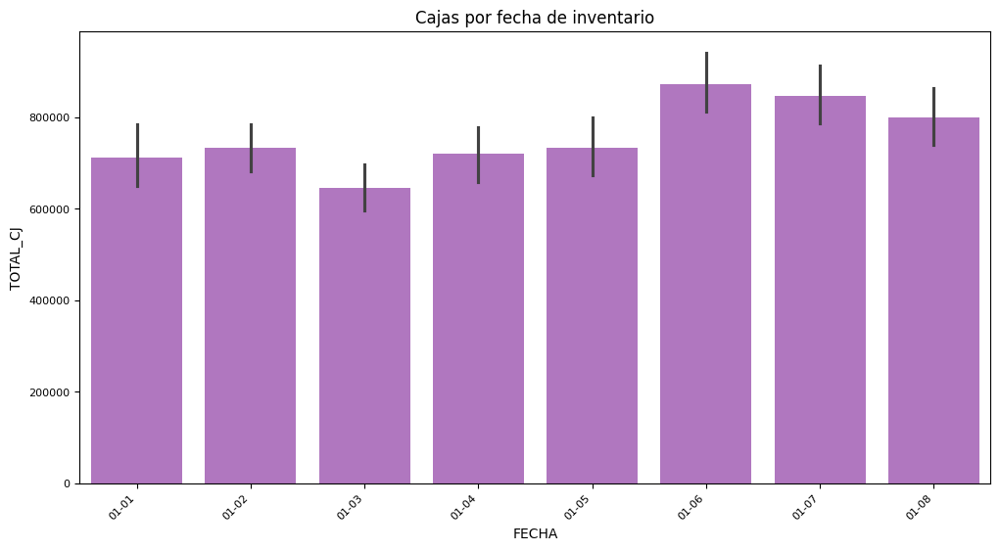

In [472]:
# ¿Qué cantidad de cajas conforman los inventarios del dataset?
plt.figure(figsize=(12, 6))
sns.barplot(data=df,
               x='FECHA',
               y='TOTAL_CJ',
               color = '#B76BCB',
               estimator=sum)
plt.title('Cajas por fecha de inventario')
plt.xticks(rotation=45, ha='right',fontsize=8)
plt.yticks(fontsize=8)
date_format = mdates.DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)
plt.show()

La cantidad de cajas por inventario se encuentra entre 600K y 900K, siendo junio el mes con mayor inventario con 870K, mientras que en marzo solo había 620K.


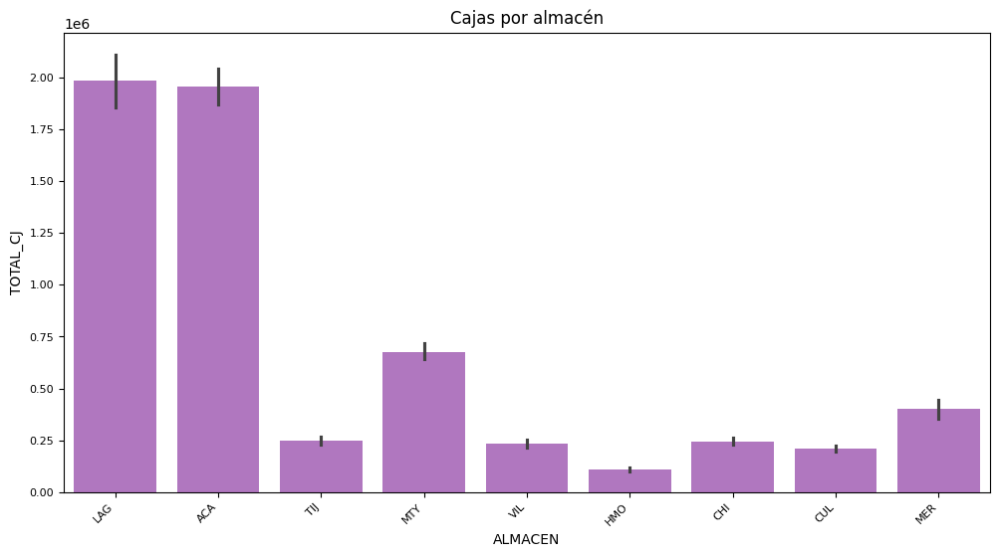

In [473]:
# ¿Qué cantidad de cajas hay por almacén?
plt.figure(figsize=(12, 6))
sns.barplot(data=df,
               x='ALMACEN',
               y='TOTAL_CJ',
               color = '#B76BCB',
               estimator=sum)
plt.title('Cajas por almacén')
plt.xticks(rotation=45, ha='right',fontsize=8)
plt.yticks(fontsize=8)
plt.show()

Los almacenes LAG y ACA tienen la mayor parte del inventario, seguidos de MTY y MER. HMO tiene la menor cantidad de productos.

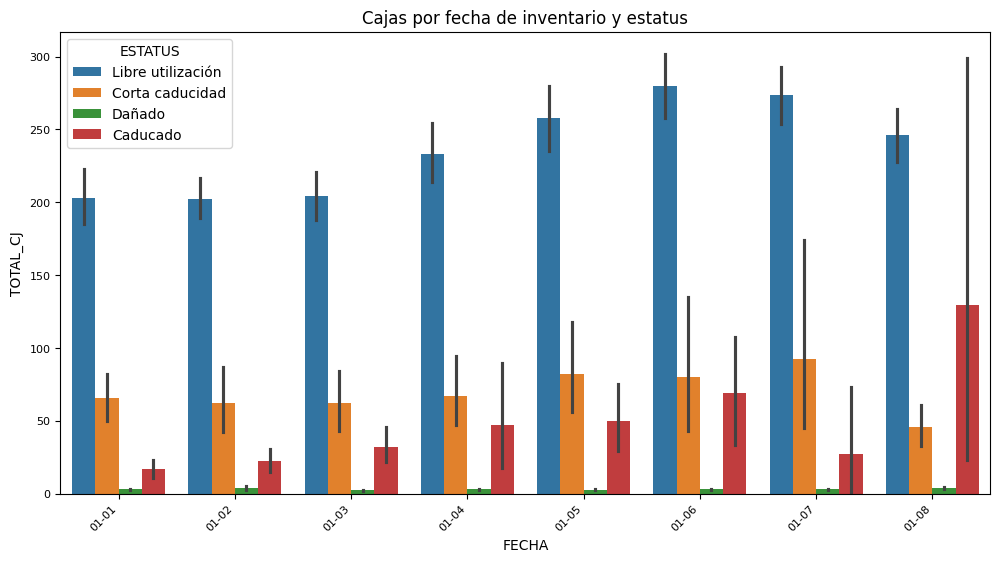

In [474]:
# ¿Qué cantidad de cajas hay por estatus?
plt.figure(figsize=(12, 6))
sns.barplot(data=df,
            x='FECHA',
            y='TOTAL_CJ',
            hue='ESTATUS')
plt.title('Cajas por fecha de inventario y estatus')
plt.xticks(rotation=45, ha='right',fontsize=8)
plt.yticks(fontsize=8)
date_format = mdates.DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)
plt.show()

El 97.5% del inventario se encuentra en libre utilización, lo que significa que esta disponible para la venta regular en los 8 inventarios; el producto caducado incrementa mes a mes y la presencia de producto en corta caducidad se mantiene estática, lo que nos indica que la venta del producto con baja vida útil se complica y levanta una alerta por la posible generación de más producto caducado. El producto dañado permanece constante.

In [475]:
# ¿Cuál es la participación de cajas por estatus?
total_cj_por_estatus = df.groupby(['ESTATUS'])['TOTAL_CJ'].sum()
part_cj_estatus = total_cj_por_estatus / total_cj_por_estatus.sum()
df_cj_estatus = pd.DataFrame({
    'Estatus': part_cj_estatus.index,
    'Porcentaje_cj_est': part_cj_estatus.values})
df_cj_estatus = df_cj_estatus.sort_values(by='Porcentaje_cj_est', ascending=False)
df_cj_estatus

,Estatus,Porcentaje_cj_est
3,Libre utilización,0.975926
1,Corta caducidad,0.016261
2,Dañado,0.003940
0,Caducado,0.003874


Con estos datos se observa que el producto caducado y dañado tiene casi la misma participación en el inventario, aprox. 0.4%. Mientras que el producto con corta caducidad se encuentra sobre el 1.6%.

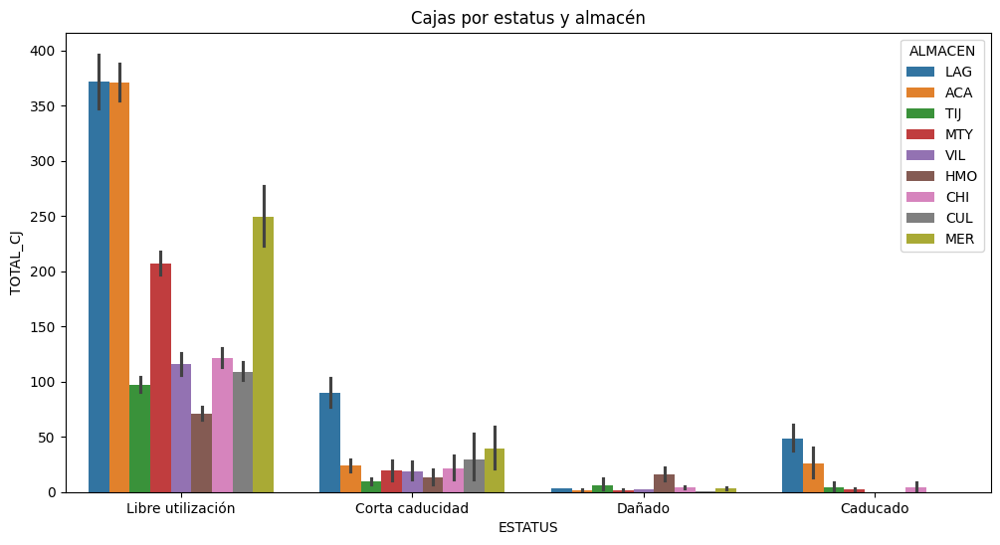

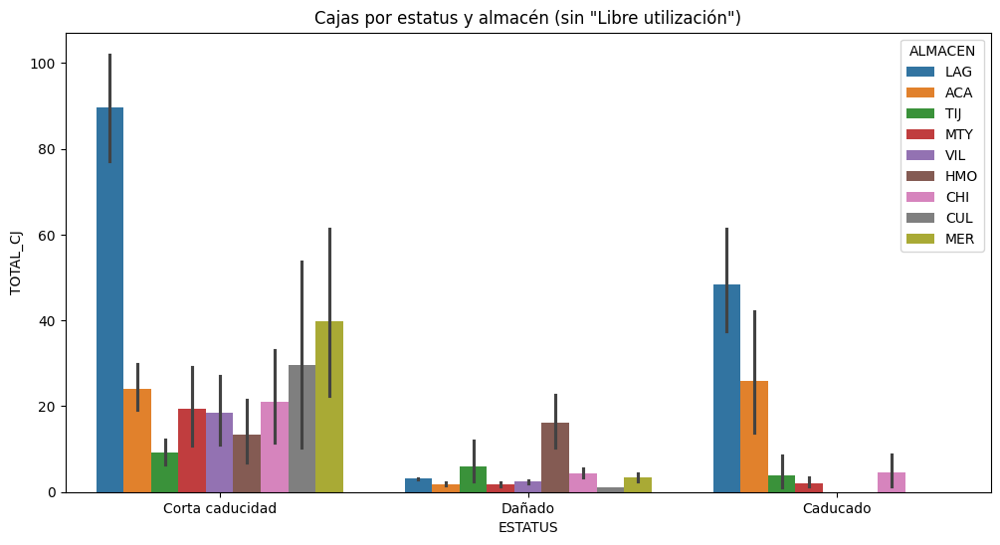

In [476]:
# ¿Como está distribuido el inventario según su estatus y almacén?
plt.figure(figsize=(12, 6))
sns.barplot(data = df,
           x = 'ESTATUS',
           y = 'TOTAL_CJ',
           hue = 'ALMACEN')
plt.title('Cajas por estatus y almacén')
plt.show()

## Gráfico de barras 'Cajas por estatus y almacen', filtrando 'Libre Utilización'
estatus_a_excluir = 'Libre utilización'
df_filtrado = df[df['ESTATUS'] != estatus_a_excluir]
plt.figure(figsize=(12, 6))
sns.barplot(data = df_filtrado,
           x = 'ESTATUS',
           y = 'TOTAL_CJ',
           hue = 'ALMACEN')
plt.title('Cajas por estatus y almacén (sin "{}")'.format(estatus_a_excluir))
plt.show()


Los almacenes LAG y ACA, tiene la mayor participación en el estatus en libre utilización y caducado. MER ocupa la tercer posicion con producto en libre utilización y la segunda en corta caducidad. HMO es el almacén que más producto dañado genera, sin embargo su inventario en libre utilización es el más bajo. Siendo MER y HMO almacenes pequeños, requieren atención por la cantidad de producto en riesgo que están generando.

In [477]:
# ¿Cuál es la participación de cajas por categoría?
total_cj_por_cat = df.groupby('CATEGORIA')['TOTAL_CJ'].sum()
part_cj_cat = total_cj_por_cat / total_cj_por_cat.sum()
df_cj_cat = pd.DataFrame({
    'Categoría': part_cj_cat.index,
    'Porcentaje_cj_cat': part_cj_cat.values})
df_cj_cat = df_cj_cat.sort_values(by='Porcentaje_cj_cat', ascending=False)
df_cj_cat

,Categoría,Porcentaje_cj_cat
0,Bif,0.594222
2,Chocolate,0.165089
1,Bif Exportación,0.083328
4,Chocolate Industrial,0.073998
3,Chocolate Exportación,0.052247
5,Snacks,0.031116


La categoría Bif es la que tiene más participación en el inventario con un 59.4%, le sigue Chocolate con el 16.5%. Snacks solo representa el 3% del total del inventario.

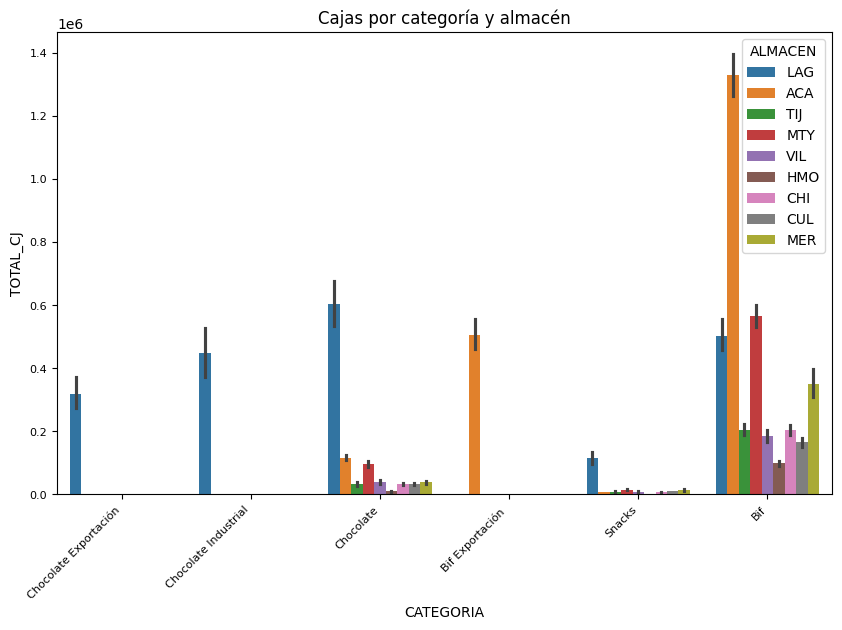

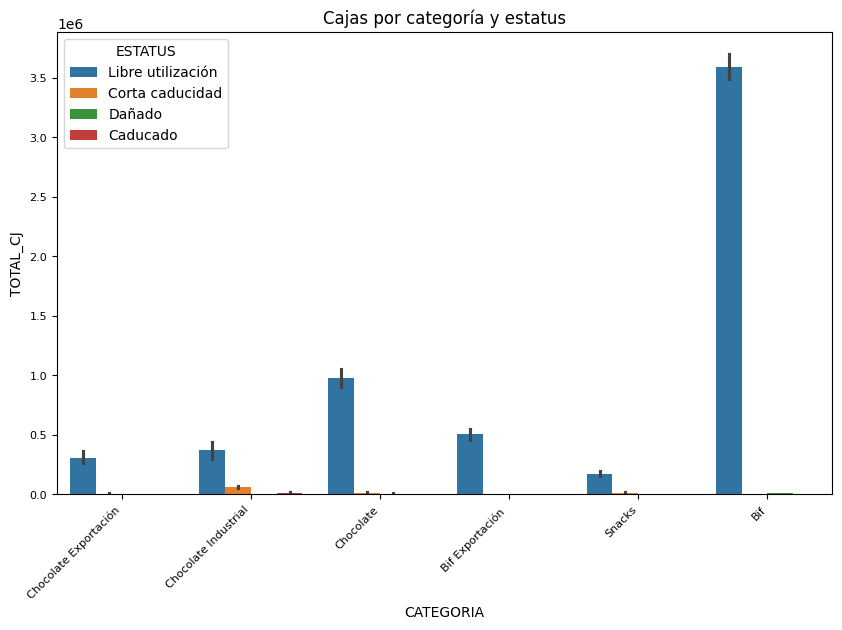

In [478]:
# ¿Como está distribuido el inventario según su categoría y almacén?
plt.figure(figsize=(10, 6))
sns.barplot(data = df,
           x = 'CATEGORIA',
           y = 'TOTAL_CJ',
           hue = 'ALMACEN',
           estimator=sum)
plt.title('Cajas por categoría y almacén')
plt.xticks(rotation=45, ha='right',fontsize=8)
plt.yticks(fontsize=8)
plt.show()

# ¿Como está distribuido el inventario según su categoría y estatus?
plt.figure(figsize=(10, 6))
sns.barplot(data = df,
           x = 'CATEGORIA',
           y = 'TOTAL_CJ',
           hue = 'ESTATUS',
           estimator=sum)
plt.title('Cajas por categoría y estatus')
plt.xticks(rotation=45, ha='right',fontsize=8)
plt.yticks(fontsize=8)
plt.show()

Bif tiene la mayor participación con un 59% seguido de chocolate con un 16%, siendo Snacks el que presenta la menor presencia con 3%.

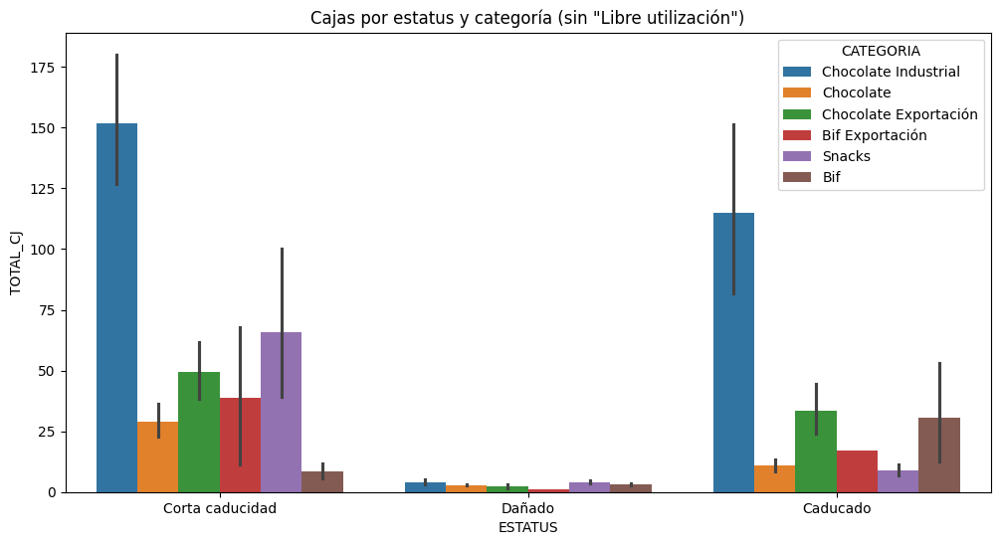

In [479]:
# ¿Como está distribuido el inventario según su estatus y categoría filtrando 'Libre utilización'?
estatus_a_excluir = 'Libre utilización'
df_filtrado = df_filtrado = df[df['ESTATUS'] != estatus_a_excluir]
plt.figure(figsize=(12, 6))
sns.barplot(data = df_filtrado,
           x = 'ESTATUS',
           y = 'TOTAL_CJ',
           hue = 'CATEGORIA')
plt.title('Cajas por estatus y categoría (sin "{}")'.format(estatus_a_excluir))
plt.show()

Sin embargo en las categorías de riesgo, Chocolate Industrial tiene una mayor aportación, tanto en corta caducidad como en caducado. Snacks contribuye con la mayor cantidad de producto dañado.

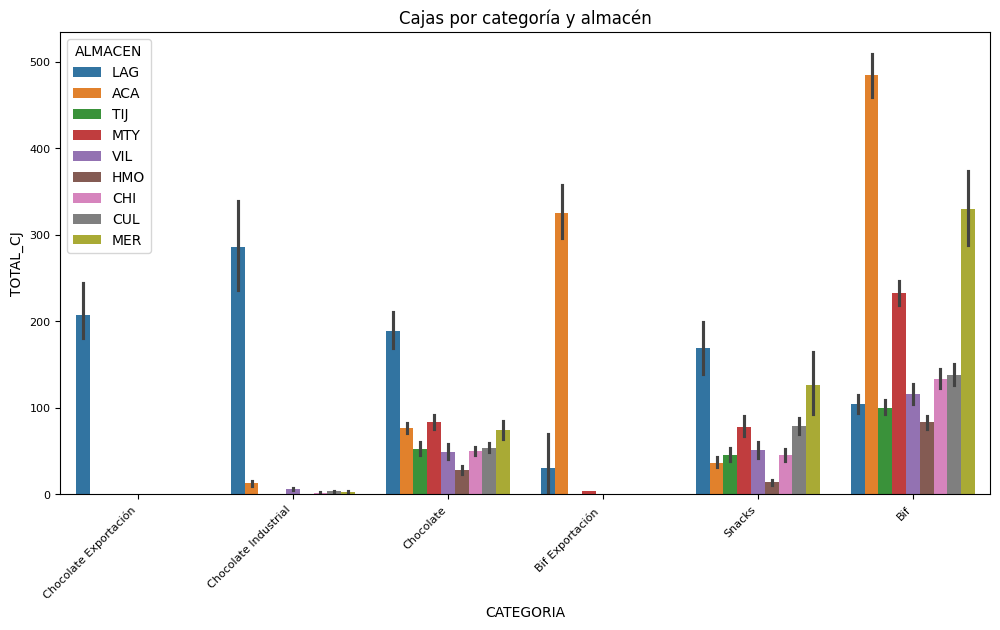

In [480]:
# ¿Como está distribuido el inventario según su categoría y almacén?
plt.figure(figsize=(12, 6))
sns.barplot(data = df,
           x = 'CATEGORIA',
           y = 'TOTAL_CJ',
           hue = 'ALMACEN')
plt.title('Cajas por categoría y almacén')
plt.xticks(rotation=45, ha='right',fontsize=8)
plt.yticks(fontsize=8)
plt.show()

Bif, chocolate y snacks, tienen presencia en los 9 almacenes, Bif exportación solamente en ACA, LAG y MTY, Chocolates exportación soló en LAG, mientras que Chocolate industrial mayoritariamente en LAG.

# CONOCIENDO AL TARJET: TOTAL_CJ

---



Variable objetivo TOTAL_CJ es de tipo numérica, por lo que el modelo a desarrollar será de tipo Aprendizaje Supervisado: Regresión.

A continuación se presentarán algunas estadísticas para entender el comportamiento, formato y distribución de esta variable.

In [481]:
# Calcular algunas estadísticas
variable_target = df['TOTAL_CJ']
variable_target.describe().round(0)

count    34669.0
mean       175.0
std        477.0
min          1.0
25%          3.0
50%         36.0
75%        158.0
max      21002.0
Name: TOTAL_CJ, dtype: float64

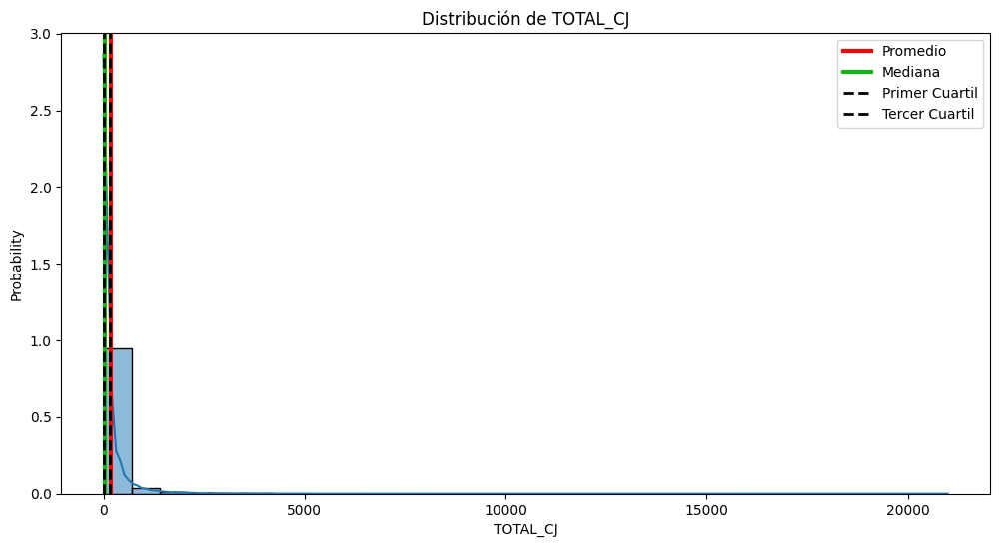

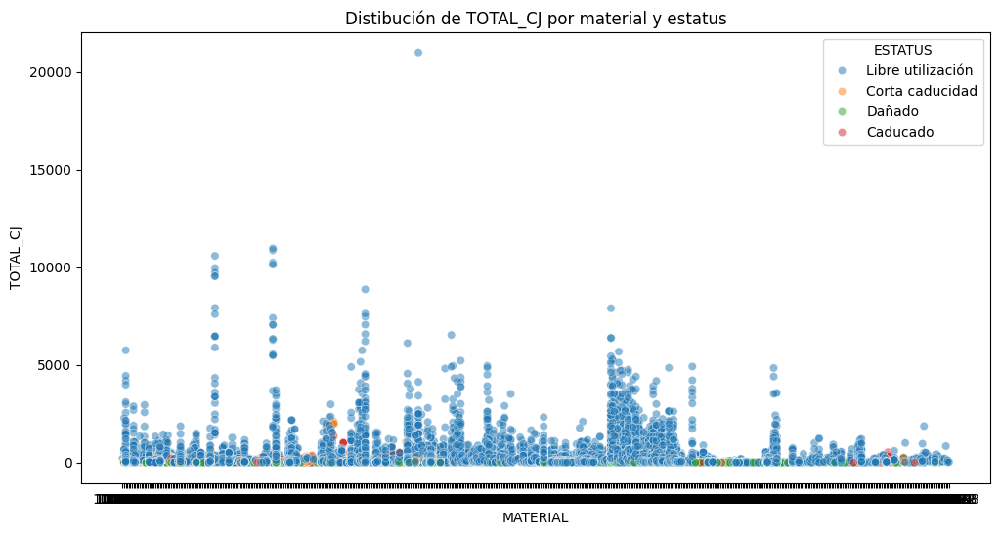

In [482]:
# Calcular algunas medidas de interés y representar en un histograma
media = variable_target.mean()
mediana = variable_target.median()
primer_cuartil = variable_target.quantile(0.25)
tercer_cuartil = variable_target.quantile(0.75)
# Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'TOTAL_CJ',
             bins = 30,
             alpha = 0.5,
             kde = True,
             stat='probability')
# Agregar línea de promedio
plt.axvline(x = media,
            color = 'red',
            linestyle = '-',
            label = 'Promedio',
            linewidth = 3)
# Agregar línea de mediana
plt.axvline(x = mediana,
            color = '#11B613',
            linestyle = '-',
            label = 'Mediana',
            linewidth = 3)
# Agregar línea de primer cuartil
plt.axvline(x = primer_cuartil,
            color = 'black',
            linestyle = '--',
            label = 'Primer Cuartil',
            linewidth = 2)
# Agregar línea de tercer cuartil
plt.axvline(x = tercer_cuartil,
            color = 'black',
            linestyle = '--',
            label = 'Tercer Cuartil',
            linewidth = 2)
plt.legend()
plt.title('Distribución de TOTAL_CJ')
# Ver distribución graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'MATERIAL',
                y = 'TOTAL_CJ',
                hue = 'ESTATUS',
                alpha=0.5)
plt.title('Distibución de TOTAL_CJ por material y estatus')
plt.show()

Se puede observar que la variable tiene una distribución asimétrica positiva (la mediana es menor que el promedio), concentrando la mayoria de los registros (50%) en valores bajos (menores a 36) y observando muy pocos registros en valores altos.

Esto indicaría que hay muy pocos productos con inventarios altos, por lo tanto sería conveniente no considerar los valores altos para los futuras predicciones.

Por lo anterior procederé con la detección y remoción de outliers en espera de mejorar la distibución.

> ## Detección y remoción de outliers en el Tarjet



In [483]:
# Detección de outliers: Método IQR
variable_target = df['TOTAL_CJ']
media = variable_target.mean()
mediana = variable_target.median()
primer_cuartil = variable_target.quantile(0.25)
tercer_cuartil = variable_target.quantile(0.75)
rango_intercuartilico = tercer_cuartil - primer_cuartil
# Límites:
limite_inf = primer_cuartil - (1 * rango_intercuartilico)
limite_sup = tercer_cuartil + (1 * rango_intercuartilico)
print(limite_inf,limite_sup)

-152.0 313.0


In [484]:
# Identificar outliers
df['Outlier_IQR'] = np.where((df['TOTAL_CJ'] < limite_inf) | (df['TOTAL_CJ'] > limite_sup),1,0)
df['Outlier_IQR'].value_counts()

0    29898
1     4771
Name: Outlier_IQR, dtype: int64

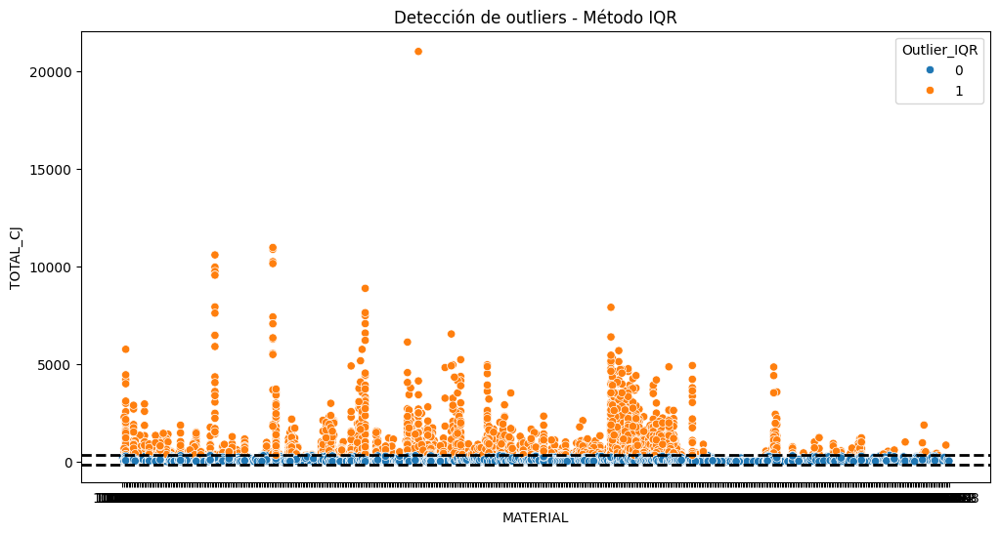

In [485]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'MATERIAL',
                y = 'TOTAL_CJ',
               hue = 'Outlier_IQR')
plt.axhline(y = limite_inf,
            color = 'black',
            linestyle = '--',
            label = 'Limite Inferior',
            linewidth = 2)
plt.axhline(y = limite_sup,
            color = 'black',
            linestyle = '--',
            label = 'Limite Superior',
            linewidth = 2)
plt.title('Detección de outliers - Método IQR')
plt.show()

In [486]:
# Remoción de outliers, tomando como base el resultado del método IQR
df['TOTAL_CJ_Topeada'] = (df['TOTAL_CJ'].clip(-152, 313))

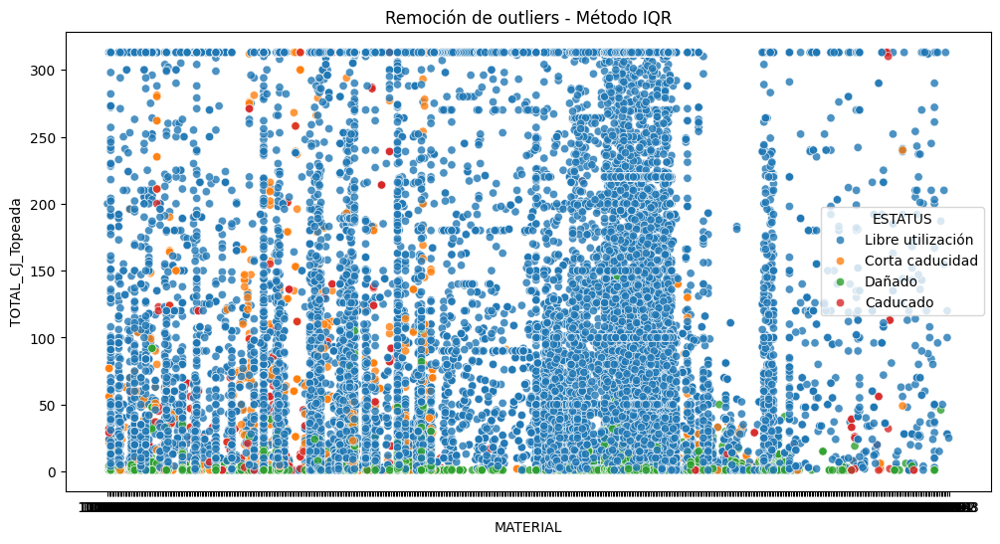

In [487]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'MATERIAL',
                y = 'TOTAL_CJ_Topeada',
                alpha=0.8,
                hue = 'ESTATUS')
plt.title('Remoción de outliers - Método IQR')
plt.show()

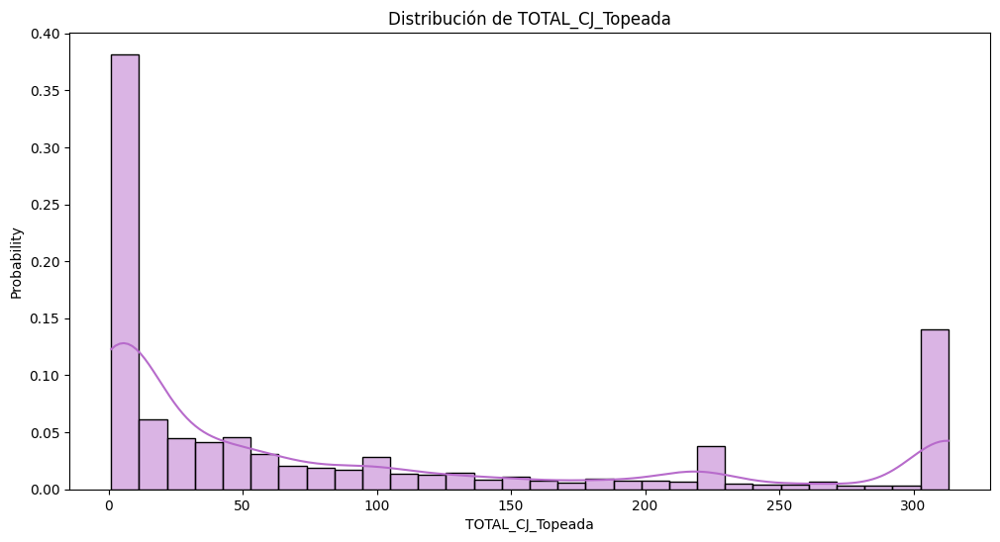

In [488]:
# Graficar nueva distribución del target topeado
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'TOTAL_CJ_Topeada',
             bins = 30,
             alpha = 0.5,
             kde = True,
             stat='probability',
             color = '#B76BCB')
plt.title('Distribución de TOTAL_CJ_Topeada')
plt.show()

## Mejoras al Tarjet

Intentaré mejorar la distribución con el logaritmo del target topeado.

In [489]:
# Generar variable logarítmica
df['TOTAL_CJ_Topeada_Log'] = np.log(df['TOTAL_CJ_Topeada'])

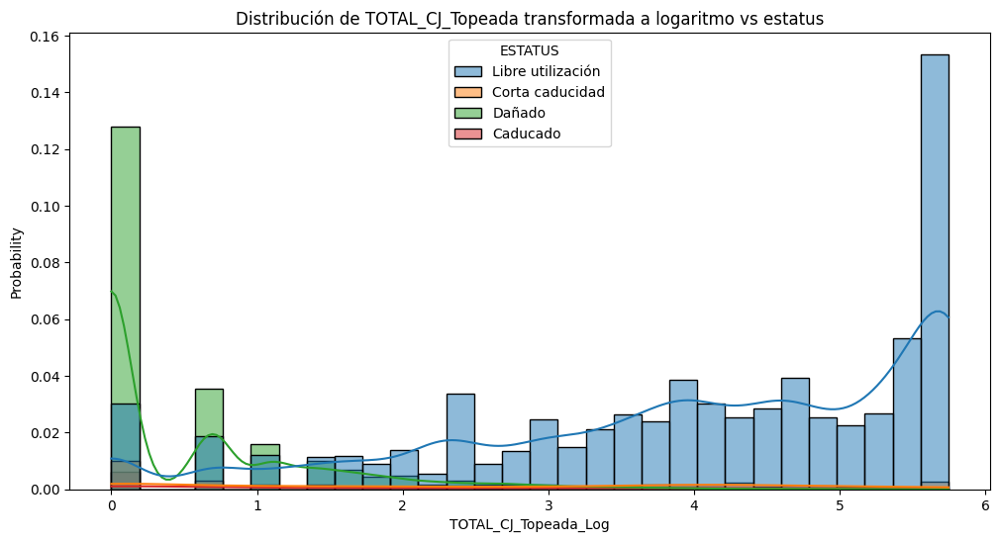

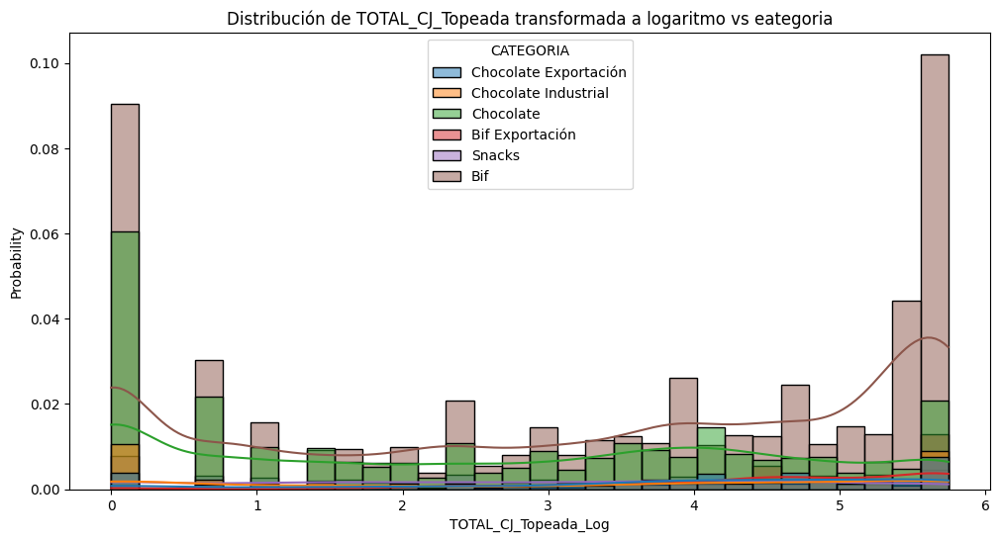

In [490]:
# Gráficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'TOTAL_CJ_Topeada_Log',
             bins = 30,
             alpha = 0.5,
             kde = True,
             hue = 'ESTATUS',
             stat='probability')
plt.title('Distribución de TOTAL_CJ_Topeada transformada a logaritmo vs estatus')
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'TOTAL_CJ_Topeada_Log',
             bins = 30,
             alpha = 0.5,
             kde = True,
             hue = 'CATEGORIA',
             stat='probability')
plt.title('Distribución de TOTAL_CJ_Topeada transformada a logaritmo vs eategoria')
plt.show()

Se aprecia una distribución un poco más normalizada, con 2 picos interesantes en cantidades bajas y medias.

Ahora continuaré el análisis con la variable tarjet topeada logarítmica.


## Reducción de dimensionalidad - Correlación de las variables con el Target



Lo próximo que analizaremos es la correlación entre cada variable disponible y la variable target. Válido únicamente para las variables numéricas, haremos este análisis para detectar cuáles son las variables numéricas más relacionadas con el target, para detenernos en el análisis de algunas de ellas.

In [491]:
## Calculo de matriz de correlación
# Seleccionar solo las columnas numéricas
df_numeric = df.select_dtypes(include=[np.number])
# Calcular la matriz de correlación en las columnas numéricas
matriz_correlacion = df_numeric.corr(method='pearson')
# Seleccionar la correlación con la variable target
matriz_correlacion_target = matriz_correlacion['TOTAL_CJ_Topeada_Log']
# Calcular valor absoluto, para extraer correlaciones más fuertes independientemente de su sentido
matriz_correlacion_target = abs(matriz_correlacion_target)
# Mencionar columnas a excluir del análisis de correlación
columnas_a_excluir = ['TOTAL_CJ','TOTAL_CJ_Topeada','TOTAL_CJ_Topeada_Log','Outlier_IQR']
# Excluir del análisis
matriz_correlacion_target = matriz_correlacion_target.drop(columns=columnas_a_excluir, index=columnas_a_excluir)
# Ordenar de mayor a menor correlación
matriz_correlacion_target = matriz_correlacion_target.sort_values(ascending=False)

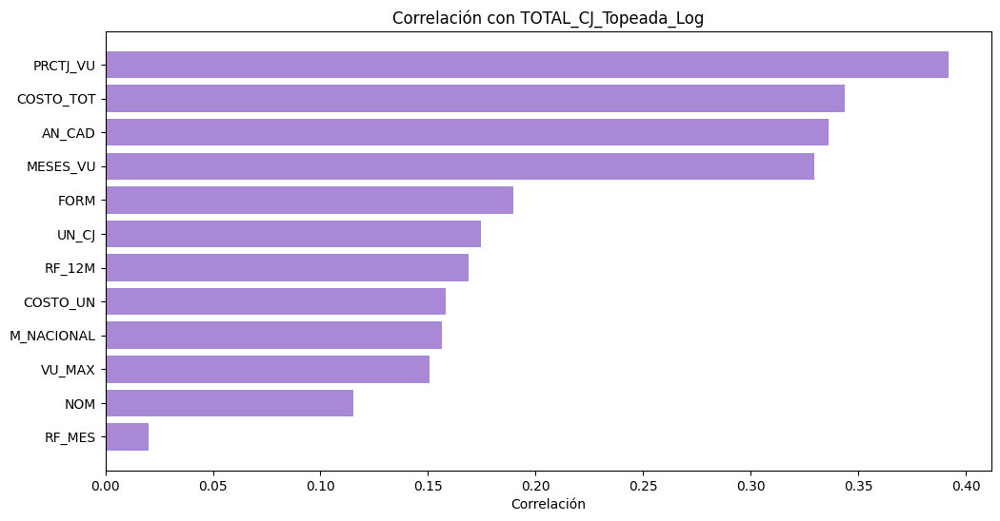

In [492]:
# Graficar variables numéricas más correlacionadas
matriz_correlacion_target_graficar = matriz_correlacion_target[0:30]
plt.figure(figsize=(12, 6))  # Tamaño de la figura
plt.barh(matriz_correlacion_target_graficar.index,
         matriz_correlacion_target_graficar.values,
         color = '#A989D6')
plt.xlabel('Correlación')
plt.title('Correlación con TOTAL_CJ_Topeada_Log')
plt.gca().invert_yaxis()  # Invertir el eje Y para mostrar la característica más relevante en la parte superior
plt.show()

Las 3 variables más correlacionadas con el target son el PRCTJ_VU, COSTO_TOT, AN_CAD y MESES_VU

# CONOCIENDO LOS FEATURES

## PRCTJ_VU

Variable es númerica relacionada con la caducidad del producto. Es cuantitativa.

In [493]:
# Calcular algunas estadísticas de PRCTJ_VU
PRCTJ_VU = df['PRCTJ_VU']
PRCTJ_VU.describe()

count    34669.000000
mean         0.774128
std          0.289594
min         -2.920000
25%          0.720000
50%          0.880000
75%          0.960000
max          1.390000
Name: PRCTJ_VU, dtype: float64

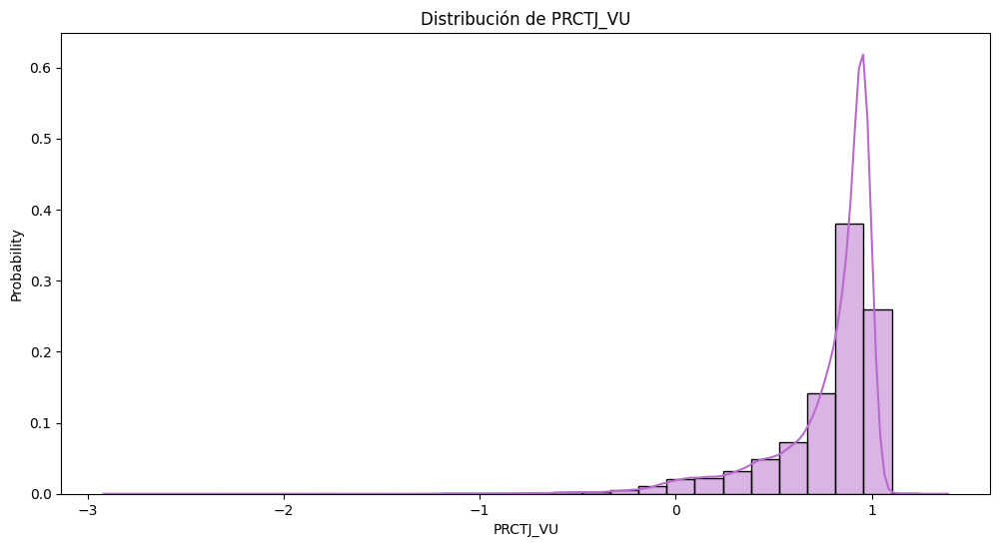

In [494]:
# Histograma
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'PRCTJ_VU',
             bins = 30,
             alpha = 0.5,
             kde = True,
             stat='probability',
             color = '#B76BCB')
plt.title('Distribución de PRCTJ_VU')
plt.show()

Se observa una distribución asimetrica negativa, el 50% (entre el 25 y 75%) tienen entre 72 y 96% de su vida útil disponible.

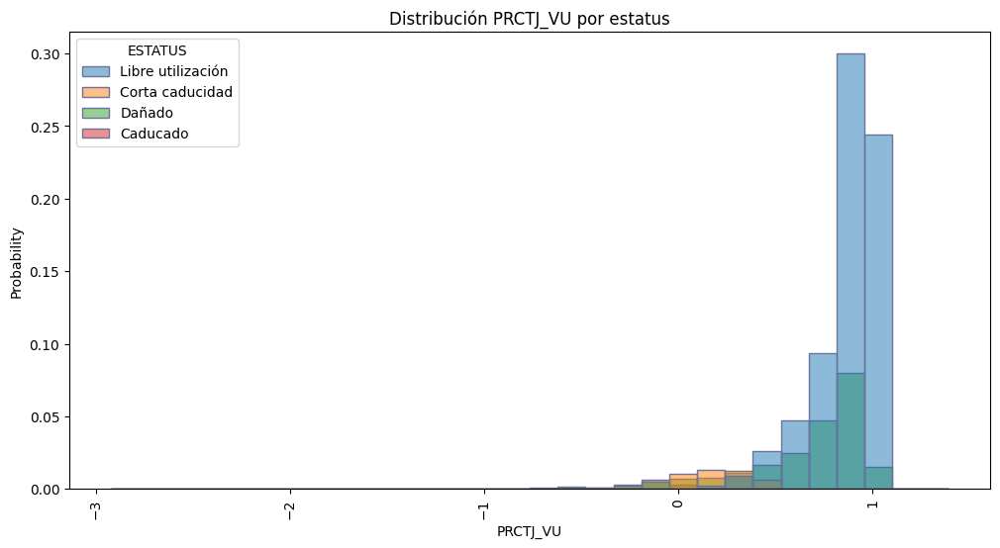

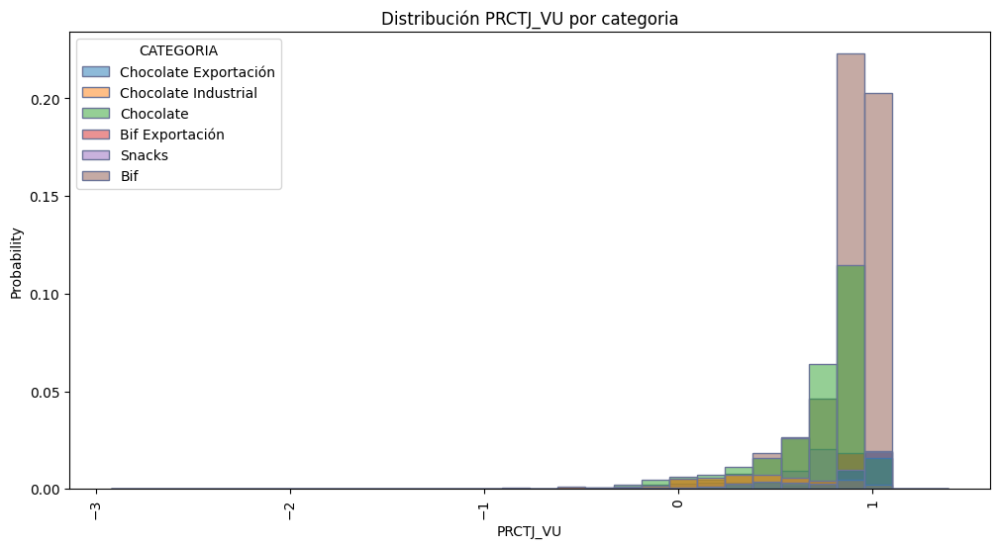

In [495]:
# Graficamente según estatus
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'PRCTJ_VU',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'probability',
             bins = 30,
             hue = 'ESTATUS')
plt.title('Distribución PRCTJ_VU por estatus')
plt.xticks(rotation=90)
plt.show()
# Graficamente según categoría
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'PRCTJ_VU',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'probability',
             bins = 30,
             hue = 'CATEGORIA')
plt.title('Distribución PRCTJ_VU por categoria')
plt.xticks(rotation=90)
plt.show()

Cerca de un 60% del producto en libre utilización presenta una vida útil disponible cercana al 100%, mientras que la el producto con una vida util mayor principalmente es Bif y chocolate.

Text(0.5, 1.0, 'Relación entre PRCTJ_VU y TOTAL_CJ_Topeada_LOG vs categoria')

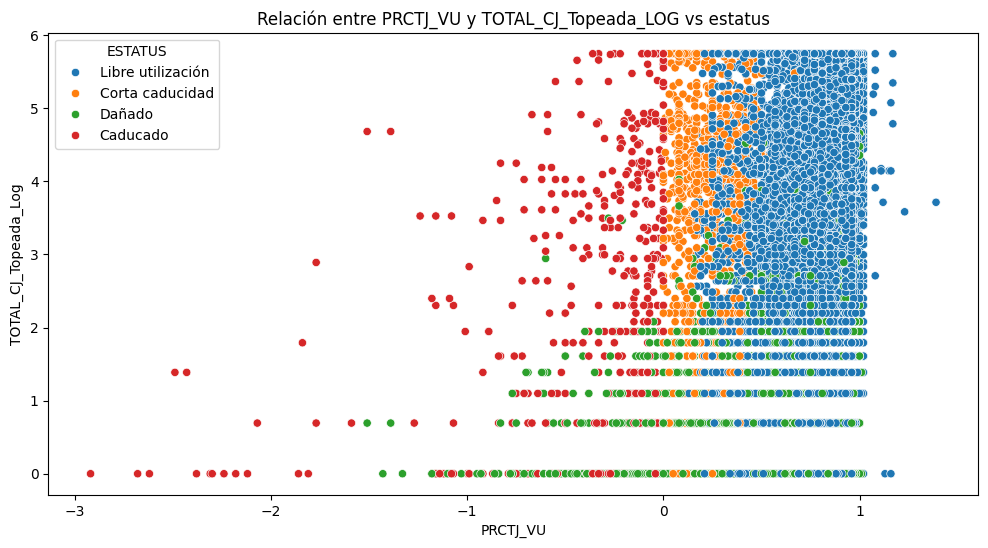

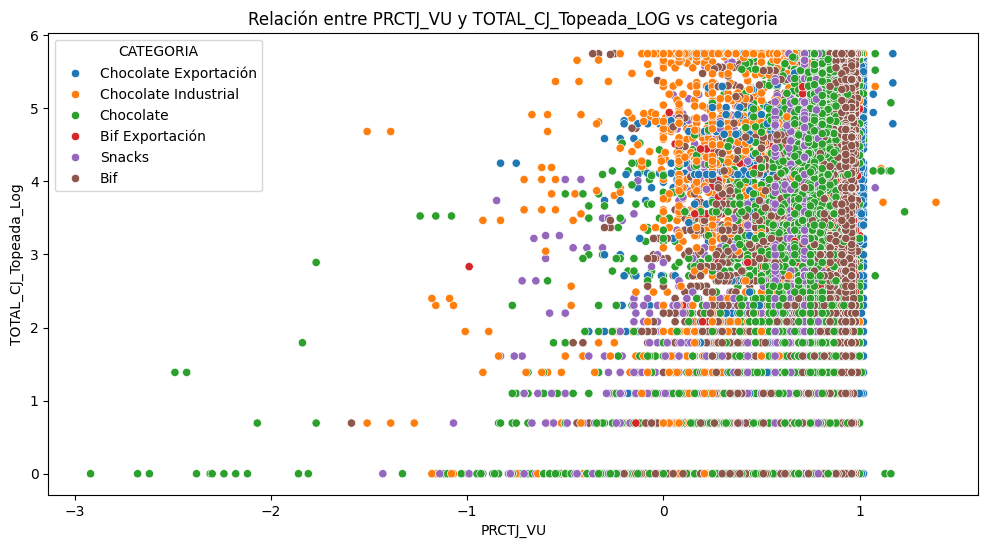

In [496]:
# Relación de PRCTJ_VU,estatus y el target
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'PRCTJ_VU',
            y = 'TOTAL_CJ_Topeada_Log',
            hue = 'ESTATUS')
plt.title('Relación entre PRCTJ_VU y TOTAL_CJ_Topeada_LOG vs estatus')

# Relación de PRCTJ_VU, categoría y el target
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'PRCTJ_VU',
            y = 'TOTAL_CJ_Topeada_Log',
            hue = 'CATEGORIA')
plt.title('Relación entre PRCTJ_VU y TOTAL_CJ_Topeada_LOG vs categoria')

Se observan algunos outliers con valores mayores 100% para esta variable, procederé a topearla.

In [497]:
# Detección de outliers: Método IQR
variable_PRCTJ_VU = df['PRCTJ_VU']
media = variable_PRCTJ_VU.mean()
mediana = variable_PRCTJ_VU.median()
primer_cuartil = variable_PRCTJ_VU.quantile(0.25)
tercer_cuartil = variable_PRCTJ_VU.quantile(0.75)
rango_intercuartilico = tercer_cuartil - primer_cuartil
# Límites:
limite_inf = primer_cuartil - (3 * rango_intercuartilico)
limite_sup = tercer_cuartil + (0.2 * rango_intercuartilico)
print(limite_inf,limite_sup)

0.0 1.008


In [498]:
# Identificar outliers
df['Outlier_IQR'] = np.where((df['PRCTJ_VU'] < limite_inf) | (df['PRCTJ_VU'] > limite_sup),1,0)
df['Outlier_IQR'].value_counts()

0    33434
1     1235
Name: Outlier_IQR, dtype: int64

Text(0.5, 1.0, 'Detección de Outliers - Método IQR')

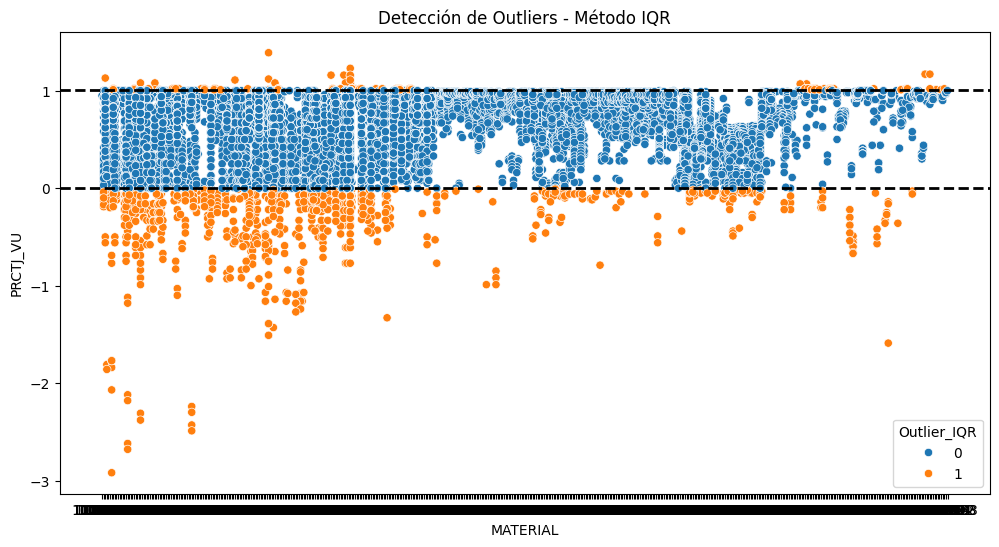

In [499]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'MATERIAL',
                y = 'PRCTJ_VU',
               hue = 'Outlier_IQR')
plt.axhline(y = limite_inf,
            color = 'black',
            linestyle = '--',
            label = 'Limite Inferior',
            linewidth = 2)
plt.axhline(y = limite_sup,
            color = 'black',
            linestyle = '--',
            label = 'Limite Superior',
            linewidth = 2)
plt.title('Detección de Outliers - Método IQR')

In [500]:
# Remoción de outliers, tomando como base el resultado del método IQR
df['PRCTJ_VU_Topeada'] = (df['PRCTJ_VU'].clip(0, 1.00))

Text(0.5, 1.0, 'Remoción de Outliers - Método IQR')

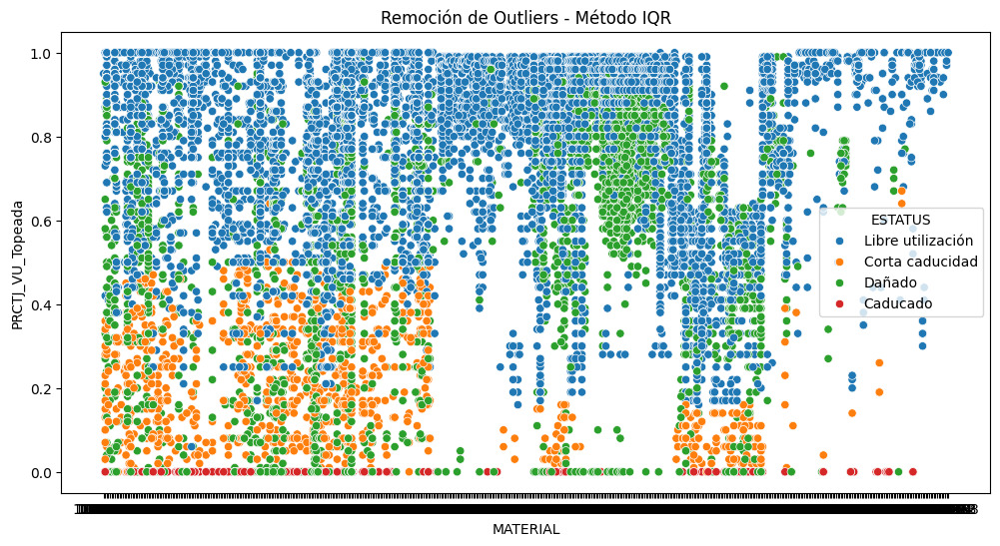

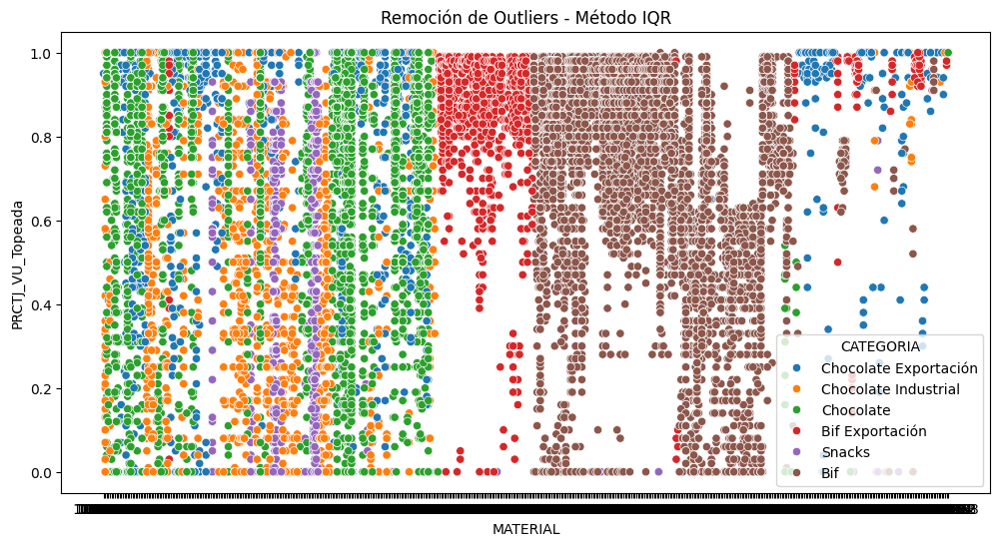

In [501]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'MATERIAL',
                y = 'PRCTJ_VU_Topeada',
               hue = 'ESTATUS')
plt.title('Remoción de Outliers - Método IQR')
# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'MATERIAL',
                y = 'PRCTJ_VU_Topeada',
               hue = 'CATEGORIA')
plt.title('Remoción de Outliers - Método IQR')

El producto en libre utilización tiene la mayor vida útil disponible, lo cual es de esperarse para que el stock se desplace sin contratiempos.

Text(0.5, 1.0, 'Distribución de PRCTJ_VU_Topeada')

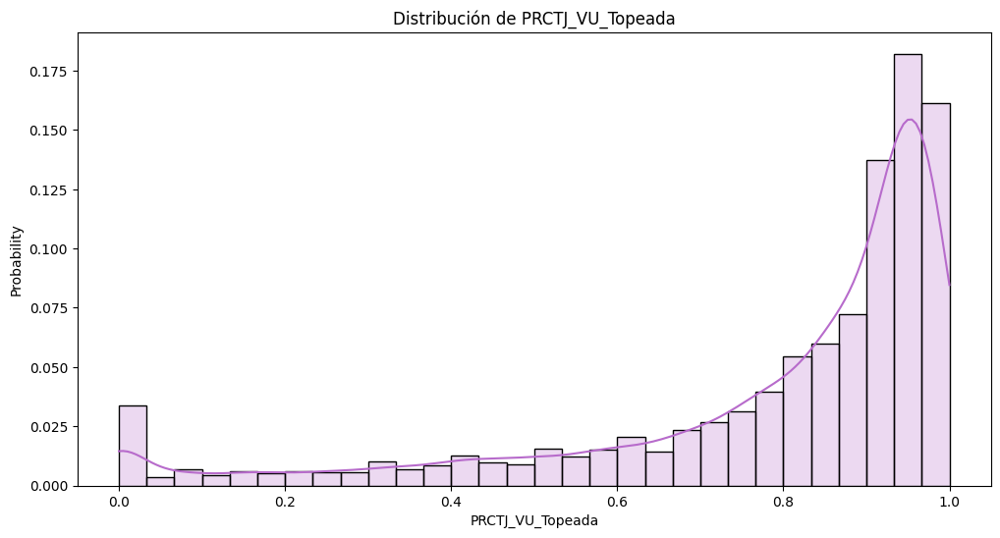

In [502]:
# Graficar nueva distribución del PRCTJ_VU topeada
plt.figure(figsize=(12, 6))

# Histograma
sns.histplot(data = df,
             x = 'PRCTJ_VU_Topeada',
             bins = 30,
             alpha = 0.25,
             kde = True,
             stat='probability',
             color = '#B76BCB')
plt.title('Distribución de PRCTJ_VU_Topeada')

Se observa una distribución asimetrica a izquierda, den la mayor parte del inventario tiene buena vida útil.

Text(0.5, 1.0, 'Relación entre PRCTJ_VU_Topeada y TOTAL_CJ_Topeada_LOG vs estatus')

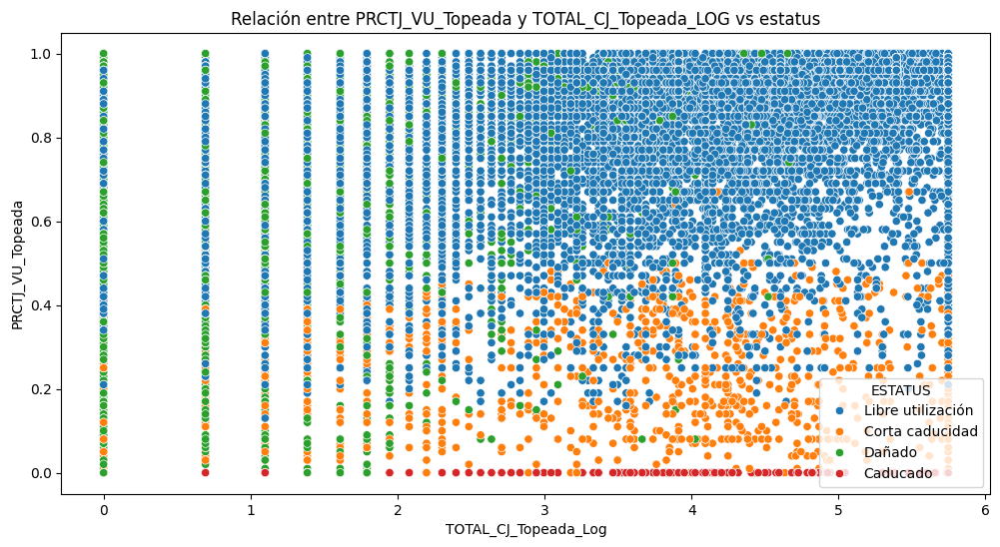

In [503]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'TOTAL_CJ_Topeada_Log',
                y = 'PRCTJ_VU_Topeada',
               hue = 'ESTATUS')
plt.title('Relación entre PRCTJ_VU_Topeada y TOTAL_CJ_Topeada_LOG vs estatus')

In [504]:
coeficiente = df[['PRCTJ_VU_Topeada','TOTAL_CJ_Topeada_Log']].corr(method='pearson')
coeficiente

,PRCTJ_VU_Topeada,TOTAL_CJ_Topeada_Log
PRCTJ_VU_Topeada,1.00000,0.41557
TOTAL_CJ_Topeada_Log,0.41557,1.00000


Se aprecia correlación con el target, aunque no es muy alta puede servir para modelar.

## COSTO_TOT

Variable númerica, depende la cantidad de cajas existentes del material. Es cuantitativa.

In [505]:
# Calcular algunas estadísticas de COSTO_TOT
COSTO_TOT = df['COSTO_TOT']
COSTO_TOT.describe().round()

count      34669.0
mean       40005.0
std       116596.0
min           80.0
25%          831.0
50%         8488.0
75%        31468.0
max      3570340.0
Name: COSTO_TOT, dtype: float64

(array([-500000.,       0.,  500000., 1000000., 1500000., 2000000.,
        2500000., 3000000., 3500000., 4000000.]),
 [Text(-500000.0, 0, '−0.5'),
  Text(0.0, 0, '0.0'),
  Text(500000.0, 0, '0.5'),
  Text(1000000.0, 0, '1.0'),
  Text(1500000.0, 0, '1.5'),
  Text(2000000.0, 0, '2.0'),
  Text(2500000.0, 0, '2.5'),
  Text(3000000.0, 0, '3.0'),
  Text(3500000.0, 0, '3.5'),
  Text(4000000.0, 0, '4.0')])

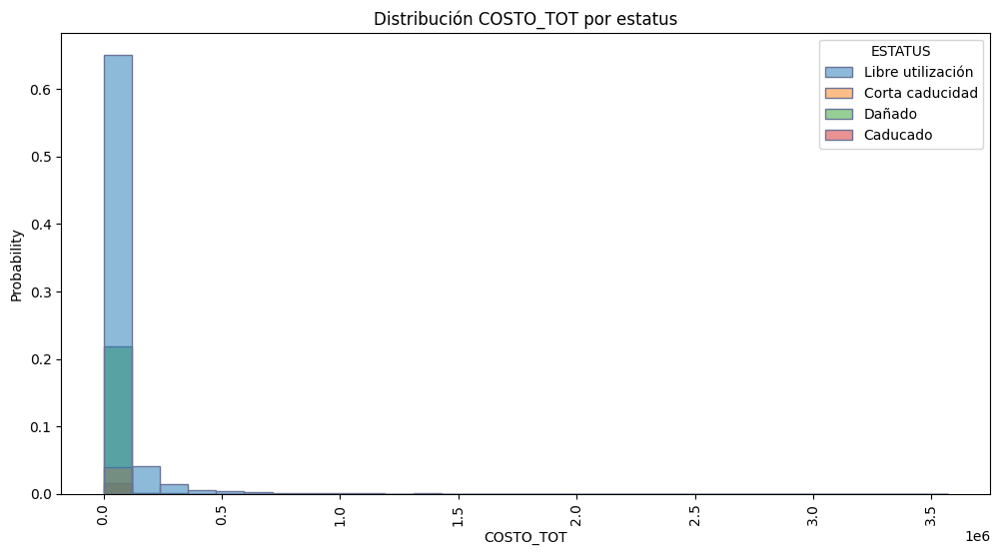

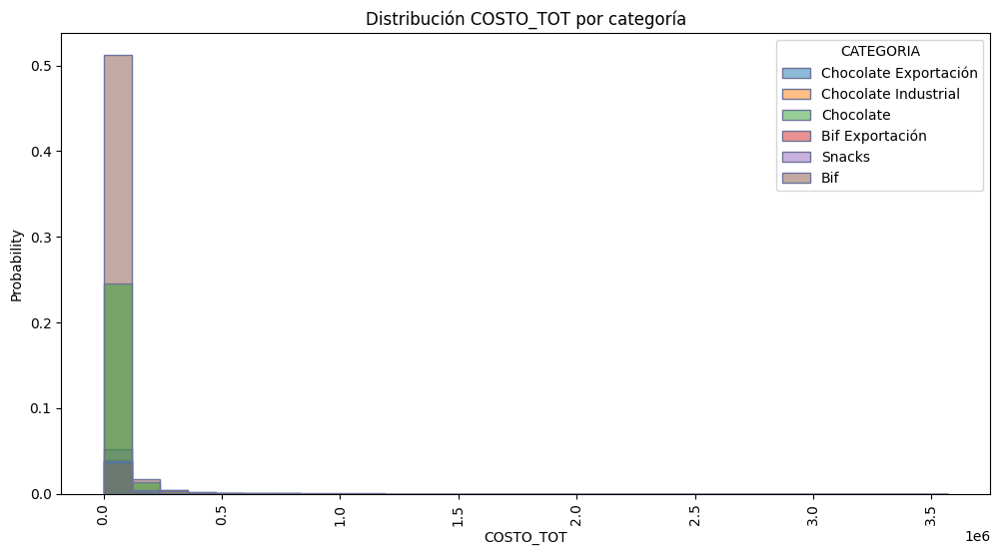

In [506]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'COSTO_TOT',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'probability',
             bins = 30,
             hue = 'ESTATUS')
plt.title('Distribución COSTO_TOT por estatus')
plt.xticks(rotation=90)

# Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'COSTO_TOT',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'probability',
             bins = 30,
             hue = 'CATEGORIA')
plt.title('Distribución COSTO_TOT por categoría')
plt.xticks(rotation=90)

El 75% del producto tienen costos menores a 31,468, y solo una pequeña parte del inventario tiene costo alto, con esta información procederé a topear la variable para eliminar outliers.

In [507]:
# Detección de outliers: Método IQR
variable_COSTO_TOT = df['COSTO_TOT']
media = variable_COSTO_TOT.mean()
mediana = variable_COSTO_TOT.median()
primer_cuartil = variable_COSTO_TOT.quantile(0.25)
tercer_cuartil = variable_COSTO_TOT.quantile(0.75)
rango_intercuartilico = tercer_cuartil - primer_cuartil
# Límites:
limite_inf = primer_cuartil - (3 * rango_intercuartilico)
limite_sup = tercer_cuartil + (3 * rango_intercuartilico)
print(limite_inf, limite_sup)

-91081.43999999999 123380.63999999998


In [508]:
# Identificar outliers
df['Outlier_IQR'] = np.where((df['COSTO_TOT'] < limite_inf) | (df['COSTO_TOT'] > limite_sup),1,0)
df['Outlier_IQR'].value_counts()

0    32189
1     2480
Name: Outlier_IQR, dtype: int64

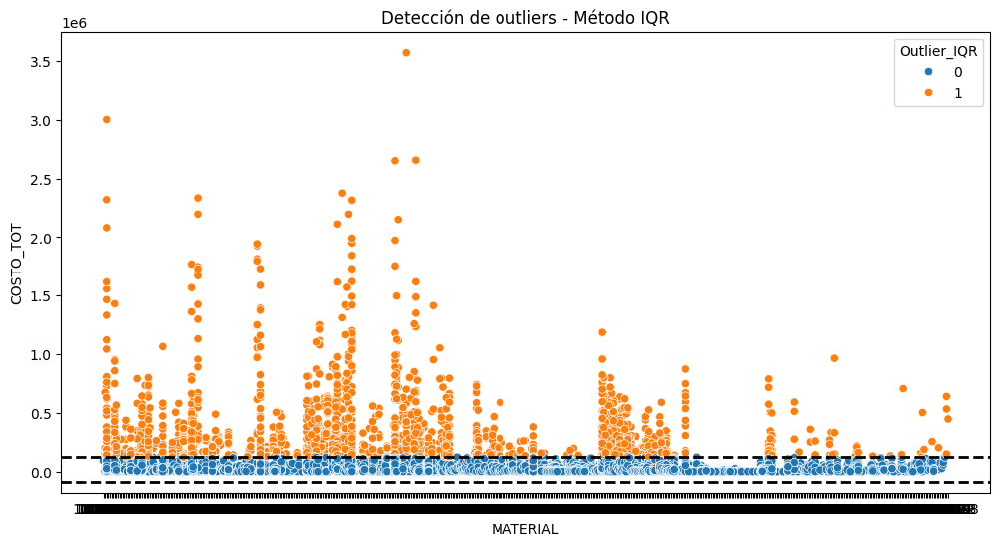

In [509]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'MATERIAL',
                y = 'COSTO_TOT',
               hue = 'Outlier_IQR')
plt.axhline(y = limite_inf,
            color = 'black',
            linestyle = '--',
            label = 'Limite Inferior',
            linewidth = 2)
plt.axhline(y = limite_sup,
            color = 'black',
            linestyle = '--',
            label = 'Limite Superior',
            linewidth = 2)
plt.title('Detección de outliers - Método IQR')
plt.show()

In [510]:
# Remoción de outliers, tomando como base el resultado del método IQR
df['COSTO_TOT_Topeada'] = (df['COSTO_TOT'].clip(-91081.43999999999, 123380.63999999998))

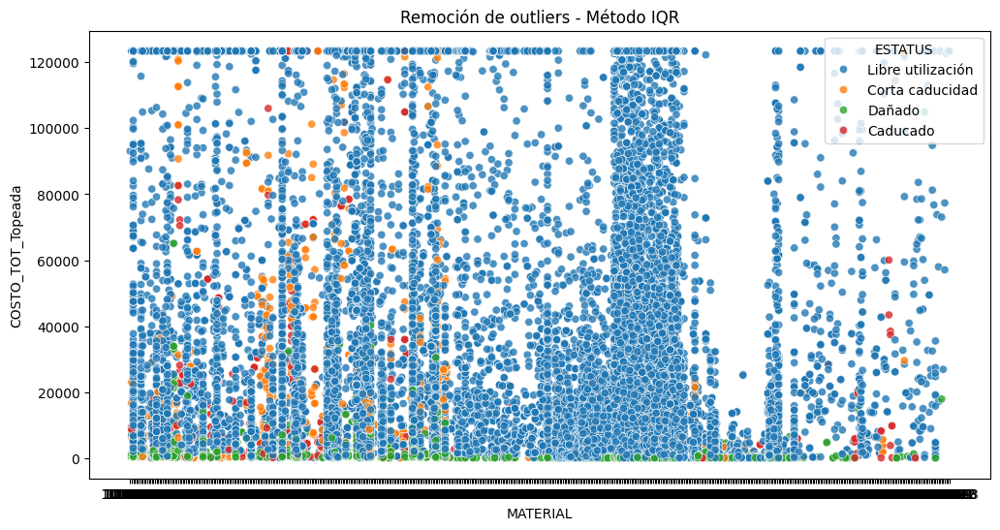

In [511]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'MATERIAL',
                y = 'COSTO_TOT_Topeada',
                alpha=0.8,
                hue = 'ESTATUS')
plt.title('Remoción de outliers - Método IQR')
plt.show()

In [512]:
# Variable logarítmica para mejorar distribución
df['COSTO_TOT_Topeada_Log'] = np.log(df['COSTO_TOT_Topeada'])

(array([ 4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.]),
 [Text(4.0, 0, '4'),
  Text(5.0, 0, '5'),
  Text(6.0, 0, '6'),
  Text(7.0, 0, '7'),
  Text(8.0, 0, '8'),
  Text(9.0, 0, '9'),
  Text(10.0, 0, '10'),
  Text(11.0, 0, '11'),
  Text(12.0, 0, '12'),
  Text(13.0, 0, '13')])

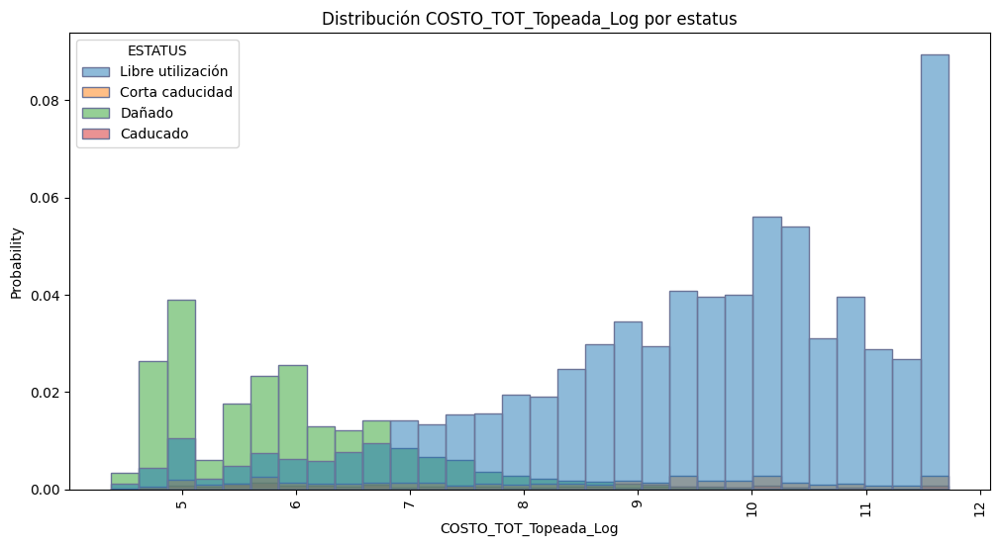

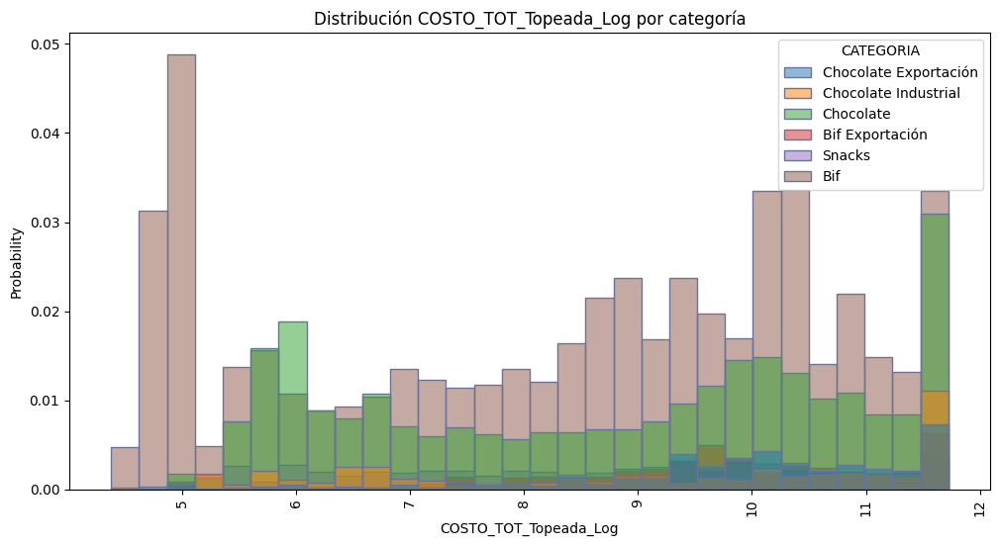

In [513]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'COSTO_TOT_Topeada_Log',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'probability',
             bins = 30,
             hue = 'ESTATUS')
plt.title('Distribución COSTO_TOT_Topeada_Log por estatus')
plt.xticks(rotation=90)

# Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'COSTO_TOT_Topeada_Log',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'probability',
             bins = 30,
             hue = 'CATEGORIA')
plt.title('Distribución COSTO_TOT_Topeada_Log por categoría')
plt.xticks(rotation=90)

Observamos que el producto más costoso se encuentra el libre utilización, lo cuál es bueno pues representa la mayor parte del inventario que puede ser comercializado de forma regular. Bif es el producto que representa el mayor valor dentro del inventario, seguido de chocolate. Esto puede estar asociado a la cantidad de cajas que existentes en cada categoría.

Text(0.5, 1.0, 'Relación entre los Logaritmos del COSTO_TOT y TOTAL_CJ Topeada vs categoria')

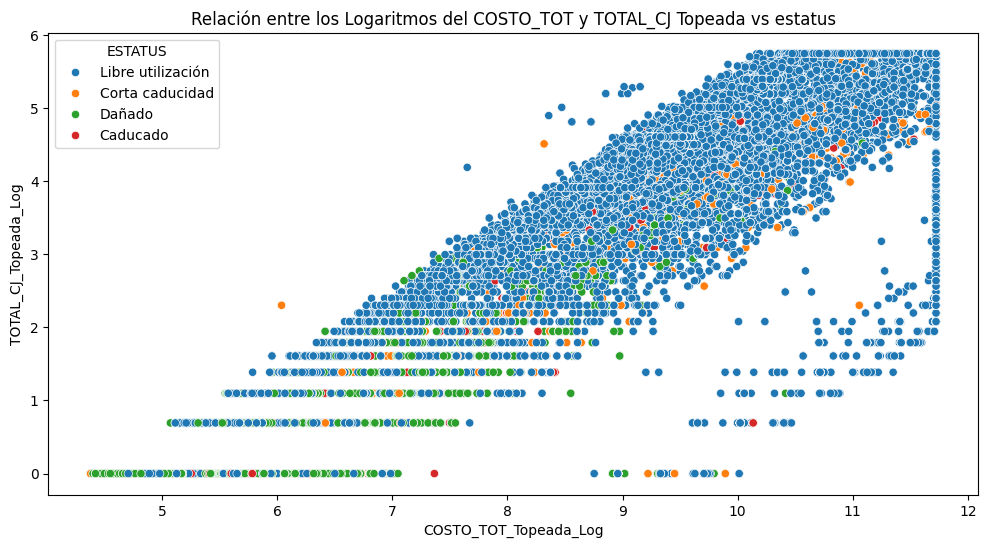

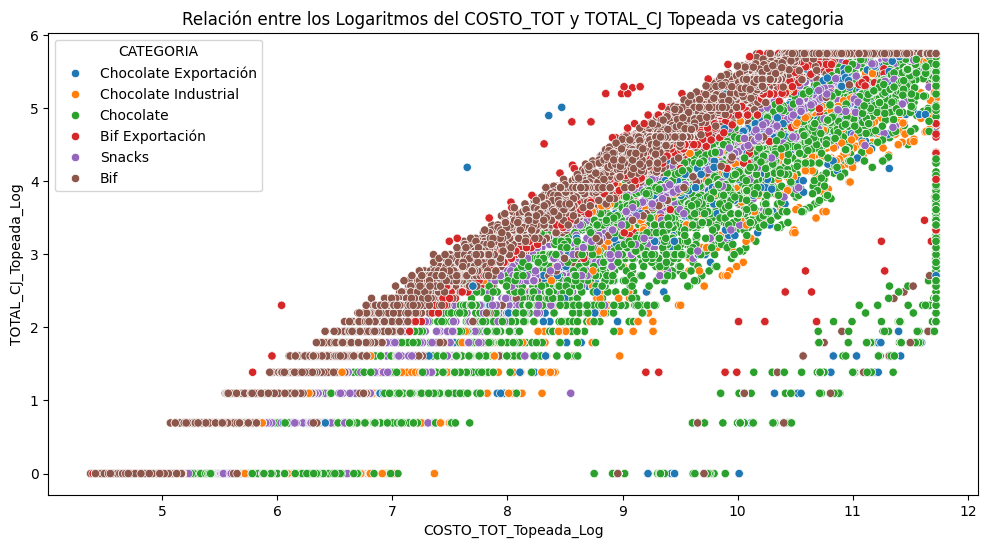

In [514]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'COSTO_TOT_Topeada_Log',
            y = 'TOTAL_CJ_Topeada_Log',
            hue = 'ESTATUS')
plt.title('Relación entre los Logaritmos del COSTO_TOT y TOTAL_CJ Topeada vs estatus')

# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'COSTO_TOT_Topeada_Log',
            y = 'TOTAL_CJ_Topeada_Log',
            hue = 'CATEGORIA')
plt.title('Relación entre los Logaritmos del COSTO_TOT y TOTAL_CJ Topeada vs categoria')

In [515]:
coeficiente = df[['COSTO_TOT_Topeada_Log','TOTAL_CJ_Topeada_Log']].corr(method='pearson')
coeficiente

,COSTO_TOT_Topeada_Log,TOTAL_CJ_Topeada_Log
COSTO_TOT_Topeada_Log,1.000000,0.908074
TOTAL_CJ_Topeada_Log,0.908074,1.000000


Se puede apreciar que a medida que aumenta la cantidad de cajas, aumenta el costo total. Se comprueba correlación existente y es muy fuerte (0.90). A mayor cantidad cajas, mayor costo.

## AN_CAD

Variable númerica que depende de la fecha de caducidad del producto. Es cuantitativa.

In [516]:
# Calcular algunas estadísticas de AN_CAD
AN_CAD = df['AN_CAD']
AN_CAD.describe().round()

count    34669.0
mean      2025.0
std          1.0
min       2018.0
25%       2024.0
50%       2025.0
75%       2026.0
max       2026.0
Name: AN_CAD, dtype: float64

(array([2017., 2018., 2019., 2020., 2021., 2022., 2023., 2024., 2025.,
        2026., 2027.]),
 [Text(2017.0, 0, '2017'),
  Text(2018.0, 0, '2018'),
  Text(2019.0, 0, '2019'),
  Text(2020.0, 0, '2020'),
  Text(2021.0, 0, '2021'),
  Text(2022.0, 0, '2022'),
  Text(2023.0, 0, '2023'),
  Text(2024.0, 0, '2024'),
  Text(2025.0, 0, '2025'),
  Text(2026.0, 0, '2026'),
  Text(2027.0, 0, '2027')])

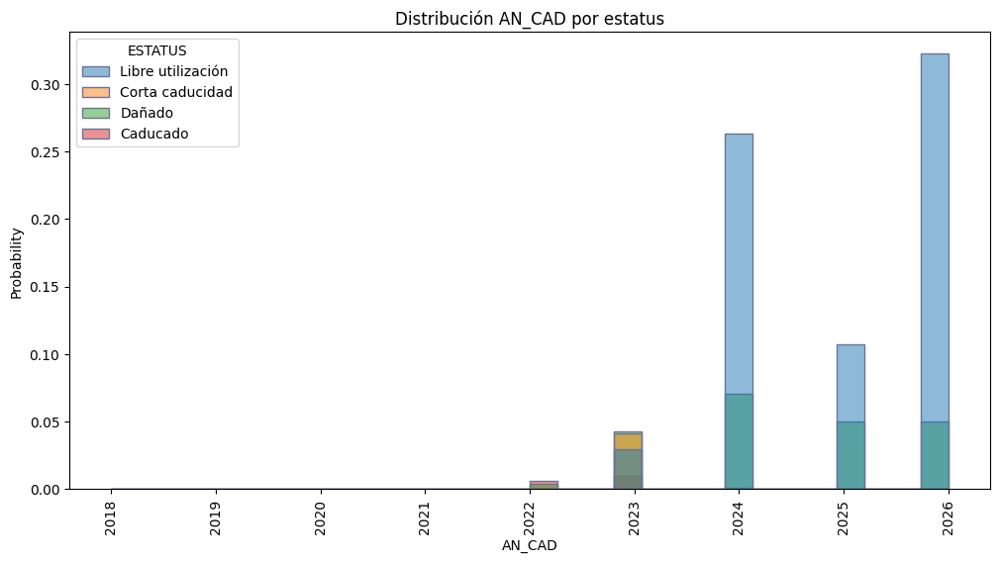

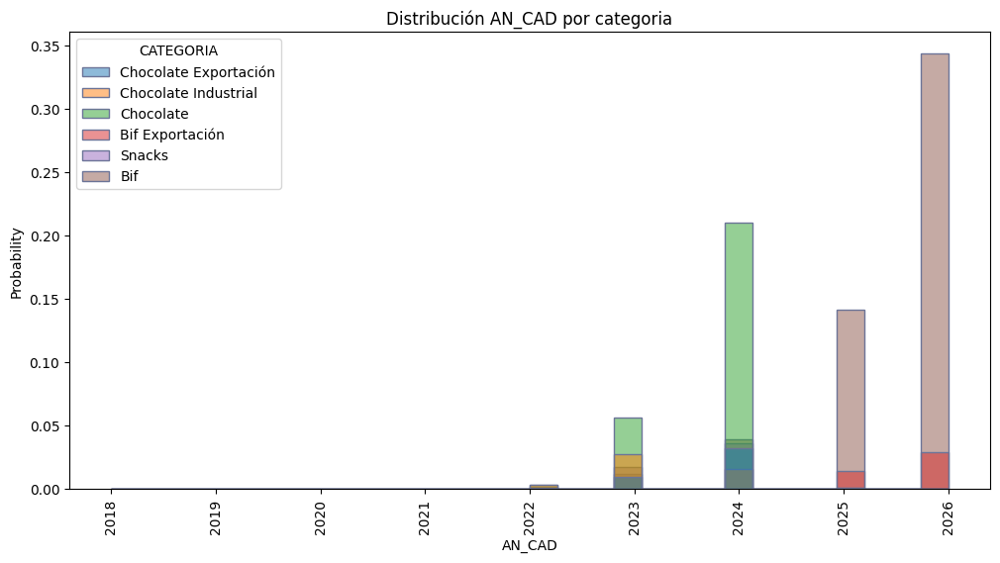

In [517]:
#Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'AN_CAD',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'probability',
             bins = 30,
             hue = 'ESTATUS')
plt.title('Distribución AN_CAD por estatus')
plt.xticks(rotation=90)

#Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'AN_CAD',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'probability',
             bins = 30,
             hue = 'CATEGORIA')
plt.title('Distribución AN_CAD por categoria')
plt.xticks(rotation=90)

Se observan algunos outliers en años menores a 2022, procederé a topearla la variable.

In [518]:
# Detección de outliers: Método IQR
variable_COSTO_TOT = df['AN_CAD']
media = variable_COSTO_TOT.mean()
mediana = variable_COSTO_TOT.median()
primer_cuartil = variable_COSTO_TOT.quantile(0.25)
tercer_cuartil = variable_COSTO_TOT.quantile(0.75)
rango_intercuartilico = tercer_cuartil - primer_cuartil
# Límites:
limite_inf = primer_cuartil - (1 * rango_intercuartilico)
limite_sup = tercer_cuartil + (3 * rango_intercuartilico)
print(limite_inf, limite_sup)

2022.0 2032.0


In [519]:
# Identificar outliers
df['Outlier_IQR'] = np.where((df['AN_CAD'] < limite_inf) | (df['AN_CAD'] > limite_sup),1,0)
df['Outlier_IQR'].value_counts()

0    34638
1       31
Name: Outlier_IQR, dtype: int64

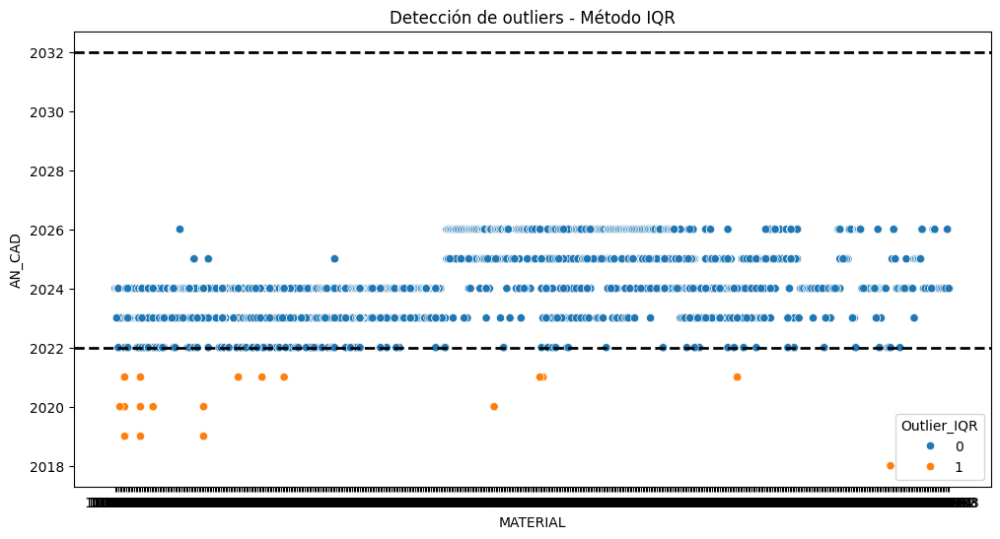

In [520]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'MATERIAL',
                y = 'AN_CAD',
               hue = 'Outlier_IQR')
plt.axhline(y = limite_inf,
            color = 'black',
            linestyle = '--',
            label = 'Limite Inferior',
            linewidth = 2)
plt.axhline(y = limite_sup,
            color = 'black',
            linestyle = '--',
            label = 'Limite Superior',
            linewidth = 2)
plt.title('Detección de outliers - Método IQR')
plt.show()

In [521]:
# Remoción de outliers, tomando como base el resultado del método IQR
df['AN_CAD_Topeada'] = (df['AN_CAD'].clip(2022, 2032))

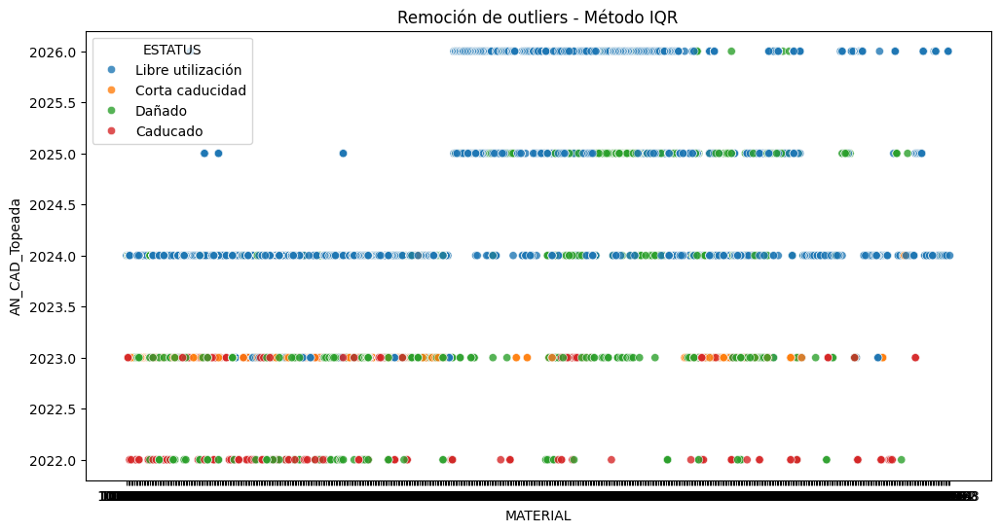

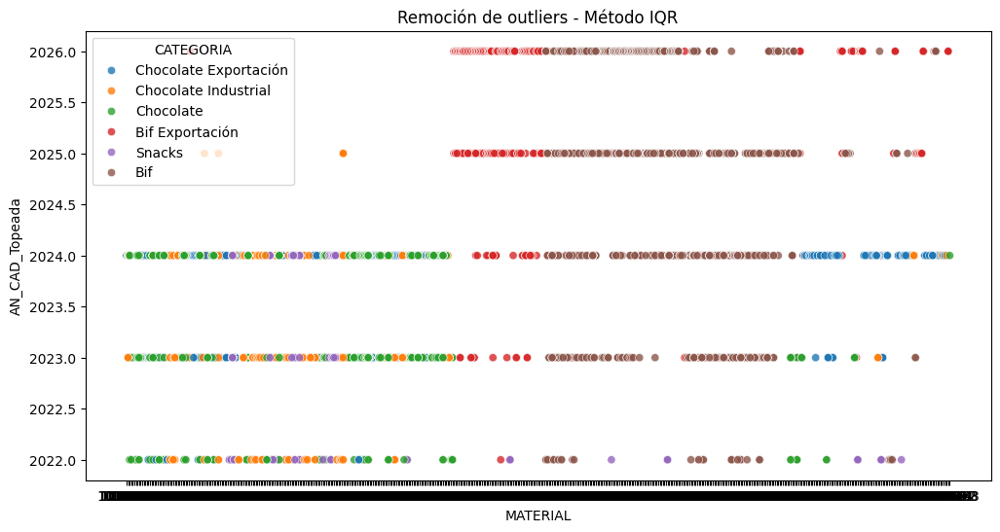

In [522]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'MATERIAL',
                y = 'AN_CAD_Topeada',
                alpha=0.8,
                hue = 'ESTATUS')
plt.title('Remoción de outliers - Método IQR')
plt.show()

# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'MATERIAL',
                y = 'AN_CAD_Topeada',
                alpha=0.8,
                hue = 'CATEGORIA')
plt.title('Remoción de outliers - Método IQR')
plt.show()

Text(0.5, 1.0, 'Relación entre TOTAL_CJ Topeada_Log y AN_CAD_Topeada vs estatus')

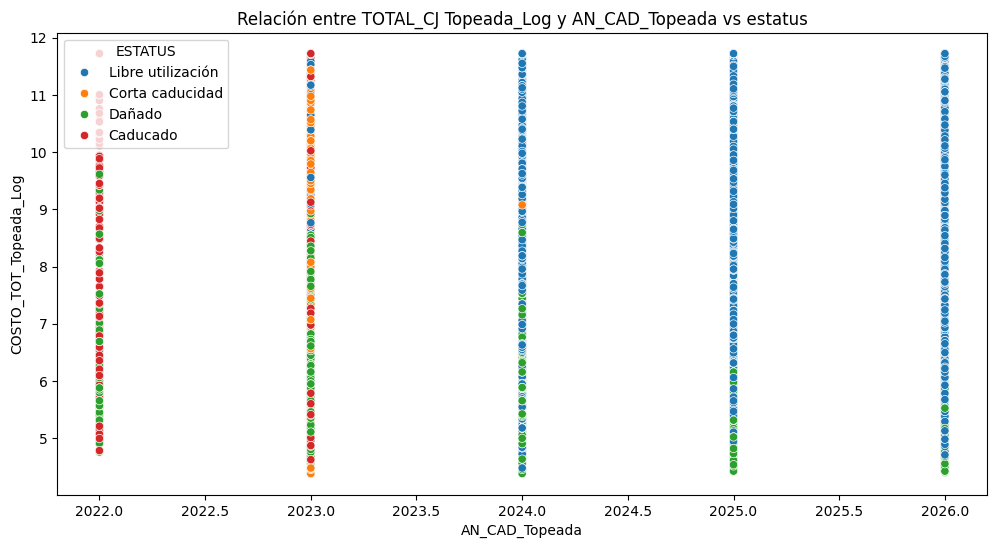

In [523]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'AN_CAD_Topeada',
            y = 'COSTO_TOT_Topeada_Log',
            hue = 'ESTATUS')
plt.title('Relación entre TOTAL_CJ Topeada_Log y AN_CAD_Topeada vs estatus')

In [524]:
coeficiente = df[['AN_CAD_Topeada','TOTAL_CJ_Topeada_Log']].corr(method='pearson')
coeficiente

,AN_CAD_Topeada,TOTAL_CJ_Topeada_Log
AN_CAD_Topeada,1.000000,0.336077
TOTAL_CJ_Topeada_Log,0.336077,1.000000


Se puede apreciar que a medida que el año de caducidad aumenta tambien la cantidad de cajas aumenta. Se comprueba correlación existente, aunque es baja.

## MESES_VU

Variable númerica que depende del tipo de producto y los meses transcurridos desde su producción. Es cuantitativa.

In [525]:
# Calcular algunas estadísticas de MESES_VU
MESES_VU = df['MESES_VU']
MESES_VU.describe().round()

count    34669.0
mean        22.0
std         13.0
min        -59.0
25%         11.0
50%         26.0
75%         35.0
max         37.0
Name: MESES_VU, dtype: float64

(array([-80., -60., -40., -20.,   0.,  20.,  40.,  60.]),
 [Text(-80.0, 0, '−80'),
  Text(-60.0, 0, '−60'),
  Text(-40.0, 0, '−40'),
  Text(-20.0, 0, '−20'),
  Text(0.0, 0, '0'),
  Text(20.0, 0, '20'),
  Text(40.0, 0, '40'),
  Text(60.0, 0, '60')])

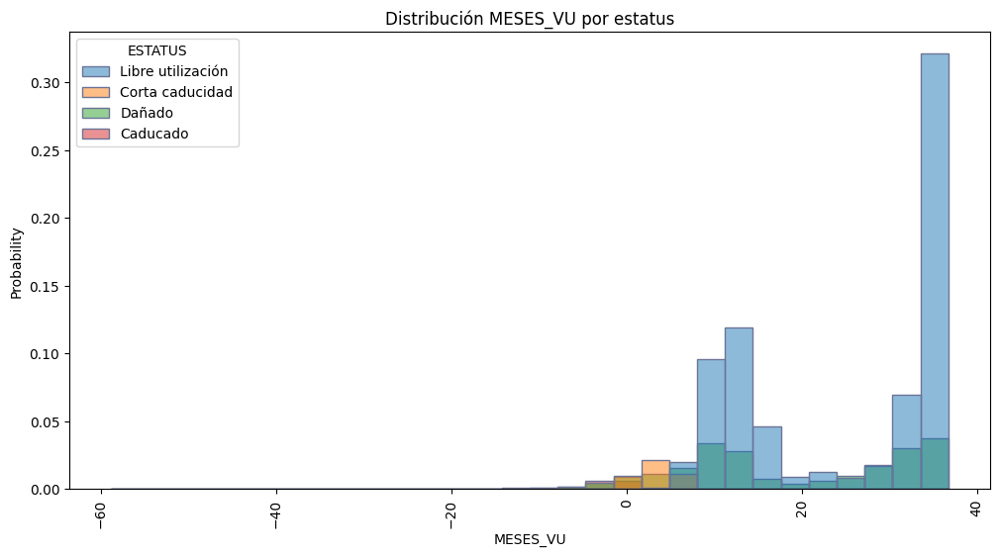

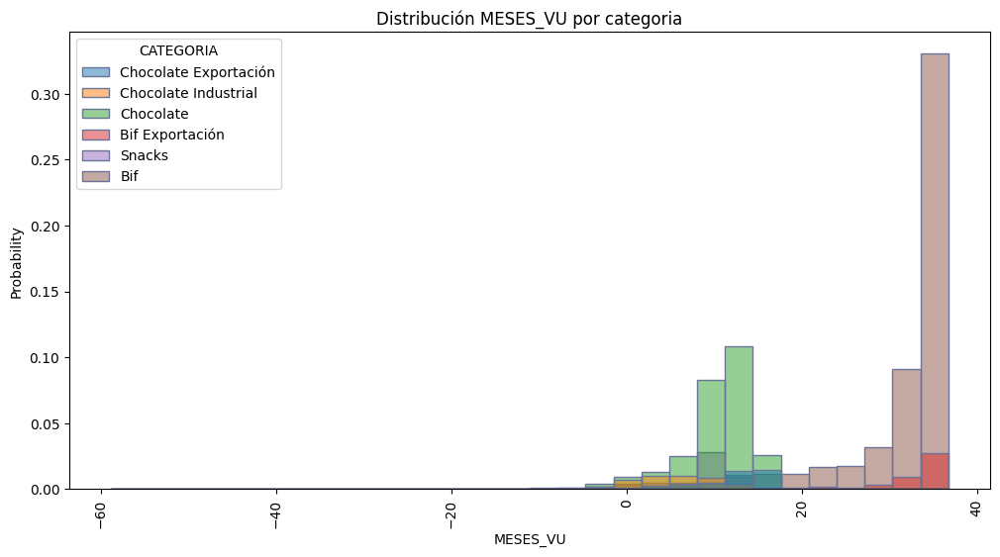

In [526]:
#Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'MESES_VU',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'probability',
             bins = 30,
             hue = 'ESTATUS')
plt.title('Distribución MESES_VU por estatus')
plt.xticks(rotation=90)

#Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'MESES_VU',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'probability',
             bins = 30,
             hue = 'CATEGORIA')
plt.title('Distribución MESES_VU por categoria')
plt.xticks(rotation=90)

Chocolates y snacks, se encuentran dentro del rango de vida útil menor a 18 meses, Bif presenta su mayor participación en el bloque de la mayor cantidad de meses, sobre los 20 meses.

Text(0.5, 1.0, 'Relación entre MESES_VU y TOTAL_CJ_Topeada vs Categoria')

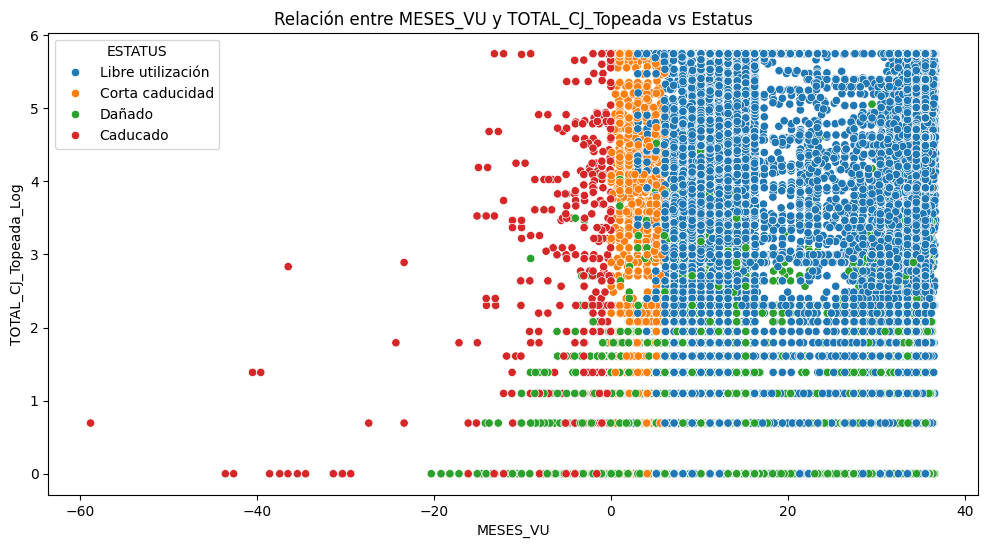

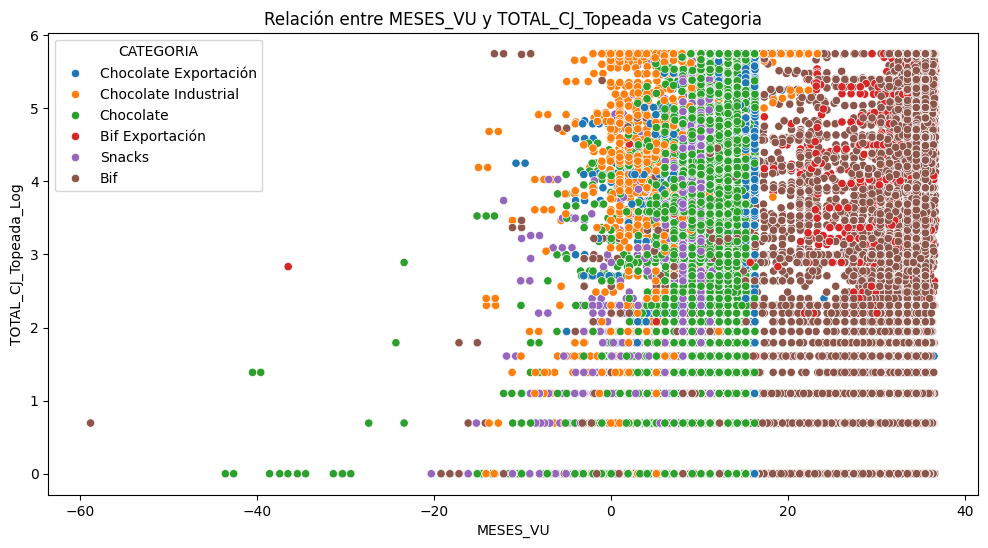

In [527]:
# Visualmente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'MESES_VU',
            y = 'TOTAL_CJ_Topeada_Log',
            hue = 'ESTATUS')
plt.title('Relación entre MESES_VU y TOTAL_CJ_Topeada vs Estatus')

# Visualmente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'MESES_VU',
            y = 'TOTAL_CJ_Topeada_Log',
            hue = 'CATEGORIA')
plt.title('Relación entre MESES_VU y TOTAL_CJ_Topeada vs Categoria')

Se observan algunos outliers en meses menores a 0, procedere a topear la variable.

In [528]:
# Detección de outliers: Método IQR
variable_PRCTJ_VU = df['MESES_VU']
media = variable_PRCTJ_VU.mean()
mediana = variable_PRCTJ_VU.median()
primer_cuartil = variable_PRCTJ_VU.quantile(0.25)
tercer_cuartil = variable_PRCTJ_VU.quantile(0.75)
rango_intercuartilico = tercer_cuartil - primer_cuartil
# Límites:
limite_inf = primer_cuartil - (1 * rango_intercuartilico)
limite_sup = tercer_cuartil + (0.2 * rango_intercuartilico)
print(limite_inf,limite_sup)

-12.469999999999999 39.67


In [529]:
# Identificar outliers
df['Outlier_IQR'] = np.where((df['MESES_VU'] < limite_inf) | (df['MESES_VU'] > limite_sup),1,0)
df['Outlier_IQR'].value_counts()

0    34599
1       70
Name: Outlier_IQR, dtype: int64

Text(0.5, 1.0, 'Detección de Outliers - Método IQR')

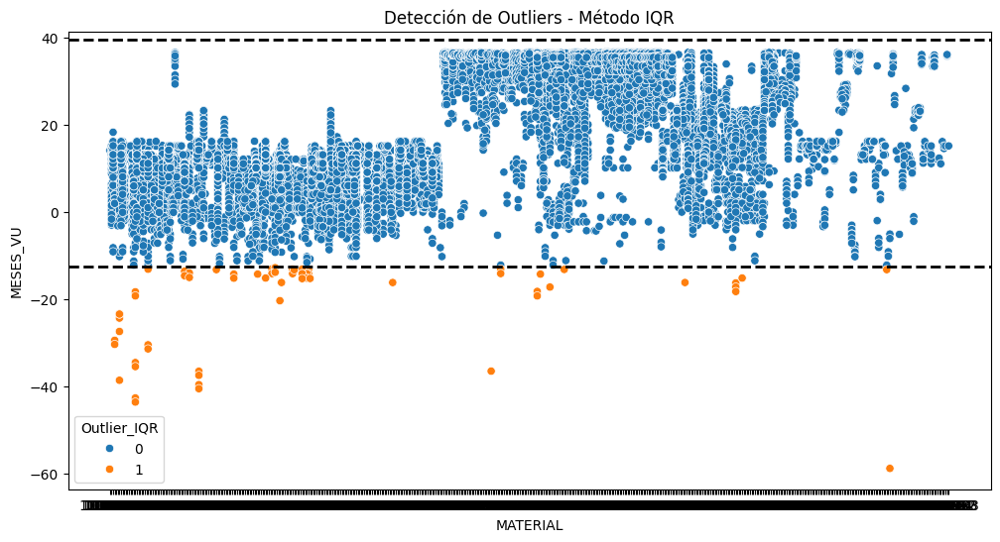

In [530]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'MATERIAL',
                y = 'MESES_VU',
               hue = 'Outlier_IQR')
plt.axhline(y = limite_inf,
            color = 'black',
            linestyle = '--',
            label = 'Limite Inferior',
            linewidth = 2)
plt.axhline(y = limite_sup,
            color = 'black',
            linestyle = '--',
            label = 'Limite Superior',
            linewidth = 2)
plt.title('Detección de Outliers - Método IQR')

In [531]:
# Remoción de outliers, tomando como base el resultado del método IQR
df['MESES_VU_Topeada'] = (df['MESES_VU'].clip(-12.469999999999999, 39.67))

Text(0.5, 1.0, 'Remoción de Outliers - Método IQR')

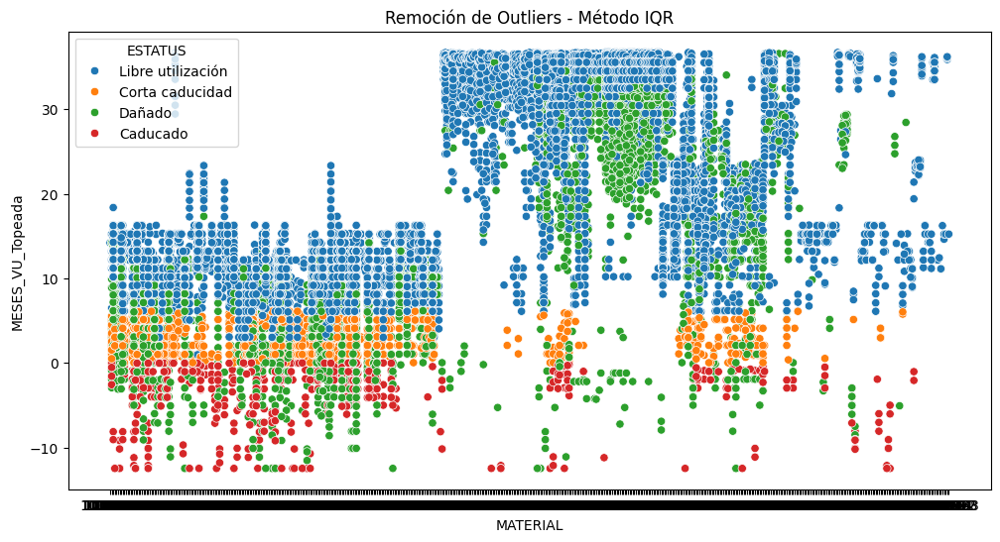

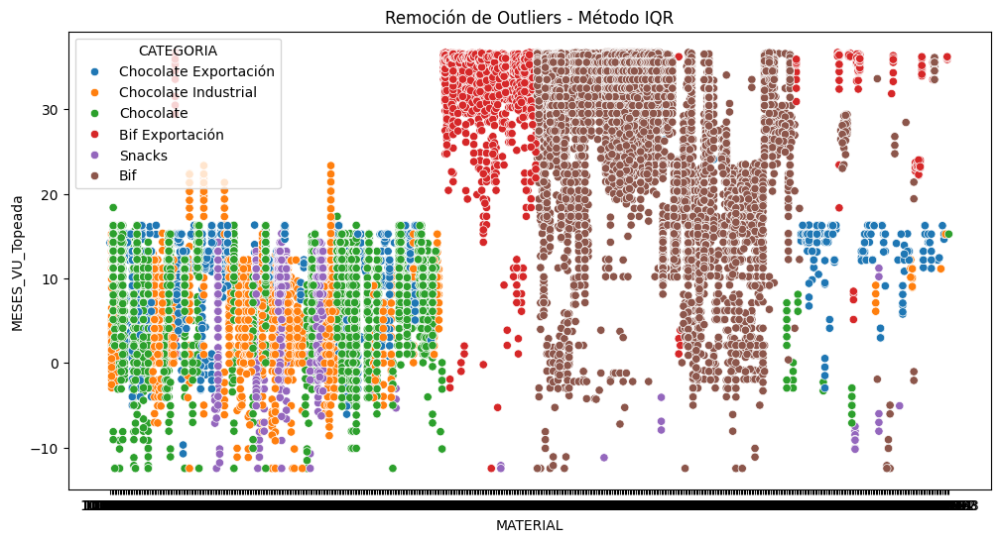

In [532]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'MATERIAL',
                y = 'MESES_VU_Topeada',
               hue = 'ESTATUS')
plt.title('Remoción de Outliers - Método IQR')

# Graficamente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'MATERIAL',
                y = 'MESES_VU_Topeada',
               hue = 'CATEGORIA')
plt.title('Remoción de Outliers - Método IQR')

Text(0.5, 1.0, 'Relación entre MESES_VU_Topeada y TOTAL_CJ_Topeada vs estatus')

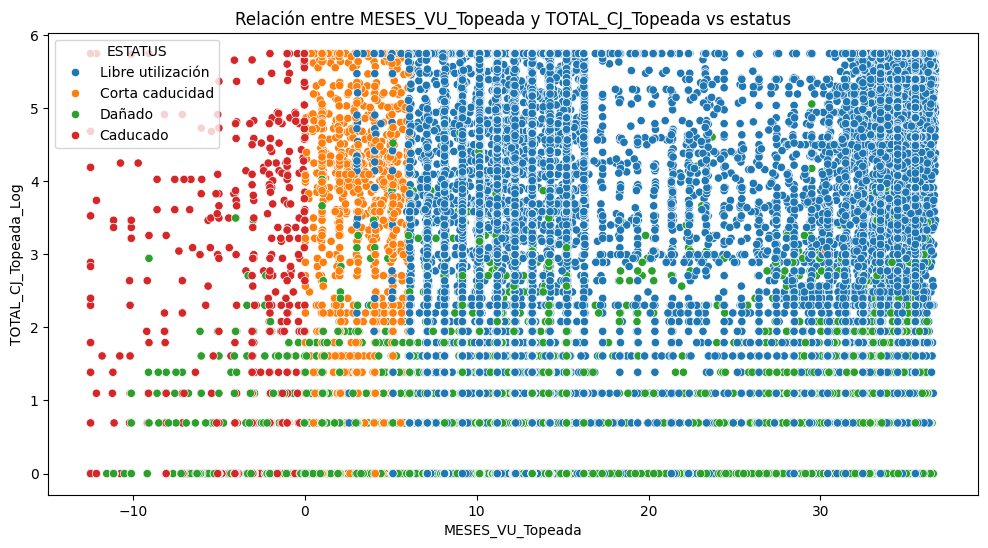

In [533]:
# Visualmente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'MESES_VU_Topeada',
            y = 'TOTAL_CJ_Topeada_Log',
            hue = 'ESTATUS')
plt.title('Relación entre MESES_VU_Topeada y TOTAL_CJ_Topeada vs estatus')

In [534]:
coeficiente = df[['MESES_VU_Topeada','TOTAL_CJ_Topeada_Log']].corr(method='pearson')
coeficiente

,MESES_VU_Topeada,TOTAL_CJ_Topeada_Log
MESES_VU_Topeada,1.000000,0.329779
TOTAL_CJ_Topeada_Log,0.329779,1.000000


Se observa que a mayor meses de vida útil disponible hay un mayor cantidad de cajas. Se comprueba correlación existente, aunque es baja.

## UN_CJ

Variable númerica y depende del tipo de producto. Es cuantitativa.

In [535]:
# Calcular algunas estadísticas de UN_CJ
UN_CJ = df['UN_CJ']
UN_CJ.describe().round()

count    34669.0
mean        19.0
std         43.0
min          1.0
25%          4.0
50%         12.0
75%         16.0
max        405.0
Name: UN_CJ, dtype: float64

(array([-50.,   0.,  50., 100., 150., 200., 250., 300., 350., 400., 450.]),
 [Text(-50.0, 0, '−50'),
  Text(0.0, 0, '0'),
  Text(50.0, 0, '50'),
  Text(100.0, 0, '100'),
  Text(150.0, 0, '150'),
  Text(200.0, 0, '200'),
  Text(250.0, 0, '250'),
  Text(300.0, 0, '300'),
  Text(350.0, 0, '350'),
  Text(400.0, 0, '400'),
  Text(450.0, 0, '450')])

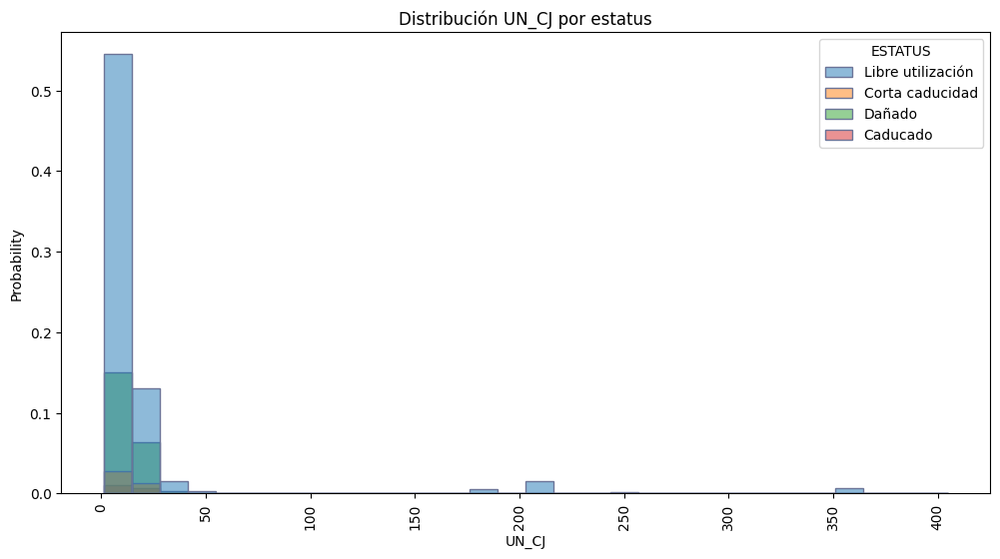

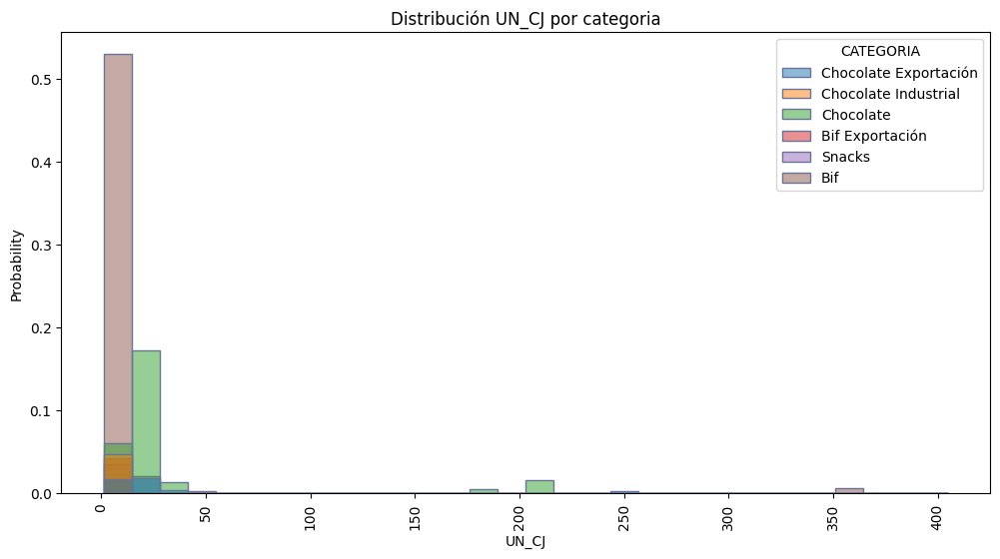

In [536]:
# Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'UN_CJ',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'probability',
             bins = 30,
             hue = 'ESTATUS')
plt.title('Distribución UN_CJ por estatus')
plt.xticks(rotation=90)

# Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'UN_CJ',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'probability',
             bins = 30,
             hue = 'CATEGORIA')
plt.title('Distribución UN_CJ por categoria')
plt.xticks(rotation=90)

In [537]:
coeficiente = df[['UN_CJ','TOTAL_CJ_Topeada_Log']].corr(method='pearson')
coeficiente

,UN_CJ,TOTAL_CJ_Topeada_Log
UN_CJ,1.000000,-0.174788
TOTAL_CJ_Topeada_Log,-0.174788,1.000000


No se aprecia relación clara entre UN_CJ y TOTAL_CJ_Topeada_Log. Esta variable podría ser descartada para el modelamiento.

## COSTO_UN

Variable númerica que depende del tipo de producto. Es cuantitativa.

In [538]:
# Calcular algunas estadísticas de COSTO_UN
COSTO_UN = df['COSTO_UN']
COSTO_UN.describe().round(2)

count    34669.00
mean       677.99
std       2416.11
min         31.87
25%        130.20
50%        151.68
75%        353.52
max      22319.55
Name: COSTO_UN, dtype: float64

In [539]:
# Genero la variable logaritmica
df['COSTO_UN_Log'] = np.log(df['COSTO_UN'])

Text(0.5, 1.0, 'Relación entre los Logaritmos del COSTO_UN y TOTAL_CJ_Topeada vs Categoria')

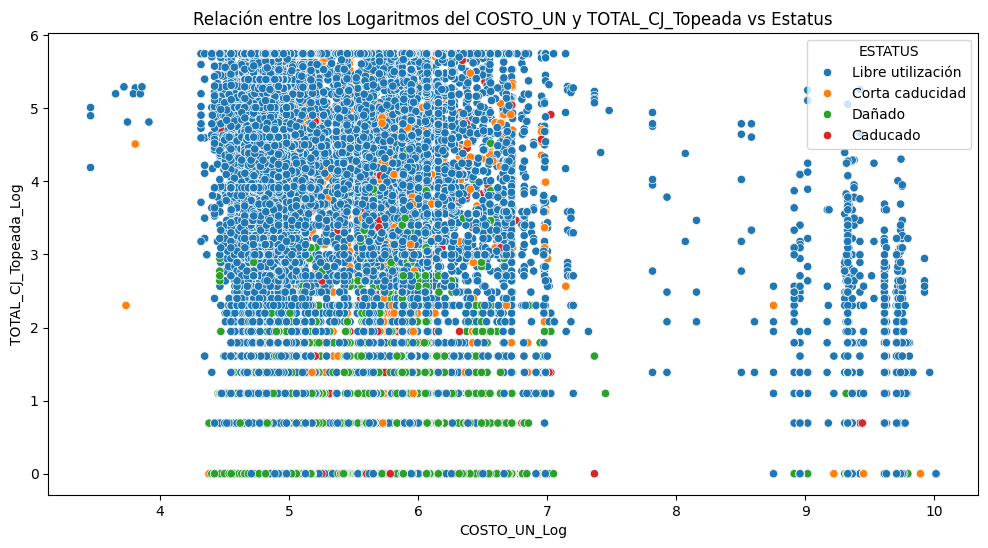

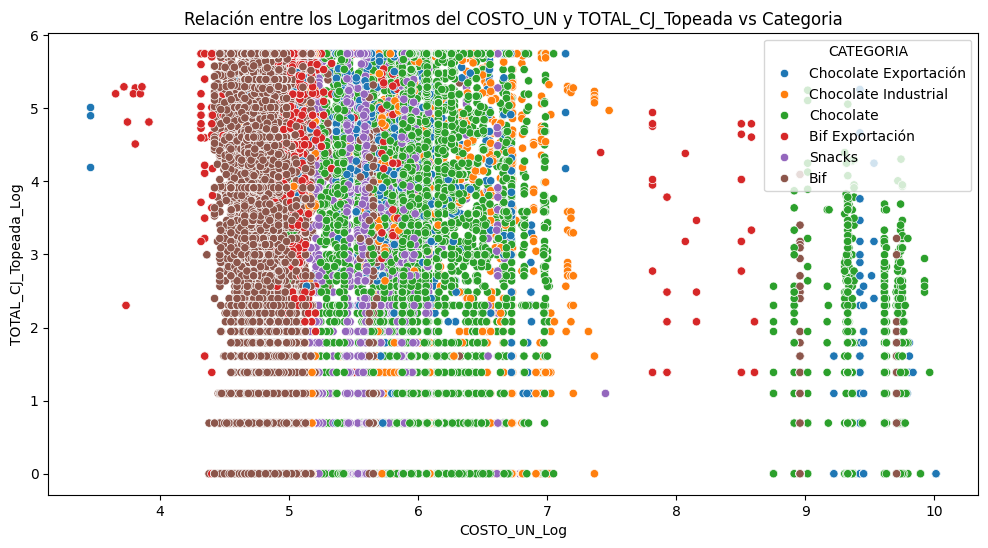

In [540]:
# Visualmente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'COSTO_UN_Log',
            y = 'TOTAL_CJ_Topeada_Log',
          hue = 'ESTATUS')
plt.title('Relación entre los Logaritmos del COSTO_UN y TOTAL_CJ_Topeada vs Estatus')

# Visualmente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'COSTO_UN_Log',
            y = 'TOTAL_CJ_Topeada_Log',
          hue = 'CATEGORIA')
plt.title('Relación entre los Logaritmos del COSTO_UN y TOTAL_CJ_Topeada vs Categoria')

In [541]:
coeficiente = df[['COSTO_UN_Log','TOTAL_CJ_Topeada_Log']].corr(method='pearson')
coeficiente

,COSTO_UN_Log,TOTAL_CJ_Topeada_Log
COSTO_UN_Log,1.000000,-0.193998
TOTAL_CJ_Topeada_Log,-0.193998,1.000000


No se aprecia relación entre COSTO_UN_Log y TOTAL_CJ_Topeada.

##VU_MAX
Variable númerica qe depende del tipo de producto. Es cuantitativa.

In [542]:
# Calcular algunas estadísticas de VU_MAX
VU_MAX = df['VU_MAX']
VU_MAX.describe().round

<bound method Series.round of count    34669.000000
mean        27.371369
std         11.206158
min          9.000000
25%         15.000000
50%         37.000000
75%         37.000000
max         37.000000
Name: VU_MAX, dtype: float64>

(array([ 5., 10., 15., 20., 25., 30., 35., 40.]),
 [Text(5.0, 0, '5'),
  Text(10.0, 0, '10'),
  Text(15.0, 0, '15'),
  Text(20.0, 0, '20'),
  Text(25.0, 0, '25'),
  Text(30.0, 0, '30'),
  Text(35.0, 0, '35'),
  Text(40.0, 0, '40')])

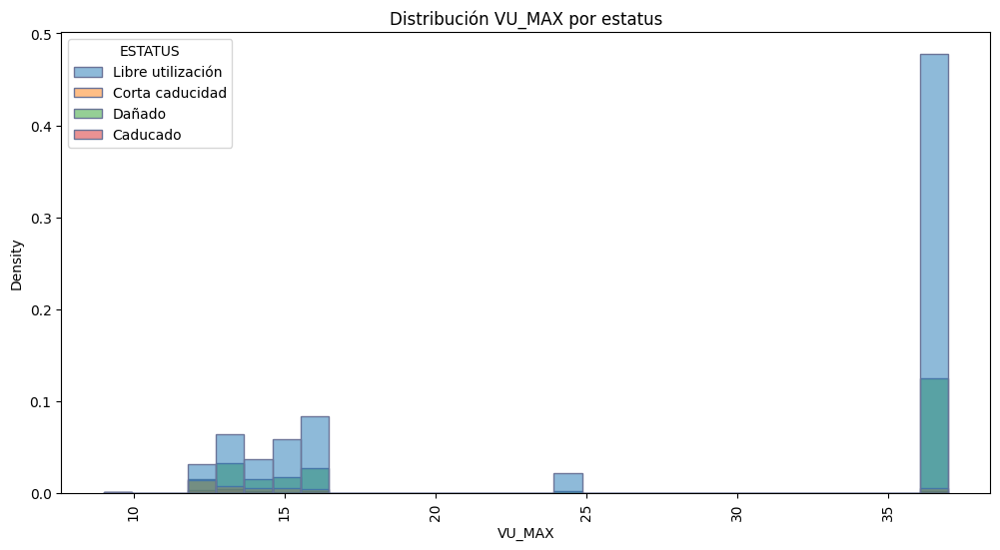

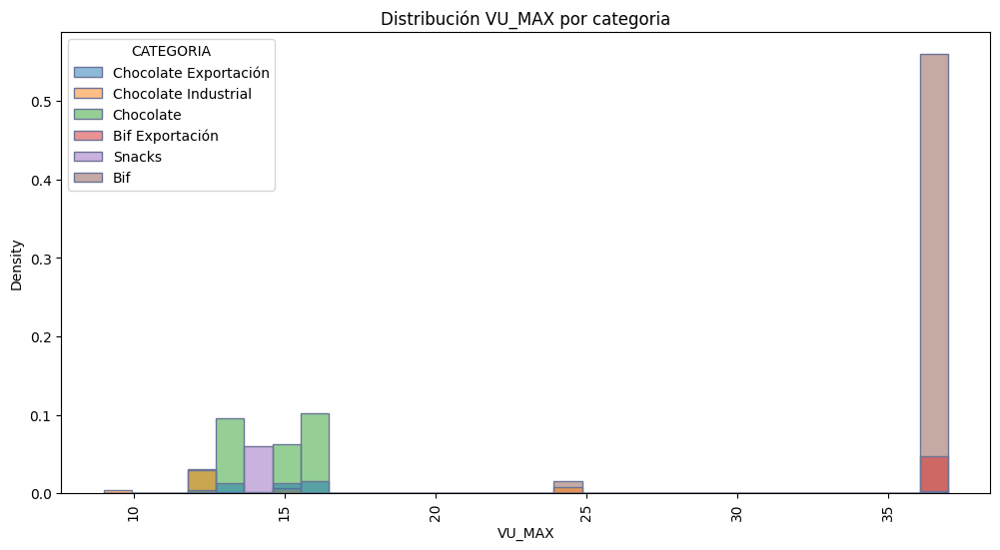

In [543]:
#Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'VU_MAX',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'density',
             bins = 30,
             hue = 'ESTATUS')
plt.title('Distribución VU_MAX por estatus')
plt.xticks(rotation=90)

#Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'VU_MAX',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'density',
             bins = 30,
             hue = 'CATEGORIA')
plt.title('Distribución VU_MAX por categoria')
plt.xticks(rotation=90)

Son claros 3 bloques frente a la VU_MAX, cerca de los 36 meses (conformado por la categoria Bif, 24 meses (que incluye Bif y Chocolate Industrial) y un bloque más amplio a va desde los 12 hasta los 16 meses apróximadamente (considera el resto de cateogrías).

In [544]:
coeficiente = df[['VU_MAX','TOTAL_CJ_Topeada_Log']].corr(method='pearson')
coeficiente

,VU_MAX,TOTAL_CJ_Topeada_Log
VU_MAX,1.000000,0.150629
TOTAL_CJ_Topeada_Log,0.150629,1.000000


Conclusión: No se aprecia relación entre VU_MAX y TOTAL_CJ_Topeada_Log.

## RF_MES
Variable númerica, relacionada con el producto. Es cuantitativa.

In [545]:
# Calcular algunas estadísticas
RF_MES = df['RF_MES']
RF_MES.describe().round

<bound method Series.round of count    34669.000000
mean      1040.218293
std       2062.024769
min          0.000000
25%         25.000000
50%        224.000000
75%       1118.000000
max      20085.000000
Name: RF_MES, dtype: float64>

(array([-2500.,     0.,  2500.,  5000.,  7500., 10000., 12500., 15000.,
        17500., 20000., 22500.]),
 [Text(-2500.0, 0, '−2500'),
  Text(0.0, 0, '0'),
  Text(2500.0, 0, '2500'),
  Text(5000.0, 0, '5000'),
  Text(7500.0, 0, '7500'),
  Text(10000.0, 0, '10000'),
  Text(12500.0, 0, '12500'),
  Text(15000.0, 0, '15000'),
  Text(17500.0, 0, '17500'),
  Text(20000.0, 0, '20000'),
  Text(22500.0, 0, '22500')])

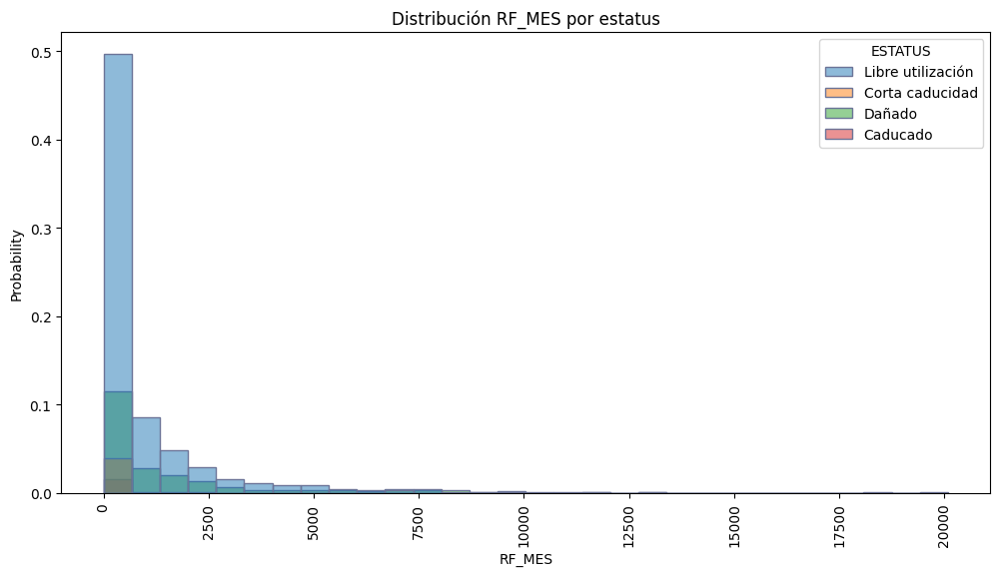

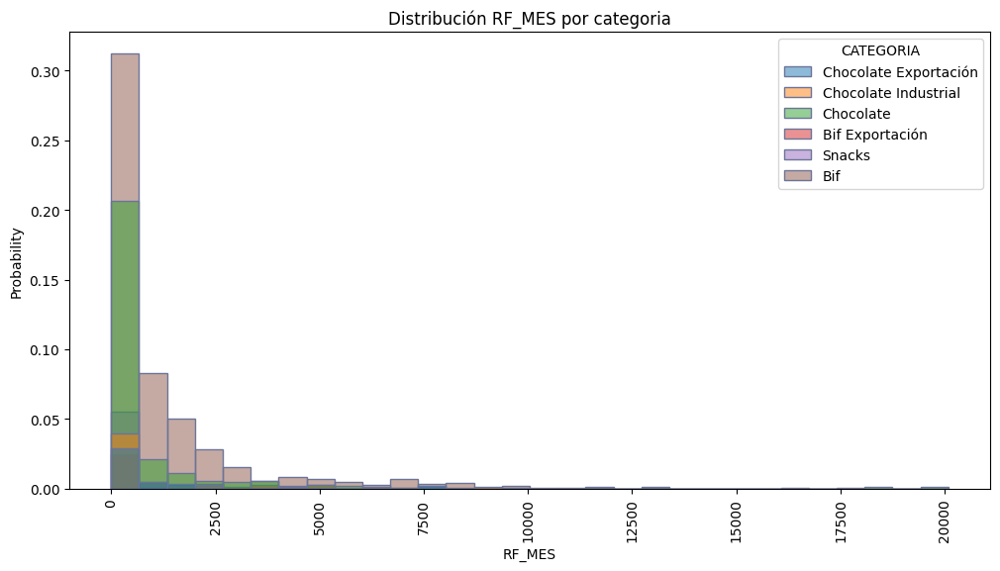

In [546]:
#Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'RF_MES',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'probability',
             bins = 30,
             hue = 'ESTATUS')
plt.title('Distribución RF_MES por estatus')
plt.xticks(rotation=90)

#Graficamente
plt.figure(figsize=(12, 6))
sns.histplot(data = df,
             x = 'RF_MES',
             alpha = 0.5,
             edgecolor = '#6B7498',
             stat = 'probability',
             bins = 30,
             hue = 'CATEGORIA')
plt.title('Distribución RF_MES por categoria')
plt.xticks(rotation=90)

Es evidente que las categoría con mayor participación, Chocolate y Bif tienen las proyecciones más altas, asi mismo estos materiales se encuentran principalmente en libre utilización, esto es esperado para lograr que se desplace rapidamente.

Text(0.5, 1.0, 'Relación entre RF_MES y TOTAL_CJ_Topeada vs Categoria')

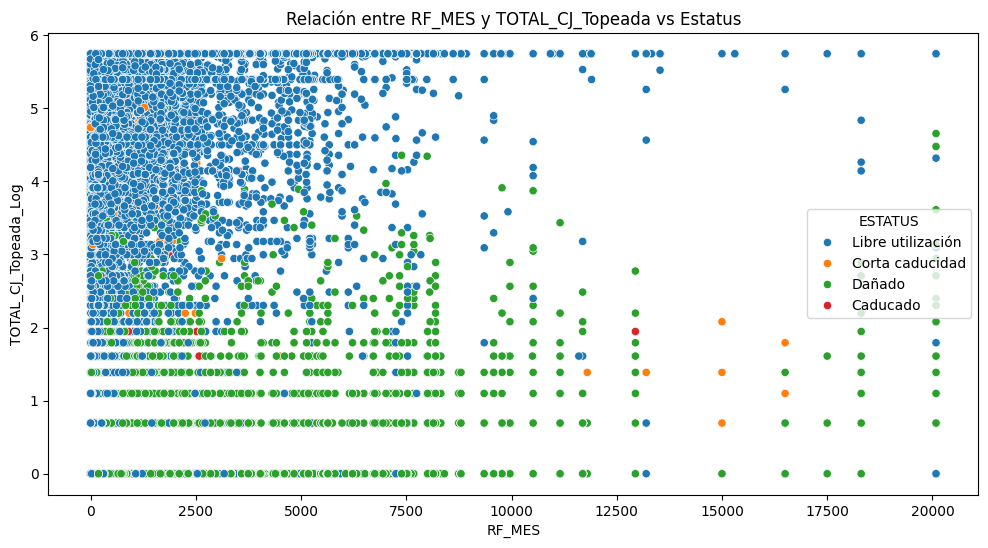

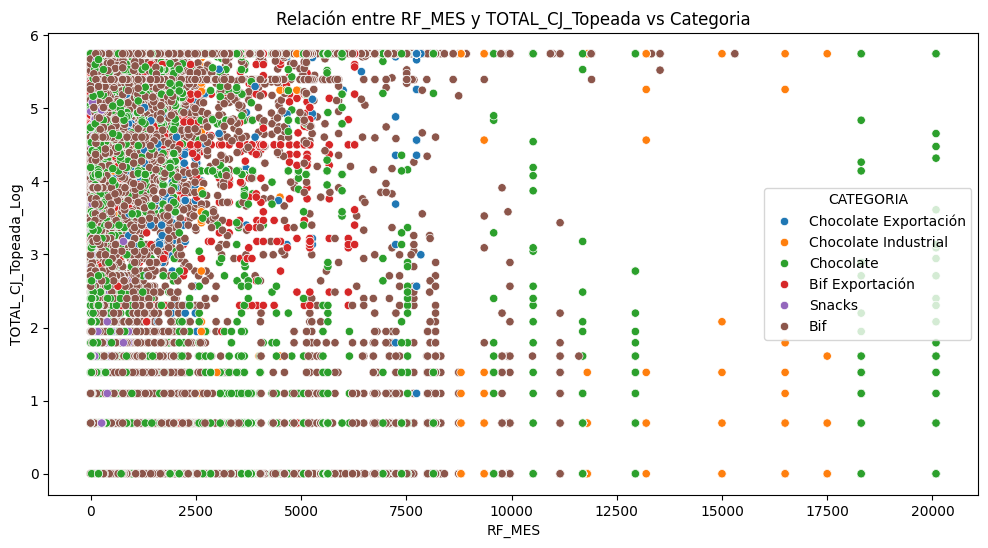

In [547]:
# Visualmente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'RF_MES',
            y = 'TOTAL_CJ_Topeada_Log',
            hue = 'ESTATUS')
plt.title('Relación entre RF_MES y TOTAL_CJ_Topeada vs Estatus')

# Visualmente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'RF_MES',
            y = 'TOTAL_CJ_Topeada_Log',
            hue = 'CATEGORIA')
plt.title('Relación entre RF_MES y TOTAL_CJ_Topeada vs Categoria')

In [548]:
# Genero la variable logaritmica
df['RF_MES_Log'] = np.log(df['RF_MES'])

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


Text(0.5, 1.0, 'Relación entre los Logaritmos del RF_MES y TOTAL_CJ_Topeada vs Categoria')

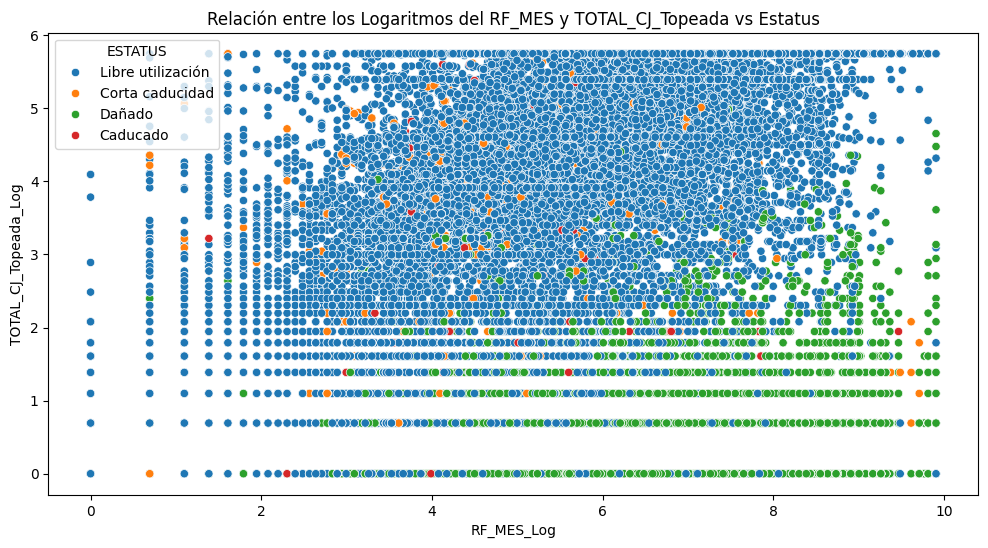

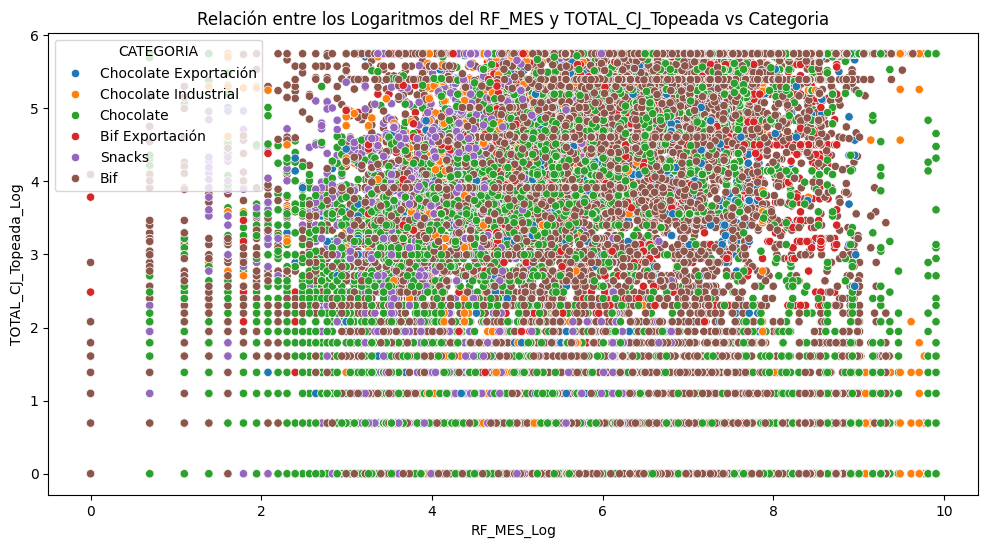

In [549]:
# Visualmente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'RF_MES_Log',
            y = 'TOTAL_CJ_Topeada_Log',
            hue = 'ESTATUS')
plt.title('Relación entre los Logaritmos del RF_MES y TOTAL_CJ_Topeada vs Estatus')

# Visualmente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'RF_MES_Log',
            y = 'TOTAL_CJ_Topeada_Log',
            hue = 'CATEGORIA')
plt.title('Relación entre los Logaritmos del RF_MES y TOTAL_CJ_Topeada vs Categoria')

In [550]:
coeficiente = df[['RF_MES_Log','TOTAL_CJ_Topeada_Log']].corr(method='pearson')
coeficiente

,RF_MES_Log,TOTAL_CJ_Topeada_Log
RF_MES_Log,1.000000,0.151841
TOTAL_CJ_Topeada_Log,0.151841,1.000000


No se aprecia relación entre RF_MES y TOTAL_CJ_Topeada.

## COSTO_TOT & PRCTJ_VU versus Target

Como es la relación de estás variables, que son las más correlacionadas y el Target

Text(0.5, 1.0, 'Relación COSTO_TOT_Topeada_Log y PRCTJ_VU_Topeada VS categoría')

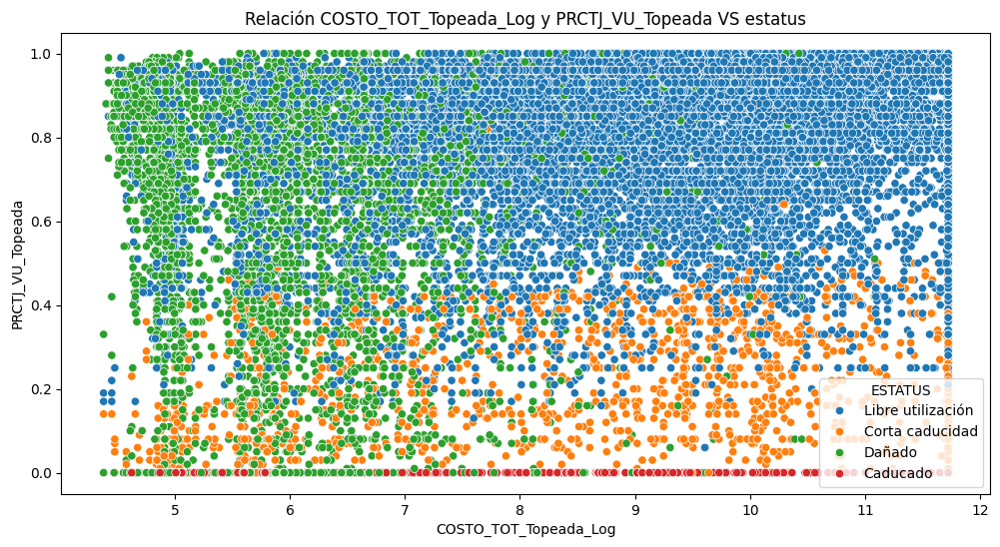

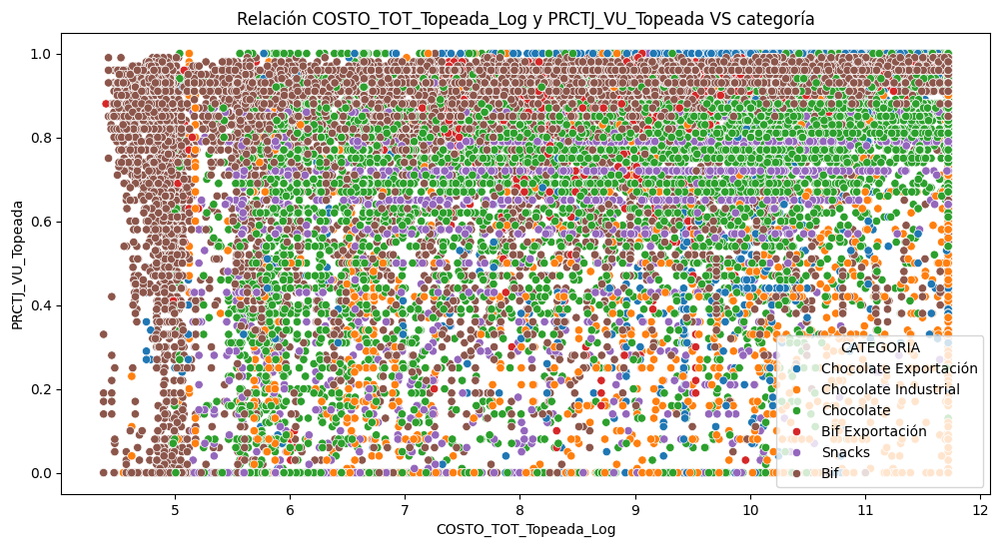

In [551]:
# Relación entre las variables más correlacionadas con el target
# Visualmente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
            x = 'COSTO_TOT_Topeada_Log',
            y = 'PRCTJ_VU_Topeada',
            hue = 'ESTATUS')
plt.title('Relación COSTO_TOT_Topeada_Log y PRCTJ_VU_Topeada VS estatus')

# Visualmente
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
          x = 'COSTO_TOT_Topeada_Log',
          y = 'PRCTJ_VU_Topeada',
        hue = 'CATEGORIA')
plt.title('Relación COSTO_TOT_Topeada_Log y PRCTJ_VU_Topeada VS categoría')

El inventario con mayor valor se encuentra mayoritariamente el libre utilización mientras que el producto con corta caducidad participa con un valor menor a 0.5. La categoría Chocolate industrial tiene un PRTCJ_VU menor al 50% y representa el stock más costoso. Bif y Chocolate tiene la una vida útil cercana al 100%, siendo Chocolate a categoría con mayor participacion en costo alto.

In [552]:
coeficiente = df[['COSTO_TOT_Topeada_Log','PRCTJ_VU_Topeada']].corr(method='pearson')
coeficiente

,COSTO_TOT_Topeada_Log,PRCTJ_VU_Topeada
COSTO_TOT_Topeada_Log,1.000000,0.318519
PRCTJ_VU_Topeada,0.318519,1.000000


Con un coeficiente de 0.318, se muestra cierta correlación entre estas 2 variables.

## Creación de features a partir de palabras comunes en Descripción

Buscaré las palabras que más se utilizan en las descripciones del producto

1184927


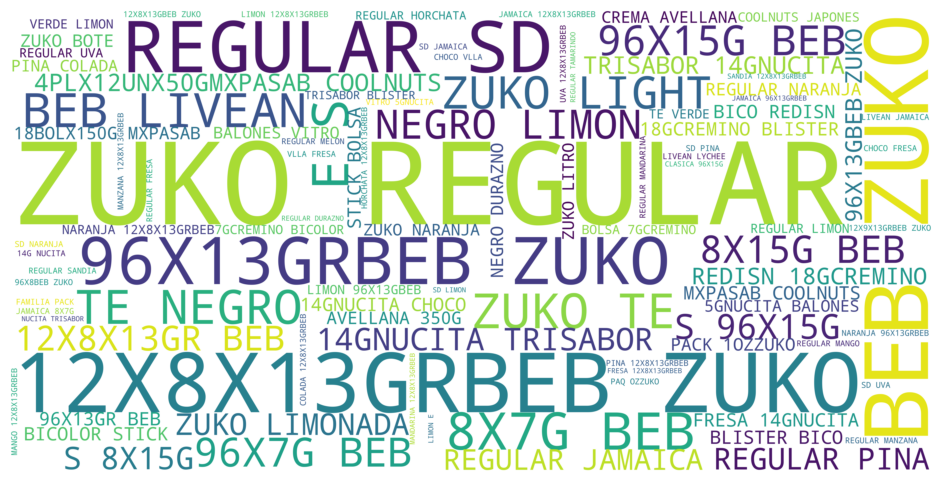

In [553]:
from wordcloud import WordCloud
word_cloud_text = ''.join(df['DESCRIPCION'])
print(len(word_cloud_text))

wordcloud = WordCloud(
    max_font_size=100,
    max_words=100,
    background_color="white",
    scale=10,
    width=800,
    height=400
).generate(word_cloud_text)

plt.figure(figsize=(12,6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

Con esta visualización se encuentra que ZUKO, REGULAR, LIVEAN, TE, NEGRO tienen la mayor participación dentro de las descripciones del producto, estas palabras identifican a los productos de categoría Bif que es la tiene la mayor participación dentro del dataset.

In [554]:
import re

palabras_com =['ZUKO','LIVEAN','REGULAR','LIGHT','TE', 'NUCITA','MUIBON','CREMINO','COOLNUTS','CORDILLERA' ]

# Función para contar palabras del diccionario en una cadena de texto
def contar_palabras_diccionario(texto, diccionario):
    recuento_palabras = {palabra: 0 for palabra in diccionario}
    palabras_texto = re.findall(r'\b\w+\b', texto.upper())
    for palabra in palabras_texto:
        if palabra in diccionario:
            recuento_palabras[palabra] += 1
    return recuento_palabras

# Función para aplicar a la columna 'descripcion' del DataFrame
def contar_palabras_descripcion(descripcion):
    return contar_palabras_diccionario(descripcion, palabras_com)

# Aplicar la función a la columna 'descripcion' y convertir el resultado en un DataFrame
resultado = df['DESCRIPCION'].apply(contar_palabras_descripcion).apply(pd.Series)

# Sumar las ocurrencias de cada palabra en todo el DataFrame
ocurrencias_totales = resultado.sum()

# Ordenar el resultado de mayor a menor
ocurrencias_totales = ocurrencias_totales.sort_values(ascending=False)

# Imprimir el resultado
print("Ocurrencias totales de palabras del diccionario:")
print(ocurrencias_totales)

Ocurrencias totales de palabras del diccionario:
ZUKO          18492
REGULAR       10240
NUCITA         5437
CREMINO        2504
TE             2270
COOLNUTS       1830
LIVEAN         1641
LIGHT          1448
CORDILLERA      468
MUIBON          362
dtype: int64


In [555]:
#Encoding
df['Es_Zuko'] = df['DESCRIPCION'] == 'ZUKO'
df['Es_ZRegular'] = df['DESCRIPCION'] == 'REGULAR'
df['Es_ZTe'] = df['DESCRIPCION'] == 'TE'
df['Es_ZLIGHT'] = df['DESCRIPCION'] == 'LIGHT'
df['Es_Livean'] = df['DESCRIPCION'] == 'LIVEAN'
df['Es_Nucita'] = df['DESCRIPCION'] == 'NUCITA'
df['Es_Cremino'] = df['DESCRIPCION'] == 'CREMINO'
df['Es_Coolnuts'] = df['DESCRIPCION'] == 'COOLNUTS'
df['Es_Cordillera'] = df['DESCRIPCION'] == 'CORDILLERA'
df['Es_Muibon'] = df['DESCRIPCION'] == 'MUIBON'
valores_verificar = ['ZUKO','REGULAR','TE','LIVEAN', 'LIGHT', 'NUCITA','CREMINO','COOLNUTS','CORDILLERA','MUIBON']
df['Es_Otros'] = df['DESCRIPCION'].isin(valores_verificar)

In [556]:
# Importancia de la nuevas variables

features = ['Es_Zuko', 'Es_ZRegular', 'Es_ZTe', 'Es_ZLIGHT', 'Es_Livean',
            'Es_Nucita','Es_Cremino','Es_Coolnuts','Es_Cordillera','Es_Muibon','Es_Otros']

X = df[features].values
y = df['TOTAL_CJ_Topeada'].values


# Crear el modelo de Random Forest
model = RandomForestClassifier(n_estimators = 150,
                               random_state = 123,
                               max_depth = 5,
                               min_samples_leaf = 100,
                               max_features = 15,
                               criterion = 'entropy')

# Entrenar el modelo
model.fit(X, y)

# Obtener la importancia de las características
feature_importance = model.feature_importances_

# Crear un DataFrame para visualizar la importancia de las características
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importance})
importance_df = importance_df.sort_values('Importance', ascending=False)
importance_df.sort_values(by = 'Importance', ascending = False)


,Feature,Importance
0,Es_Zuko,0.0
1,Es_ZRegular,0.0
2,Es_ZTe,0.0
3,Es_ZLIGHT,0.0
4,Es_Livean,0.0
5,Es_Nucita,0.0
6,Es_Cremino,0.0
7,Es_Coolnuts,0.0
8,Es_Cordillera,0.0
9,Es_Muibon,0.0


¿Cómo transformo categorías a números?

One-Hot-Encoding
Crear una columna binaria para cada categoría en la variable original.

In [557]:
features_categoricas = df.select_dtypes(include=['object'])
features_categoricas.columns

Index(['CEDI_MAT', 'CEDI_MAT_LOT', 'CEDI_MAT_LOT_EST', 'PLANTA', 'CEDI',
       'ALMACEN', 'MATERIAL', 'DESCRIPCION', 'LOTE', 'ESTATUS', 'MES_CAD',
       'CATEGORIA', 'CATEGORIA_FIN', 'RESPONSABLE', 'ACCION'],
      dtype='object')

In [558]:
# Cuántos valores distintos tiene cada categoría?
valores_distintos = features_categoricas.nunique()
print(valores_distintos.sort_values(ascending=False))

CEDI_MAT_LOT_EST    18365
CEDI_MAT_LOT        16232
CEDI_MAT             2026
LOTE                 1811
DESCRIPCION           914
MATERIAL              529
MES_CAD                12
ACCION                 12
CEDI                   10
RESPONSABLE            10
ALMACEN                 9
CATEGORIA               6
CATEGORIA_FIN           6
ESTATUS                 4
PLANTA                  2
dtype: int64


In [559]:
# Las selecciono
col_aTransformar = valores_distintos.index[valores_distintos<=9]
col_aTransformar

Index(['PLANTA', 'ALMACEN', 'ESTATUS', 'CATEGORIA', 'CATEGORIA_FIN'], dtype='object')

In [560]:
# Para transformarlas, vamos a usar el método get_dummies de pandas:
df_dummies = pd.get_dummies(df[col_aTransformar], drop_first=True) * 1
df_dummies.head()

,PLANTA_AKMT,ALMACEN_CHI,ALMACEN_CUL,ALMACEN_HMO,ALMACEN_LAG,ALMACEN_MER,ALMACEN_MTY,ALMACEN_TIJ,ALMACEN_VIL,ESTATUS_Corta caducidad,...,CATEGORIA_Bif Exportación,CATEGORIA_Chocolate,CATEGORIA_Chocolate Exportación,CATEGORIA_Chocolate Industrial,CATEGORIA_Snacks,CATEGORIA_FIN_Corta Cad,CATEGORIA_FIN_Descont,CATEGORIA_FIN_Merma,CATEGORIA_FIN_Recuperable,CATEGORIA_FIN_Sin RF
0,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,1,...,0,0,0,1,0,1,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
4,0,0,0,0,1,0,0,0,0,1,...,0,0,0,1,0,1,0,0,0,0


In [561]:
print(df.shape,df_dummies.shape)

(34669, 51) (34669, 22)


In [562]:
# Junto los resultados
df = pd.concat([df, df_dummies], axis=1)
df.head()

,FECHA,CEDI_MAT,CEDI_MAT_LOT,CEDI_MAT_LOT_EST,PLANTA,CEDI,ALMACEN,MATERIAL,DESCRIPCION,CADUCIDAD,...,CATEGORIA_Bif Exportación,CATEGORIA_Chocolate,CATEGORIA_Chocolate Exportación,CATEGORIA_Chocolate Industrial,CATEGORIA_Snacks,CATEGORIA_FIN_Corta Cad,CATEGORIA_FIN_Descont,CATEGORIA_FIN_Merma,CATEGORIA_FIN_Recuperable,CATEGORIA_FIN_Sin RF
0,2023-01-31,NU901008121,NU90100812147003987,NU90100812147003987Libre utilización,ABNU,NU90,LAG,1008121,MUIBON AVELL 24/15/22G.DISPLAY EXP.,2024-04-01,...,0,0,1,0,0,0,0,0,0,0
1,2023-01-31,NU901011425,NU9010114251322,NU9010114251322Corta caducidad,ABNU,NU90,LAG,1011425,BRR. MILCH AVELL 1/250/22G 4605,2023-06-30,...,0,0,0,1,0,1,0,0,0,0
2,2023-01-31,NU901011425,NU9010114251322,NU9010114251322Dañado,ABNU,NU90,LAG,1011425,BRR. MILCH AVELL 1/250/22G 4605,2023-06-30,...,0,0,0,1,0,0,0,1,0,0
3,2023-01-31,NU901011425,NU9010114250344,NU9010114250344Dañado,ABNU,NU90,LAG,1011425,BRR. MILCH AVELL 1/250/22G 4605,2023-07-07,...,0,0,0,1,0,0,0,1,0,0
4,2023-01-31,NU901011425,NU9010114251422,NU9010114251422Corta caducidad,ABNU,NU90,LAG,1011425,BRR. MILCH AVELL 1/250/22G 4605,2023-07-07,...,0,0,0,1,0,1,0,0,0,0


FECHA INVENTARIO

Construiré la variable "Bimestre", según el mes donde se realizó el inventario

In [563]:
df['FECHA']

0       2023-01-31
1       2023-01-31
2       2023-01-31
3       2023-01-31
4       2023-01-31
           ...    
34667   2023-08-31
34668   2023-08-31
34669   2023-08-31
34670   2023-08-31
34671   2023-08-31
Name: FECHA, Length: 34669, dtype: datetime64[ns]

In [564]:
# Convertir las fechas a formato de fecha
df['FECHA'] = pd.to_datetime(df['FECHA'])
df['Mes_inventario'] = df['FECHA'].dt.month


In [565]:
#### COMPOSICION DE LA FECHA
# BIMESTRE
# Definir los bordes del bimestre como fechas
bin_edges = pd.to_datetime([0, 2, 4, 6, 999])

# Definir las etiquetas de los bimestres
bin_labels = ['Bimestre 1', 'Bimestre 2', 'Bimestre 3','Bimestre 4']

# Crear la columna de bimestres usando pd.cut()
df['BIMESTRE'] = pd.cut(df['Mes_inventario'], bins=bin_edges, labels=bin_labels, include_lowest=True)

# Crear la tabla cruzada
pd_crosstab = pd.crosstab(df["BIMESTRE"], df["ESTATUS"], values=df['TOTAL_CJ'], aggfunc='mean')

print(pd_crosstab)

ESTATUS      Caducado  Corta caducidad    Dañado  Libre utilización
BIMESTRE                                                           
Bimestre 1  19.798030        63.830816  3.483783         202.763035
Bimestre 2  37.615819        64.716518  2.715842         218.630424
Bimestre 3  57.188571        81.549587  2.954133         269.422741
Bimestre 4  88.000000        72.254717  3.516410         259.508984


<Axes: xlabel='ESTATUS', ylabel='BIMESTRE'>

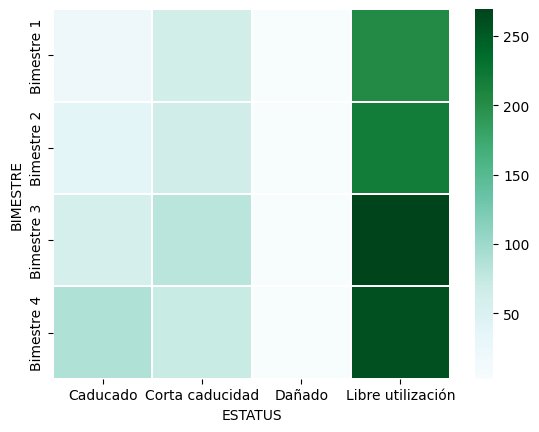

In [566]:
# Graficamente
sns.heatmap(pd_crosstab,
           linewidths=0.3,
           cmap="BuGn")

Se observa que en el Bimestre 3 sube la participación de todos los estatus, excepto el caducado, que se potencia hacía el último bimestre.

In [567]:
#Encoding
df['Es_Bimestre1'] = df['Mes_inventario'] == 'Bimestre 1'
df['Es_Bimestre2'] = df['Mes_inventario'] == 'Bimestre 2'
df['Es_Bimestre3'] = df['Mes_inventario'] == 'Bimestre 3'
df['Es_Bimestre4'] = df['Mes_inventario'] == 'Bimestre 4'

VIDA ÚTIL RESTANTE

Construiré algunas variables en relación al porcentaje de vida útil que le resta al producto.

In [568]:
# Construyo variable acotada
# Defino cortes
bin_edges = [0,0.4,0.75,1]
bin_labels = ['BajaVU','MediaVU','BuenaVU']
df['PRCTJ_VU_Top_BIN'] = pd.cut(df['PRCTJ_VU_Topeada'],
                        bins=bin_edges,
                        labels=bin_labels,
                        include_lowest=True)

Text(0, 0.5, 'Distribución por PRCTJ_VU_Top_BIN')

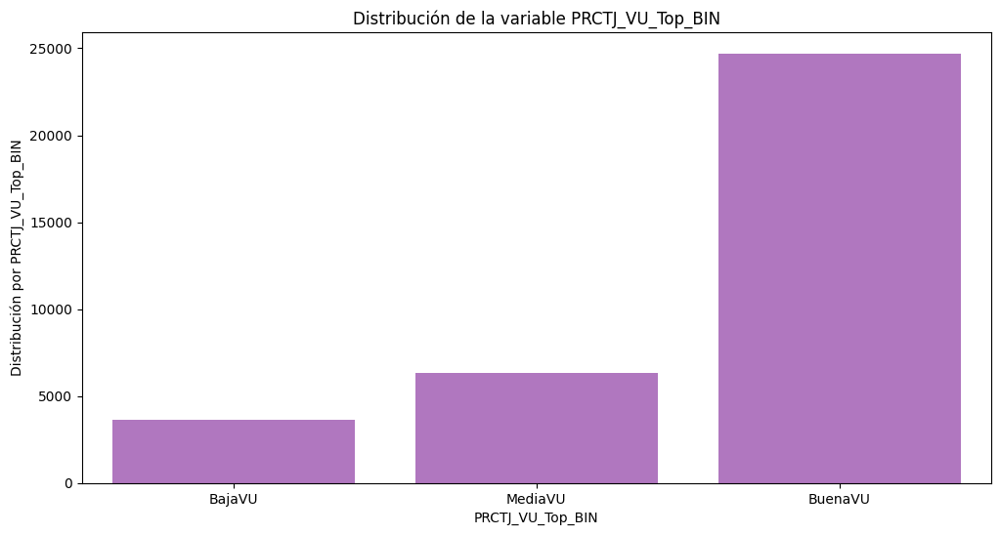

In [569]:
# Cantidad de casos por variable acotada
plt.figure(figsize=(12, 6))
sns.countplot(data = df,
              x = 'PRCTJ_VU_Top_BIN',
             color = '#B76BCB')
plt.title('Distribución de la variable PRCTJ_VU_Top_BIN')
plt.ylabel('Distribución por PRCTJ_VU_Top_BIN')

Se observa que la mayoría de los productos tienen una vida útil mayor al 75%.

Text(0.5, 1.0, 'Relación entre los logaritmos de Total CJ Topeada y Costo Total y % VU_BIN')

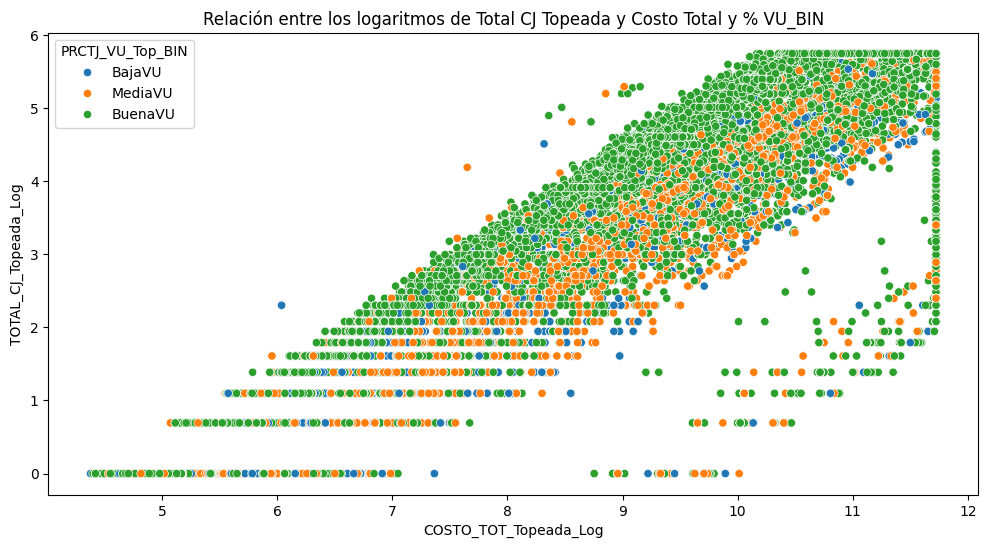

In [570]:
# Genero gráfico para comparar tres variables
plt.figure(figsize=(12, 6))
sns.scatterplot(data = df,
                x = 'COSTO_TOT_Topeada_Log',
                y = 'TOTAL_CJ_Topeada_Log',
                hue = 'PRCTJ_VU_Top_BIN')
plt.title('Relación entre los logaritmos de Total CJ Topeada y Costo Total y % VU_BIN')

Se confirma que la mayor parte del inventario, tiene buena vida util, asi mismo se observa su alta correlación con el costo.

¿Cómo se relaciona la vida útil restante y el estatus?

In [571]:
# Crear la tabla cruzada
pd_crosstab2 = pd.crosstab(df["PRCTJ_VU_Top_BIN"], df["ESTATUS"], values=df['TOTAL_CJ_Topeada_Log'], aggfunc='mean')

print(pd_crosstab2)

ESTATUS           Caducado  Corta caducidad    Dañado  Libre utilización
PRCTJ_VU_Top_BIN                                                        
BajaVU            1.817742         2.360413  0.422524           2.707268
MediaVU                NaN         3.242390  0.541225           2.852456
BuenaVU                NaN         3.044522  0.616858           4.225476


<Axes: xlabel='ESTATUS', ylabel='PRCTJ_VU_Top_BIN'>

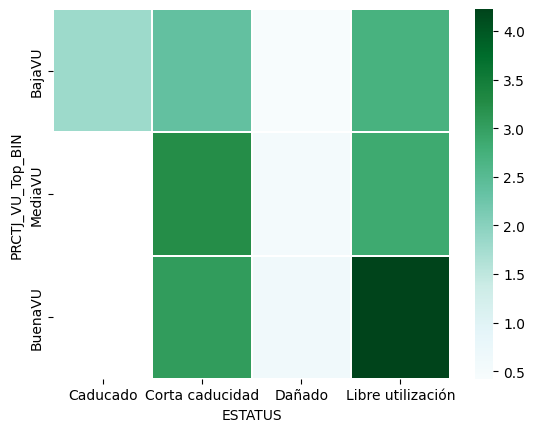

In [572]:
# Graficamente
sns.heatmap(pd_crosstab2,
           linewidths=0.3,
           cmap="BuGn")

Con esta visualización se aprecia que el producto con buena vida util tiene su mayor participación en producto con en Libre utilziación, lo cual es consistente ya que el producto incrementa su participación en categorías de riesgo conforme aumente su estadía en el inventario.

¿Como se relaciona la vida útil restante y la categoria?

In [573]:
# Crear la tabla cruzada
pd_crosstab3 = pd.crosstab(df["PRCTJ_VU_Top_BIN"], df["CATEGORIA"], values=df['TOTAL_CJ_Topeada_Log'], aggfunc='mean')

print(pd_crosstab3)

CATEGORIA              Bif  Bif Exportación   Chocolate  \
PRCTJ_VU_Top_BIN                                          
BajaVU            1.310886          2.542571   0.924778   
MediaVU           1.488687          3.054228   2.031451   
BuenaVU           3.650476          4.622361   3.154295   

CATEGORIA         Chocolate Exportación  Chocolate Industrial    Snacks  
PRCTJ_VU_Top_BIN                                                         
BajaVU                         2.497383              2.680822  1.646818  
MediaVU                        3.061104              3.150419  2.676967  
BuenaVU                        4.290799              3.942882  3.756032  


<Axes: xlabel='CATEGORIA', ylabel='PRCTJ_VU_Top_BIN'>

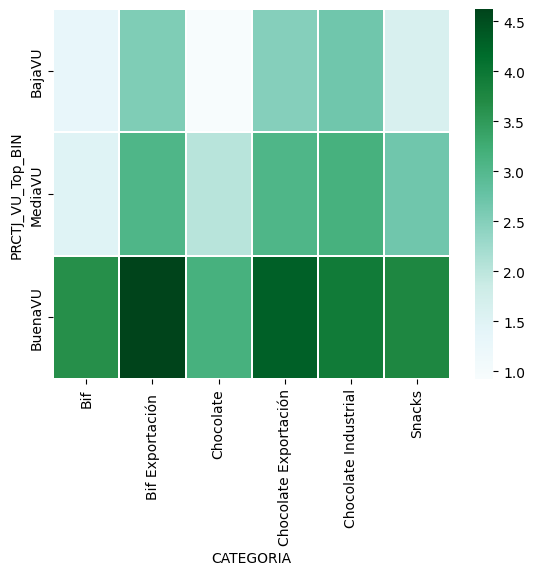

In [574]:
# Graficamente
sns.heatmap(pd_crosstab3,
           linewidths=0.3,
           cmap="BuGn")

Se observa que la mayor parte de bif y chocolate se encuentra en buena vida util, no asi con Bif Exportación, Chocolate Exportación y Chocolate Industrial, donde en los rangos media VU y baja VU hay una participación importante, lo que nos dice que se tiene algúna situación particular para desplazar a mayor velocidad ese inventario. Finalmente, todas las categorias tienen su participación mas fuerte en buena VU respecto de las otras categorias.

¿Cómo se relaciona la vida útil restante y el almacén?

In [575]:
# Crear la tabla cruzada
pd_crosstab4 = pd.crosstab(df["PRCTJ_VU_Top_BIN"], df["ALMACEN"], values=df['TOTAL_CJ_Topeada_Log'], aggfunc='mean')

print(pd_crosstab4)

ALMACEN                ACA       CHI       CUL       HMO       LAG       MER  \
PRCTJ_VU_Top_BIN                                                               
BajaVU            1.338619  1.490816  2.152907  2.316664  1.743057  2.573616   
MediaVU           2.508867  1.964430  2.760103  2.199860  1.770719  2.783792   
BuenaVU           4.699255  3.810037  3.796492  3.432946  2.734046  3.910153   

ALMACEN                MTY       TIJ       VIL  
PRCTJ_VU_Top_BIN                                
BajaVU            0.801344  1.255886  1.712375  
MediaVU           2.044256  2.107438  2.282574  
BuenaVU           4.082830  3.649584  2.994352  


<Axes: xlabel='ALMACEN', ylabel='PRCTJ_VU_Top_BIN'>

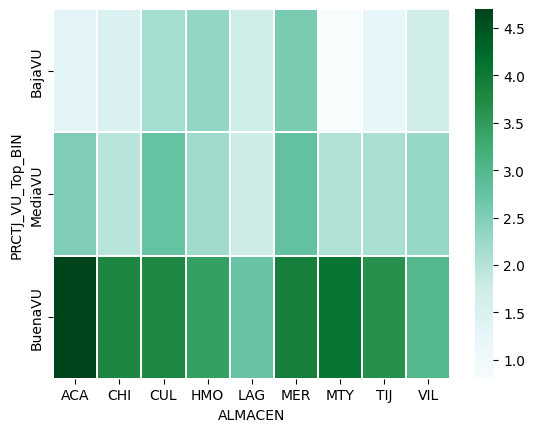

In [576]:
# Graficamente
sns.heatmap(pd_crosstab4,
           linewidths=0.3,
           cmap="BuGn")

En todos los casos la mayor paticipación del inventario se encuentra en la clasificación de Buena VU, sin embargo MER y CUL tiene un participación fuerte en baja y media VU, lo que habla de una baja rotación de producto. MTY, presenta una muy baja presencia de producto en Baja VU, lo que indica que el producto se desplaza rapidamente en ese almacen.

In [577]:
# Encoding
df['Es_BuenaVU'] = df['PRCTJ_VU_Top_BIN'] == 'BuenaVU'
df['Es_MediaVU'] = df['PRCTJ_VU_Top_BIN'] == 'MediaVU'
df['Es_BajaVU'] = df['PRCTJ_VU_Top_BIN'] == 'BajaVU'

In [578]:
# Importancia de la nuevas variables

features = ['Es_BuenaVU', 'Es_MediaVU', 'Es_BajaVU',
            'Es_Bimestre1','Es_Bimestre2','Es_Bimestre3','Es_Bimestre4']

X = df[features].values
y = df['TOTAL_CJ_Topeada'].values


# Crear el modelo de Random Forest
model = RandomForestClassifier(n_estimators = 150,
                               random_state = 123,
                               max_depth = 5,
                               min_samples_leaf = 100,
                               max_features = 15,
                               criterion = 'entropy')

# Entrenar el modelo
model.fit(X, y)

# Obtener la importancia de las características
feature_importance = model.feature_importances_

# Crear un DataFrame para visualizar la importancia de las características
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importance})
importance_df = importance_df.sort_values('Importance', ascending=False)
importance_df.sort_values(by = 'Importance', ascending = False)


,Feature,Importance
0,Es_BuenaVU,0.878084
1,Es_MediaVU,0.061400
2,Es_BajaVU,0.060516
3,Es_Bimestre1,0.000000
4,Es_Bimestre2,0.000000
5,Es_Bimestre3,0.000000
6,Es_Bimestre4,0.000000


Se observa que la vida útil restante es una varible importante para el modelo

# Wrapper Feature Selection Forward selection



Con este método quiero evaluar cuales son las mejores features cuantativas para predecir.

In [579]:
# Definir función para hacer la selección de variables
def forward_selection(data, target, significance_level):
    initial_features = data.columns.tolist()
    best_features = []
    while (len(initial_features)>0):
        remaining_features = list(set(initial_features)-set(best_features))
        new_pval = pd.Series(dtype = 'float64',
                             index = remaining_features)
        for new_column in remaining_features:
            model = sm.OLS(target, sm.add_constant(data[best_features+[new_column]])).fit()
            new_pval[new_column] = model.pvalues[new_column]
        min_p_value = new_pval.min()
        if(min_p_value<significance_level):
            best_features.append(new_pval.idxmin())
        else:
            break
    return best_features

In [580]:
# Matriz de Features
X = df[['AN_CAD','COSTO_TOT','MESES_VU',
        'VU_MAX','PRCTJ_VU','RF_MES','COSTO_UN','UN_CJ']]
# Target
y = df['TOTAL_CJ']

In [581]:
VARIABLES_ELEGIDAS = forward_selection(data = X,
                                       target = y,
                                       significance_level = 0.01)
print("Quedaron seleccionadas:")
VARIABLES_ELEGIDAS

Quedaron seleccionadas:


['COSTO_TOT',
 'AN_CAD',
 'COSTO_UN',
 'RF_MES',
 'PRCTJ_VU',
 'UN_CJ',
 'MESES_VU',
 'VU_MAX']

In [582]:
print('De ' + str(X.shape[1]) + ' features, se seleccionaron ' + str(len(VARIABLES_ELEGIDAS)))
print("Quedaron afuera:")
elementos_no_en_lista = [x for x in X.columns if x not in VARIABLES_ELEGIDAS]
elementos_no_en_lista

De 8 features, se seleccionaron 8
Quedaron afuera:


[]

In [583]:
initial_features = X.columns.tolist()
best_features = []
initial_features
best_features

[]

In [584]:
len(initial_features)

8

In [585]:
remaining_features = list(set(initial_features)-set(best_features))
remaining_features

['COSTO_TOT',
 'AN_CAD',
 'COSTO_UN',
 'PRCTJ_VU',
 'MESES_VU',
 'RF_MES',
 'VU_MAX',
 'UN_CJ']

In [586]:
new_pval = pd.Series(dtype='float64',
                     index = remaining_features)
for new_column in remaining_features:
            model = sm.OLS(y, sm.add_constant(X[best_features+[new_column]])).fit()
            new_pval[new_column] = model.pvalues[new_column]
new_pval

COSTO_TOT     0.000000e+00
AN_CAD       3.031157e-214
COSTO_UN      3.994533e-37
PRCTJ_VU     1.433712e-242
MESES_VU     7.496308e-201
RF_MES        0.000000e+00
VU_MAX        1.016441e-54
UN_CJ         9.463843e-33
dtype: float64

In [587]:
min_p_value = new_pval.min()
min_p_value

0.0

In [588]:
if(min_p_value<0.01):
            best_features.append(new_pval.idxmin())
best_features

['COSTO_TOT']

El mejor resultado es COSTO_TOT, lo cual ya se veía desde las visualizaciones iniciales.

# SequentialFeatureSelector

Con este método quiero evaluar cuales son las mejores features cuantativas para predecir.

In [589]:
sfs = SFS(LinearRegression(),
          k_features = 5,
          forward = True,
          floating = False,
          scoring = 'r2',
          cv = 0)

In [590]:
sfs.fit(X, y)
sfs.k_feature_names_

('AN_CAD', 'COSTO_TOT', 'PRCTJ_VU', 'RF_MES', 'COSTO_UN')

In [591]:
print("Distintas:")
print("En proceso anterior pero NO en este:")
distintas = [x for x in VARIABLES_ELEGIDAS if x not in sfs.k_feature_names_]
print(distintas)
print("En este proceso pero NO en anterior:")
distintas = [x for x in sfs.k_feature_names_ if x not in VARIABLES_ELEGIDAS]
print(distintas)

Distintas:
En proceso anterior pero NO en este:
['UN_CJ', 'MESES_VU', 'VU_MAX']
En este proceso pero NO en anterior:
[]


Con este método se observa que 'AN_CAD', 'COSTO_TOT', 'PRCTJ_VU', 'RF_MES', 'COSTO_UN son las mejores Features. COSTO_TOT se repite en ambos métodos.

# Feature selection: Filter Feature Selection

# Importancia de las variables con Random Forest

In [592]:
# Separando columnas númericas
numeric_columns = df.select_dtypes(include='number').columns
print(numeric_columns)

Index(['AN_CAD', 'NOM', 'FORM', 'RF_12M', 'M_NACIONAL', 'TOTAL_CJ', 'COSTO_UN',
       'COSTO_TOT', 'MESES_VU', 'VU_MAX', 'PRCTJ_VU', 'UN_CJ', 'RF_MES',
       'Outlier_IQR', 'TOTAL_CJ_Topeada', 'TOTAL_CJ_Topeada_Log',
       'PRCTJ_VU_Topeada', 'COSTO_TOT_Topeada', 'COSTO_TOT_Topeada_Log',
       'AN_CAD_Topeada', 'MESES_VU_Topeada', 'COSTO_UN_Log', 'RF_MES_Log',
       'PLANTA_AKMT', 'ALMACEN_CHI', 'ALMACEN_CUL', 'ALMACEN_HMO',
       'ALMACEN_LAG', 'ALMACEN_MER', 'ALMACEN_MTY', 'ALMACEN_TIJ',
       'ALMACEN_VIL', 'ESTATUS_Corta caducidad', 'ESTATUS_Dañado',
       'ESTATUS_Libre utilización', 'CATEGORIA_Bif Exportación ',
       'CATEGORIA_Chocolate', 'CATEGORIA_Chocolate Exportación',
       'CATEGORIA_Chocolate Industrial', 'CATEGORIA_Snacks',
       'CATEGORIA_FIN_Corta Cad', 'CATEGORIA_FIN_Descont',
       'CATEGORIA_FIN_Merma', 'CATEGORIA_FIN_Recuperable',
       'CATEGORIA_FIN_Sin RF', 'Mes_inventario'],
      dtype='object')


In [593]:
features = ['AN_CAD', 'NOM', 'FORM', 'RF_12M','M_NACIONAL',
       'COSTO_UN','MESES_VU', 'VU_MAX', 'PRCTJ_VU','UN_CJ',
       'RF_MES','PRCTJ_VU_Topeada', 'COSTO_TOT_Topeada',
       'AN_CAD_Topeada', 'MESES_VU_Topeada',
       'PLANTA_AKMT', 'ALMACEN_CHI', 'ALMACEN_CUL', 'ALMACEN_HMO',
       'ALMACEN_LAG', 'ALMACEN_MER', 'ALMACEN_MTY', 'ALMACEN_TIJ',
       'ALMACEN_VIL', 'ESTATUS_Corta caducidad', 'ESTATUS_Dañado',
       'ESTATUS_Libre utilización', 'CATEGORIA_Bif Exportación ',
       'CATEGORIA_Chocolate', 'CATEGORIA_Chocolate Exportación',
       'CATEGORIA_Chocolate Industrial', 'CATEGORIA_Snacks',
       'CATEGORIA_FIN_Corta Cad', 'CATEGORIA_FIN_Descont',
       'CATEGORIA_FIN_Merma', 'CATEGORIA_FIN_Recuperable',
       'CATEGORIA_FIN_Sin RF', 'Es_Zuko', 'Es_Livean','Es_ZRegular', 'Es_ZTe', 'Es_Nucita',
       'Es_Cremino', 'Es_Coolnuts', 'Es_Cordillera', 'Es_Muibon', 'Es_Otros','Mes_inventario',
       'Es_Bimestre1', 'Es_Bimestre2', 'Es_Bimestre3', 'Es_Bimestre4',
       'Es_BuenaVU', 'Es_MediaVU', 'Es_BajaVU']

X = df[features].values
y = df['TOTAL_CJ_Topeada'].values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


# Crear el modelo de Random Forest
model = RandomForestClassifier(n_estimators = 150,
                               random_state = 123,
                               max_depth = 5,
                               min_samples_leaf = 100,
                               max_features = 60,
                               criterion = 'entropy')

# Entrenar el modelo
model.fit(X, y)

# Obtener la importancia de las características
feature_importance = model.feature_importances_

# Crear un DataFrame para visualizar la importancia de las características
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importance})
importance_df = importance_df.sort_values('Importance', ascending=False)
importance_df.sort_values(by = 'Importance', ascending = False)


,Feature,Importance
12,COSTO_TOT_Topeada,0.743385
5,COSTO_UN,0.256615
26,ESTATUS_Libre utilización,0.000000
25,ESTATUS_Dañado,0.000000
28,CATEGORIA_Chocolate,0.000000
1,NOM,0.000000
2,FORM,0.000000
3,RF_12M,0.000000
4,M_NACIONAL,0.000000
6,MESES_VU,0.000000


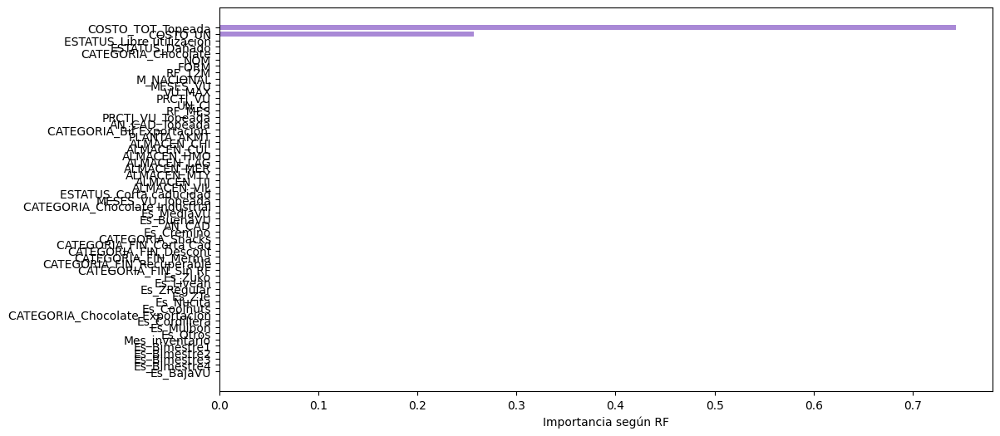

In [594]:
# Grafico la importancia de cada variable
importance_df = importance_df.sort_values(by = 'Importance', ascending = False)
plt.figure(figsize=(12, 6))  # Tamaño de la figura
plt.barh(importance_df['Feature'],
         importance_df['Importance'],
         color = '#A989D6')
plt.xlabel('Importancia según RF')
plt.gca().invert_yaxis()  # Invertir el eje Y para mostrar la característica más relevante en la parte superior
plt.show()

Con este análisis se establece que al incluir la variables construidas a partir de get dummies, COSTO_TOT_Topeada y COSTO_UN son las variables más importantes para el modelo, lo que indica que la creación de variables no estaría aportando mejoras al modelo.

<Figure size 768x576 with 0 Axes>

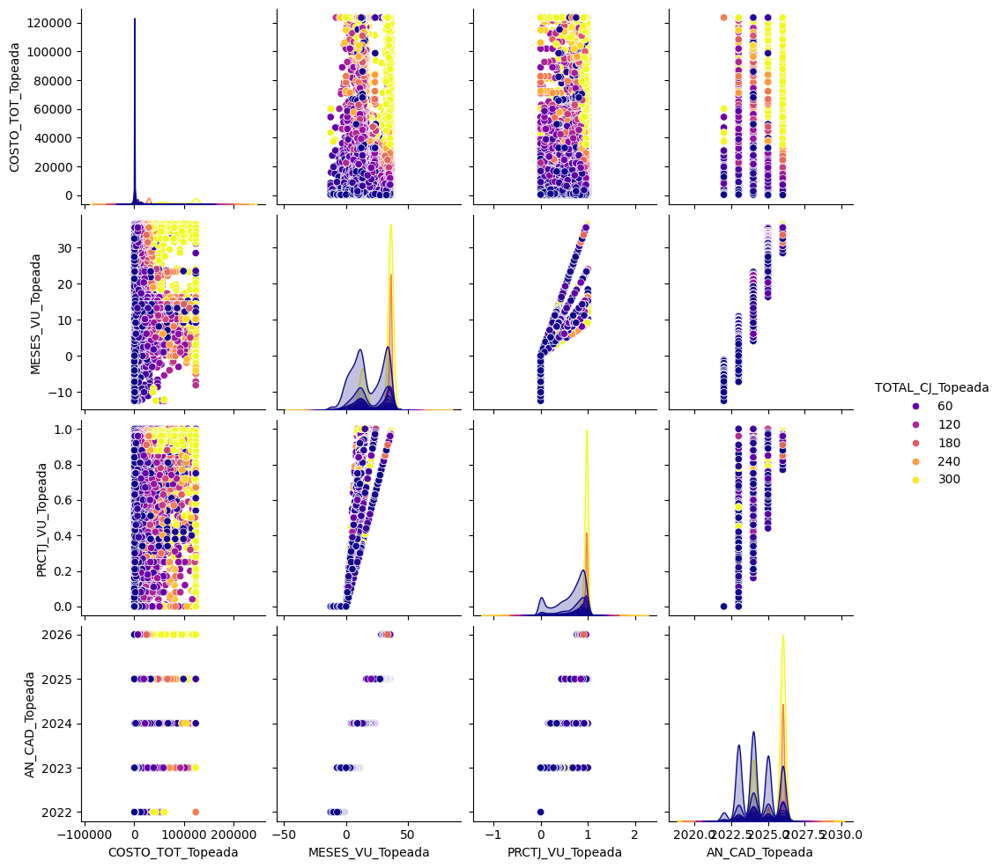

In [595]:
variables = ['TOTAL_CJ_Topeada','COSTO_TOT_Topeada', 'MESES_VU_Topeada','PRCTJ_VU_Topeada', 'AN_CAD_Topeada']
plt.figure(dpi = 120)
sns.pairplot(df[variables],
             hue = 'TOTAL_CJ_Topeada',
             palette = 'plasma')
plt.show()

In [596]:
# Como es la correlación entre las variables
# Elijo el top 5 de variables más correlacionadas con el target
features_selec = matriz_correlacion_target.index[0:5]
features_selec

Index(['PRCTJ_VU', 'COSTO_TOT', 'AN_CAD', 'MESES_VU', 'FORM'], dtype='object')

<Axes: >

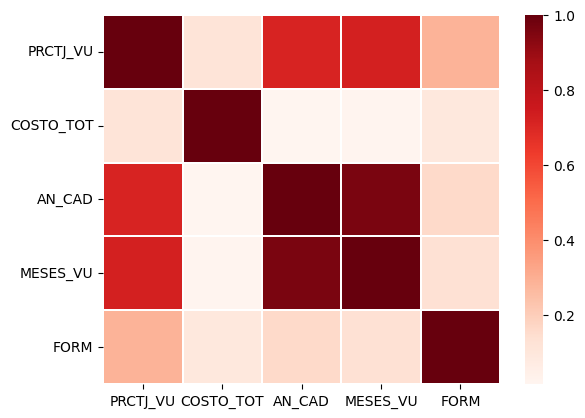

In [597]:
matriz_correlacion = df[features_selec].corr(method='pearson')
sns.heatmap(abs(matriz_correlacion),
           #cbar=False,
           linewidths = 0.3,
           cmap = 'Reds')

# ALGORITMOS DE REGRESIÓN

In [598]:
# Separando la muestra: TRAIN y TEST
df_train,df_test = train_test_split(df,
                                    test_size = 0.3, #Porcentaje de muestra test
                                    random_state = 123) #Semilla

In [599]:
print('TOTAL_CJ_TOPEADA_Log Promedio en TRAIN')
print(df_train['TOTAL_CJ_Topeada_Log'].mean())
print('TOTAL_CJ_TOPEADA_Log Promedio en TEST')
print(df_test['TOTAL_CJ_Topeada_Log'].mean())

TOTAL_CJ_TOPEADA_Log Promedio en TRAIN
3.132559410440274
TOTAL_CJ_TOPEADA_Log Promedio en TEST
3.1318805466207924


# Modelo 1. Feature con mayor correlación

In [600]:
# Estimo coeficientes para modelo de regresión lineal:
model1 = 'TOTAL_CJ_Topeada_Log ~ COSTO_TOT_Topeada_Log'
lm1 = sm.OLS.from_formula(formula = model1, data = df_train).fit()
print(lm1.summary())

                             OLS Regression Results                             
Dep. Variable:     TOTAL_CJ_Topeada_Log   R-squared:                       0.825
Model:                              OLS   Adj. R-squared:                  0.825
Method:                   Least Squares   F-statistic:                 1.147e+05
Date:                  Sat, 30 Mar 2024   Prob (F-statistic):               0.00
Time:                          18:26:42   Log-Likelihood:                -30920.
No. Observations:                 24268   AIC:                         6.184e+04
Df Residuals:                     24266   BIC:                         6.186e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept 

Text(0.5, 1.0, 'Datos en train vs Estimación Modelo 1')

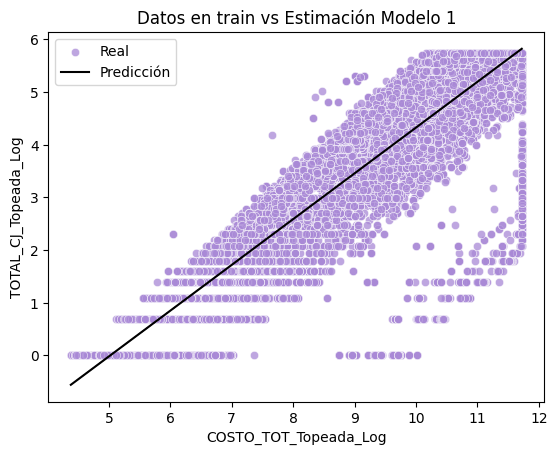

In [601]:
# Graficamente:
df_train['y_estimado'] = lm1.predict(df_train)
df_test['y_estimado'] = lm1.predict(df_test)
g1 = plt.figure()
sns.scatterplot(data = df_train,
                x = 'COSTO_TOT_Topeada_Log',
                y = 'TOTAL_CJ_Topeada_Log',
                label = 'Real',
                color = '#A989D6',
                alpha = 0.75)
sns.lineplot(data = df_train,
                x = 'COSTO_TOT_Topeada_Log',
                y = 'y_estimado',
                label = 'Predicción',
                color = 'black')
plt.xlabel('COSTO_TOT_Topeada_Log')
plt.ylabel('TOTAL_CJ_Topeada_Log')
plt.title('Datos en train vs Estimación Modelo 1')

In [602]:
coeficientes1 = lm1.params
print('Coeficientes1:')
print(coeficientes1)

Coeficientes1:
Intercept               -4.359285
COSTO_TOT_Topeada_Log    0.868252
dtype: float64


In [603]:
intervalo_confianza1 = lm1.conf_int()
print("Intervalo de confianza de los coeficientes:")
print(intervalo_confianza1)

Intervalo de confianza de los coeficientes:
                              0         1
Intercept             -4.403982 -4.314588
COSTO_TOT_Topeada_Log  0.863228  0.873276


In [604]:
pvalores1 = lm1.pvalues
print('P-Valores:')
print(pvalores1.round(3))

P-Valores:
Intercept                0.0
COSTO_TOT_Topeada_Log    0.0
dtype: float64


In [605]:
r_cuadrado1 = lm1.rsquared
print("Coeficiente de determinación (R-cuadrado):", r_cuadrado1.round(3))

Coeficiente de determinación (R-cuadrado): 0.825


El modelo tiene un R2 = 0.825, lo cual es bueno pues el ideal es 1, sin embargo sería necesario considerar una mayor cantidad de features.

In [606]:
# Genero columna de predicciones
df_train['Pred_1'] = lm1.predict(df_train)
df_test['Pred_1'] = lm1.predict(df_test)

# Modelo 2. 2 Features

In [607]:
# Estimo coeficientes para modelo de regresión lineal con 2 features:
model2 = 'TOTAL_CJ_Topeada_Log ~ COSTO_TOT_Topeada_Log + PRCTJ_VU_Topeada'
lm2 = sm.OLS.from_formula(formula=model2, data=df_train).fit()
print(lm2.summary())

                             OLS Regression Results                             
Dep. Variable:     TOTAL_CJ_Topeada_Log   R-squared:                       0.843
Model:                              OLS   Adj. R-squared:                  0.843
Method:                   Least Squares   F-statistic:                 6.504e+04
Date:                  Sat, 30 Mar 2024   Prob (F-statistic):               0.00
Time:                          18:28:09   Log-Likelihood:                -29650.
No. Observations:                 24268   AIC:                         5.931e+04
Df Residuals:                     24265   BIC:                         5.933e+04
Df Model:                             2                                         
Covariance Type:              nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept 

Text(0.5, 1.0, 'Datos en train vs Estimación Modelo 2')

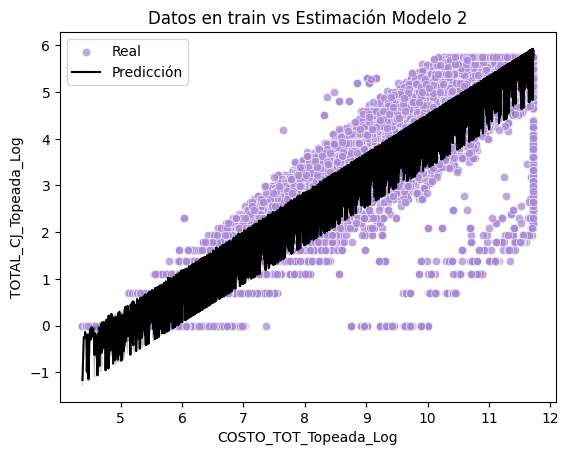

In [608]:
# Graficamente:
df_train['y_estimado'] = lm2.predict(df_train)
df_test['y_estimado'] = lm2.predict(df_test)
g1 = plt.figure()
sns.scatterplot(data = df_train,
                x = 'COSTO_TOT_Topeada_Log',
                y = 'TOTAL_CJ_Topeada_Log',
                label = 'Real',
                color = '#A989D6',
                alpha = 0.75)
sns.lineplot(data = df_train,
                x = 'COSTO_TOT_Topeada_Log',
                y = 'y_estimado',
                label = 'Predicción',
                color = 'black')
plt.xlabel('COSTO_TOT_Topeada_Log')
plt.ylabel('TOTAL_CJ_Topeada_Log')
plt.title('Datos en train vs Estimación Modelo 2')

In [609]:
coeficientes2 = lm2.params
print('Coeficientes2:')
print(coeficientes2)

Coeficientes2:
Intercept               -4.886563
COSTO_TOT_Topeada_Log    0.825872
PRCTJ_VU_Topeada         1.139825
dtype: float64


In [610]:
intervalo_confianza2 = lm2.conf_int()
print("Intervalo de confianza de los coeficientes:")
print(intervalo_confianza2)

Intervalo de confianza de los coeficientes:
                              0         1
Intercept             -4.933449 -4.839676
COSTO_TOT_Topeada_Log  0.820841  0.830903
PRCTJ_VU_Topeada       1.096647  1.183003


In [611]:
pvalores2 = lm2.pvalues
print('P-Valores:')
print(pvalores2.round(3))

P-Valores:
Intercept                0.0
COSTO_TOT_Topeada_Log    0.0
PRCTJ_VU_Topeada         0.0
dtype: float64


In [612]:
r_cuadrado2 = lm2.rsquared
print("Coeficiente de determinación (R-cuadrado):", r_cuadrado2.round(3))

Coeficiente de determinación (R-cuadrado): 0.843


Al incluir 2 features el R2 mejora, pasando de 0.825 a 0.843

---



In [613]:
# Genero columna de predicciones
df_train['Pred_2'] = lm2.predict(df_train)
df_test['Pred_2'] = lm2.predict(df_test)

# Modelo 3. n_Features

In [614]:
# Estimo coeficientes para modelo de regresión lineal con n features:
model3 = 'TOTAL_CJ_Topeada_Log ~ COSTO_TOT_Topeada_Log + PRCTJ_VU_Topeada + AN_CAD_Topeada + MESES_VU_Topeada + Es_BuenaVU'
lm3 = sm.OLS.from_formula(formula=model3, data=df_train).fit()
print(lm3.summary())

                             OLS Regression Results                             
Dep. Variable:     TOTAL_CJ_Topeada_Log   R-squared:                       0.888
Model:                              OLS   Adj. R-squared:                  0.888
Method:                   Least Squares   F-statistic:                 3.841e+04
Date:                  Sat, 30 Mar 2024   Prob (F-statistic):               0.00
Time:                          18:29:38   Log-Likelihood:                -25553.
No. Observations:                 24268   AIC:                         5.112e+04
Df Residuals:                     24262   BIC:                         5.117e+04
Df Model:                             5                                         
Covariance Type:              nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept 

Text(0.5, 1.0, 'Datos en train vs Estimación Modelo 3')

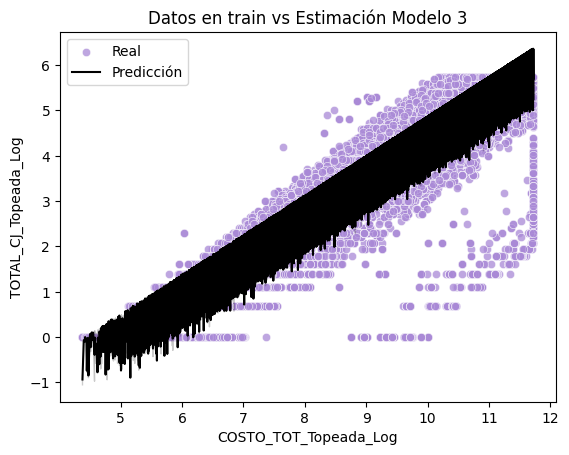

In [615]:
# Graficamente:
df_train['y_estimado'] = lm3.predict(df_train)
df_test['y_estimado'] = lm3.predict(df_test)
g1 = plt.figure()
sns.scatterplot(data = df_train,
                x = 'COSTO_TOT_Topeada_Log',
                y = 'TOTAL_CJ_Topeada_Log',
                label = 'Real',
                color = '#A989D6',
                alpha = 0.75)
sns.lineplot(data = df_train,
                x = 'COSTO_TOT_Topeada_Log',
                y = 'y_estimado',
                label = 'Predicción',
                color = 'black')
plt.xlabel('COSTO_TOT_Topeada_Log')
plt.ylabel('TOTAL_CJ_Topeada_Log')
plt.title('Datos en train vs Estimación Modelo 3')

In [616]:
coeficientes3 = lm3.params
print('Coeficientes3:')
print(coeficientes3)

Coeficientes3:
Intercept               -49.614444
Es_BuenaVU[T.True]        0.227419
COSTO_TOT_Topeada_Log     0.870481
PRCTJ_VU_Topeada         -1.217642
AN_CAD_Topeada            0.022179
MESES_VU_Topeada          0.049823
dtype: float64


In [617]:
intervalo_confianza3 = lm3.conf_int()
print("Intervalo de confianza de los coeficientes:")
print(intervalo_confianza3)

Intervalo de confianza de los coeficientes:
                                0         1
Intercept             -106.221914  6.993025
Es_BuenaVU[T.True]       0.193015  0.261823
COSTO_TOT_Topeada_Log    0.866126  0.874836
PRCTJ_VU_Topeada        -1.289747 -1.145538
AN_CAD_Topeada          -0.005807  0.050165
MESES_VU_Topeada         0.047290  0.052356


In [618]:
pvalores3 = lm3.pvalues
print('P-Valores:')
print(pvalores3.round(3))

P-Valores:
Intercept                0.086
Es_BuenaVU[T.True]       0.000
COSTO_TOT_Topeada_Log    0.000
PRCTJ_VU_Topeada         0.000
AN_CAD_Topeada           0.120
MESES_VU_Topeada         0.000
dtype: float64


In [619]:
r_cuadrado3 = lm3.rsquared
print("Coeficiente de determinación (R-cuadrado):", r_cuadrado3.round(3))

Coeficiente de determinación (R-cuadrado): 0.888


El modelo 3 presenta un mejor resultado de R2 =0.888 superando los 2 modelos anteriores.

In [620]:
# Genero columna de predicciones
df_train['Pred_3'] = lm3.predict(df_train)
df_test['Pred_3'] = lm3.predict(df_test)

# Modelo 4. Componentes principales para reducir dimensionalidad

In [621]:
df_PCA = df[['COSTO_TOT_Topeada','MESES_VU_Topeada','PRCTJ_VU_Topeada','AN_CAD_Topeada','Es_BuenaVU', 'Es_MediaVU']]
df_PCA.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34669 entries, 0 to 34671
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   COSTO_TOT_Topeada  34669 non-null  float64
 1   MESES_VU_Topeada   34669 non-null  float64
 2   PRCTJ_VU_Topeada   34669 non-null  float64
 3   AN_CAD_Topeada     34669 non-null  int64  
 4   Es_BuenaVU         34669 non-null  bool   
 5   Es_MediaVU         34669 non-null  bool   
dtypes: bool(2), float64(3), int64(1)
memory usage: 1.4 MB


In [622]:
# Analizo correlaciones
df_PCA.corr(method='pearson')

,COSTO_TOT_Topeada,MESES_VU_Topeada,PRCTJ_VU_Topeada,AN_CAD_Topeada,Es_BuenaVU,Es_MediaVU
COSTO_TOT_Topeada,1.000000,0.052492,0.235173,0.067552,0.205074,-0.134778
MESES_VU_Topeada,0.052492,1.000000,0.740779,0.959801,0.648967,-0.329843
PRCTJ_VU_Topeada,0.235173,0.740779,1.000000,0.728836,0.825956,-0.310169
AN_CAD_Topeada,0.067552,0.959801,0.728836,1.000000,0.636645,-0.326682
Es_BuenaVU,0.205074,0.648967,0.825956,0.636645,1.000000,-0.745898
Es_MediaVU,-0.134778,-0.329843,-0.310169,-0.326682,-0.745898,1.000000


In [623]:
# Extraer la matriz de características
X = df_PCA.values

In [624]:
# Crear un objeto PCA
pca = PCA(n_components = 4)

In [625]:
# Ajustar el modelo PCA a los datos
pca.fit(X)

PCA(n_components=4)

In [626]:
# Obtener las componentes principales
componentes_principales = pca.transform(X)

In [627]:
# Crear un nuevo DataFrame con las componentes principales
df_PCA_final = pd.DataFrame(data = componentes_principales)
df_PCA_final.head()

,0,1,2,3
0,67388.477340,9.508650,-0.379158,0.100498
1,-16136.002819,17.254588,-0.044958,0.300930
2,-25385.162817,17.084752,-0.068621,0.296609
3,-25086.802813,16.861001,-0.062573,0.315553
4,-19417.962814,16.965094,-0.048069,0.318201


In [628]:
# Normalizar los datos
scaler = StandardScaler()
X = df_PCA.values
X = scaler.fit_transform(X)

# Sigo el paso a paso
pca = PCA(n_components = 4)

pca.fit(X)

componentes_principales = pca.transform(X)

df_PCA_final = pd.DataFrame(data = componentes_principales)
prefijo = "PC_"
df_PCA_final= df_PCA_final.add_prefix(prefijo)
df_PCA_final.head()

,PC_0,PC_1,PC_2,PC_3
0,-0.361446,2.124427,0.586518,-0.602626
1,2.869500,0.581511,-1.090782,0.665194
2,2.899493,0.393111,-1.246994,0.607827
3,2.871620,0.391623,-1.230146,0.590311
4,2.853237,0.507095,-1.134403,0.625472


Text(0.5, 1.0, 'Gráfico de Dispersión de las Dos Primeras Componentes Principales')

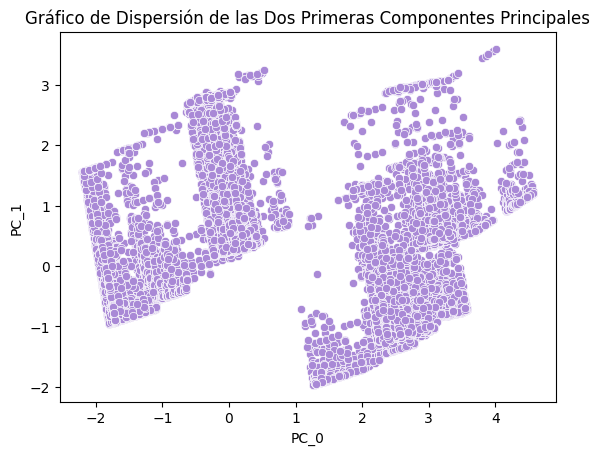

In [629]:
# Grafico de dispersión
plt.figure()
sns.scatterplot(data = df_PCA_final,
                x = 'PC_0',
                y = 'PC_1',
                color = '#A989D6')
plt.title('Gráfico de Dispersión de las Dos Primeras Componentes Principales')

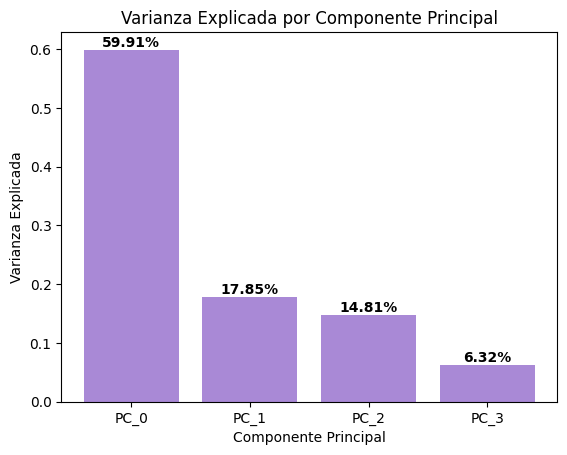

In [630]:
# Análisis de la varianza explicada para cada componente
varianza_explicada = pca.explained_variance_ratio_
componentes = df_PCA_final.columns

plt.bar(componentes, varianza_explicada,
        color = '#A989D6')
plt.xlabel('Componente Principal')
plt.ylabel('Varianza Explicada')
plt.title('Varianza Explicada por Componente Principal')
ax = plt.gca()
for p in ax.patches:
    x_text = p.get_x() + p.get_width() / 2.0  # Calcula la posición x del texto
    y_text = p.get_height()  # Toma la altura de la columna
    ax.text(x_text, y_text, f'{str(round(y_text * 100,2))}%', # Indica posición x e y, y texto a mostrar
            ha = 'center', # Alineación horizontal
            va = 'bottom',  # Alineación vertical
            fontsize = 10, color = 'black', fontweight = 'bold')
plt.show()

El primer componente principal es responsable de la varianza del 59.91%. De manera similar, el segundo componente principal causa una variación del 17.85% en el conjunto de datos. En conjunto, podemos decir que el 77.77% de la información del conjunto de características es capturada por los dos primeros componentes principales.

Text(0.5, 1.0, 'Relación entre componentes y variable target')

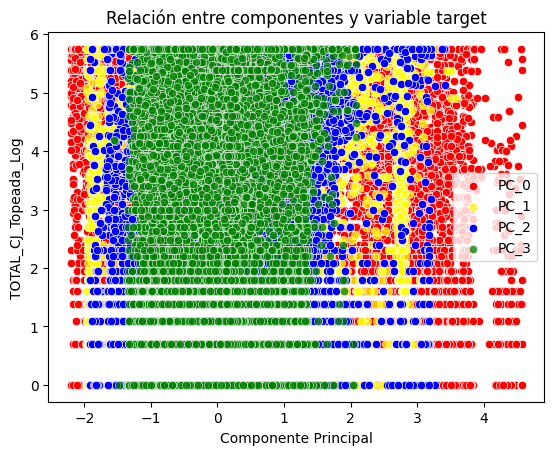

In [631]:
# Relación con el target
df_train['PC_0'] = df_PCA_final['PC_0']
df_train['PC_1'] = df_PCA_final['PC_1']
df_train['PC_2'] = df_PCA_final['PC_2']
df_train['PC_3'] = df_PCA_final['PC_3']

sns.scatterplot(data = df_train,
                x = 'PC_0',
                y = 'TOTAL_CJ_Topeada_Log',
               label='PC_0',
               color = 'red',
                alpha = 1)
sns.scatterplot(data = df_train,
                x = 'PC_1',
                y = 'TOTAL_CJ_Topeada_Log',
                label = 'PC_1',
                color = 'yellow',
                alpha = 0.75)
sns.scatterplot(data = df_train,
                x = 'PC_2',
                y = 'TOTAL_CJ_Topeada_Log',
               label='PC_2',
               color = 'blue',
                alpha = 1)
sns.scatterplot(data = df_train,
                x = 'PC_3',
                y = 'TOTAL_CJ_Topeada_Log',
                label = 'PC_3',
                color = 'green',
                alpha = 0.75)
plt.xlabel('Componente Principal')
plt.ylabel('TOTAL_CJ_Topeada_Log')
plt.title('Relación entre componentes y variable target')

In [632]:
ANALIZAR = df_train[['COSTO_TOT_Topeada_Log','MESES_VU_Topeada','PRCTJ_VU_Topeada','AN_CAD_Topeada','Es_BuenaVU', 'Es_MediaVU','PC_1','PC_0','TOTAL_CJ_Topeada_Log']]
print("Coeficientes de Correlación con variable target:")
ANALIZAR.corr(method = 'pearson')['TOTAL_CJ_Topeada_Log'].sort_values(ascending = False)

Coeficientes de Correlación con variable target:


TOTAL_CJ_Topeada_Log     1.000000
COSTO_TOT_Topeada_Log    0.908533
PRCTJ_VU_Topeada         0.414734
Es_BuenaVU               0.375748
AN_CAD_Topeada           0.333844
MESES_VU_Topeada         0.327706
PC_1                     0.247168
Es_MediaVU              -0.243173
PC_0                    -0.359015
Name: TOTAL_CJ_Topeada_Log, dtype: float64

In [633]:
# Estimo coeficientes para modelo de regresión lineal con PCA:
df_train['PC_0'] = df_PCA_final['PC_0']
df_test['PC_0'] = df_PCA_final['PC_0']
model4 = 'TOTAL_CJ_Topeada_Log ~ PC_0'
lm4 = sm.formula.ols(formula = model4, data=df_train).fit()
print(lm4.summary())

                             OLS Regression Results                             
Dep. Variable:     TOTAL_CJ_Topeada_Log   R-squared:                       0.129
Model:                              OLS   Adj. R-squared:                  0.129
Method:                   Least Squares   F-statistic:                     3590.
Date:                  Sat, 30 Mar 2024   Prob (F-statistic):               0.00
Time:                          18:31:13   Log-Likelihood:                -50421.
No. Observations:                 24266   AIC:                         1.008e+05
Df Residuals:                     24264   BIC:                         1.009e+05
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.1306      0.012

Text(0.5, 1.0, 'Datos reales (Componentes Principales) vs Estimación Modelo 4')

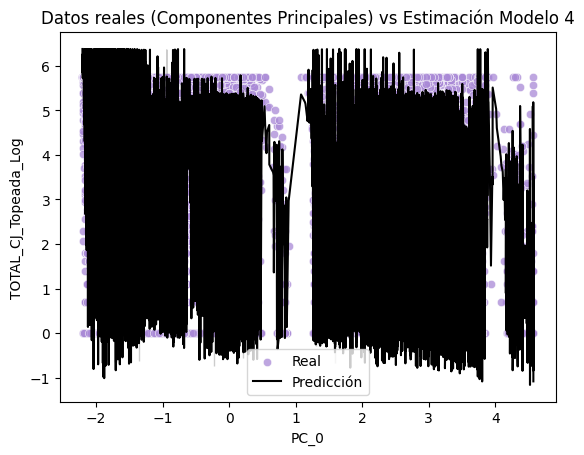

In [634]:
# Graficamente:
plt.figure()
sns.scatterplot(data = df_train,
                x = 'PC_0',
                y = 'TOTAL_CJ_Topeada_Log',
                label = 'Real',
                color = '#A989D6',
                alpha = 0.75)
sns.lineplot(data = df_train,
                x = 'PC_0',
                y = 'y_estimado',
                label = 'Predicción',
                color = 'black')
plt.xlabel('PC_0')
plt.ylabel('TOTAL_CJ_Topeada_Log')
plt.title('Datos reales (Componentes Principales) vs Estimación Modelo 4')

In [635]:
coeficientes4 = lm4.params
print('Coeficientes4:')
print(coeficientes4)

Coeficientes4:
Intercept    3.130605
PC_0        -0.393800
dtype: float64


In [636]:
pvalores4 = lm4.pvalues
print('P-Valores4:')
print(pvalores4.round(3))

P-Valores4:
Intercept    0.0
PC_0         0.0
dtype: float64


In [637]:
intervalo_confianza4 = lm4.conf_int()
print("Intervalo de confianza de los coeficientes4:")
print(intervalo_confianza4)

Intervalo de confianza de los coeficientes4:
                  0         1
Intercept  3.106286  3.154924
PC_0      -0.406682 -0.380918


In [638]:
r_cuadrado4 = lm4.rsquared
print("Coeficiente de determinación (R-cuadrado):", r_cuadrado4.round(6))

Coeficiente de determinación (R-cuadrado): 0.128892


El modelo 4. tiene en R2 más bajo de los 4 probados, se descarta.

In [639]:
# Genero columna de predicciones
df_train['Pred_4'] = lm4.predict(df_train)
df_test['Pred_4'] = lm4.predict(df_test)

# Comparando modelos 1 al 4

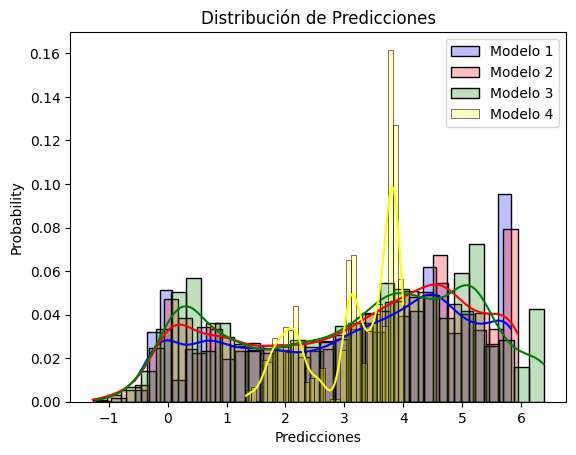

In [640]:
# Graficamente Distribución de predicciones
plt.figure()
# Histograma
sns.histplot(data = df_test,
             x ='Pred_1',
             bins = 30,
             alpha = 0.25,
             kde = True,
             stat='probability',
             color = 'blue',
            label = 'Modelo 1')
sns.histplot(data  = df_test,
             x ='Pred_2',
             bins = 30,
             alpha = 0.25,
             kde = True,
             stat='probability',
             color='red',
             label='Modelo 2')
sns.histplot(data  = df_test,
             x ='Pred_3',
             bins = 30,
             alpha = 0.25,
             kde = True,
             stat='probability',
             color='green',
             label='Modelo 3')
sns.histplot(data  = df_test,
             x ='Pred_4',
             bins = 30,
             alpha = 0.25,
             kde = True,
             stat='probability',
             color='yellow',
             label='Modelo 4')
plt.title('Distribución de Predicciones')
plt.xlabel('Predicciones')
plt.legend()
plt.show()

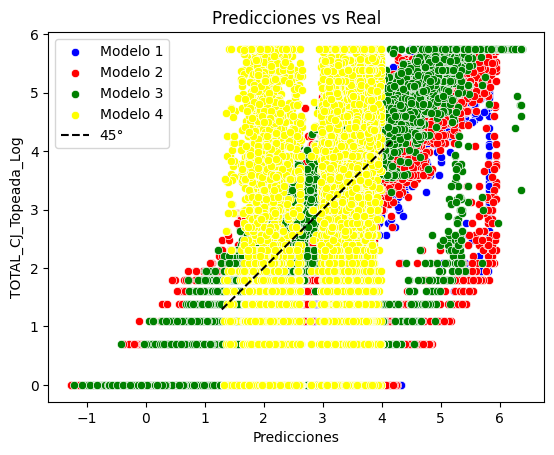

In [641]:
# Graficamente real vs Predición
plt.figure()

sns.scatterplot(data = df_test,
                x = 'Pred_1',
                y = 'TOTAL_CJ_Topeada_Log',
                color = 'blue',
               label = 'Modelo 1')
minimo = df_test['Pred_1'].min()
maximo = df_test['Pred_1'].max()

sns.scatterplot(data = df_test,
                x = 'Pred_2',
                y = 'TOTAL_CJ_Topeada_Log',
                color = 'red',
               label = 'Modelo 2')
minimo = df_test['Pred_2'].min()
maximo = df_test['Pred_2'].max()

sns.scatterplot(data = df_test,
                x = 'Pred_3',
                y = 'TOTAL_CJ_Topeada_Log',
                color = 'green',
               label = 'Modelo 3')
minimo = df_test['Pred_3'].min()
maximo = df_test['Pred_3'].max()

sns.scatterplot(data = df_test,
                x = 'Pred_4',
                y = 'TOTAL_CJ_Topeada_Log',
                color = 'yellow',
               label = 'Modelo 4')
minimo = df_test['Pred_4'].min()
maximo = df_test['Pred_4'].max()

linea_45_grados = np.linspace(minimo*0.97, maximo*1.04, 100)
plt.plot(linea_45_grados, linea_45_grados,
         color='black', linestyle='--', label='45°')  # Trazar la línea
plt.title('Predicciones vs Real')
plt.xlabel('Predicciones')
plt.legend()
plt.show()

In [642]:
# Metricas
rmse_1_test= mean_squared_error(df_test['TOTAL_CJ_Topeada_Log'], df_test['Pred_1'], squared=False)
r_squared_1_test = r2_score(df_test['TOTAL_CJ_Topeada_Log'], df_test['Pred_1'])
rmse_1_train = mean_squared_error(df_train['TOTAL_CJ_Topeada_Log'], df_train['Pred_1'], squared=False)
r_squared_1_train = r2_score(df_train['TOTAL_CJ_Topeada_Log'], df_train['Pred_1'])

rmse_2_test = mean_squared_error(df_test['TOTAL_CJ_Topeada_Log'], df_test['Pred_2'], squared=False)
r_squared_2_test = r2_score(df_test['TOTAL_CJ_Topeada_Log'], df_test['Pred_2'])
rmse_2_train = mean_squared_error(df_train['TOTAL_CJ_Topeada_Log'], df_train['Pred_2'], squared=False)
r_squared_2_train = r2_score(df_train['TOTAL_CJ_Topeada_Log'], df_train['Pred_2'])

rmse_3_test= mean_squared_error(df_test['TOTAL_CJ_Topeada_Log'], df_test['Pred_3'], squared=False)
r_squared_3_test = r2_score(df_test['TOTAL_CJ_Topeada_Log'], df_test['Pred_3'])
rmse_3_train = mean_squared_error(df_train['TOTAL_CJ_Topeada_Log'], df_train['Pred_3'], squared=False)
r_squared_3_train = r2_score(df_train['TOTAL_CJ_Topeada_Log'], df_train['Pred_3'])

df_test_cleaned = df_test.dropna(subset=['TOTAL_CJ_Topeada_Log', 'Pred_4'])
df_test_filtered = df_test[df_test.index.isin(df_test_cleaned.index)]
df_train_cleaned = df_train.dropna(subset=['TOTAL_CJ_Topeada_Log', 'Pred_4'])
df_train_filtered = df_train[df_train.index.isin(df_train_cleaned.index)]

rmse_4_test = mean_squared_error(df_test_cleaned['TOTAL_CJ_Topeada_Log'], df_test_filtered['Pred_4'], squared=False)
r_squared_4_test = r2_score(df_test_cleaned['TOTAL_CJ_Topeada_Log'], df_test_filtered['Pred_4'])
rmse_4_train = mean_squared_error(df_train_cleaned['TOTAL_CJ_Topeada_Log'], df_train_filtered['Pred_4'], squared=False)
r_squared_4_train = r2_score(df_train_cleaned['TOTAL_CJ_Topeada_Log'], df_train_filtered['Pred_4'])

print('RMSE')
print('MODELO 1')
print('TEST: ' + str(rmse_1_test.round(4)))
print('TRAIN: ' + str(rmse_1_train.round(4)))
print('----------------')
print('MODELO 2')
print('TEST: ' + str(rmse_2_test.round(4)))
print('TRAIN: ' + str(rmse_2_train.round(4)))
print('----------------')
print('MODELO 3')
print('TEST: ' + str(rmse_3_test.round(4)))
print('TRAIN: ' + str(rmse_3_train.round(4)))
print('----------------')
print('MODELO 4')
print('TEST: ' + str(rmse_4_test.round(4)))
print('TRAIN: ' + str(rmse_4_train.round(4)))

RMSE
MODELO 1
TEST: 0.8744
TRAIN: 0.8652
----------------
MODELO 2
TEST: 0.8269
TRAIN: 0.821
----------------
MODELO 3
TEST: 0.6997
TRAIN: 0.6935
----------------
MODELO 4
TEST: 1.9369
TRAIN: 1.9327


In [643]:
print('r - 2')
print('MODELO 1')
print('TEST: ' + str(r_squared_1_test.round(4)))
print('TRAIN: ' + str(r_squared_1_train.round(4)))
print('----------------')
print('MODELO 2')
print('TEST: ' + str(r_squared_2_test.round(4)))
print('TRAIN: ' + str(r_squared_2_train.round(4)))
print('----------------')
print('MODELO 3')
print('TEST: ' + str(r_squared_3_test.round(4)))
print('TRAIN: ' + str(r_squared_3_train.round(4)))
print('----------------')
print('MODELO 2')
print('TEST: ' + str(r_squared_4_test.round(4)))
print('TRAIN: ' + str(r_squared_4_train.round(4)))

r - 2
MODELO 1
TEST: 0.8227
TRAIN: 0.8254
----------------
MODELO 2
TEST: 0.8414
TRAIN: 0.8428
----------------
MODELO 3
TEST: 0.8864
TRAIN: 0.8878
----------------
MODELO 2
TEST: 0.1298
TRAIN: 0.1289


El mejor modelo es el 3, tiene el R2 más alto (0.88), de igual manera el RMS es el más bajo (0.69), en ambos casas es muy similar es Test y Train.

---



# Mejorando Regresión Lineal

In [644]:
# Separamos en train y test
from sklearn.model_selection import train_test_split

# Variables a procesar
features = ['COSTO_TOT_Topeada_Log','PRCTJ_VU_Topeada','AN_CAD_Topeada','MESES_VU_Topeada','Es_BuenaVU','TOTAL_CJ_Topeada_Log']

df_limpia = df.dropna(subset= features)
df_train,df_test = train_test_split(df_limpia,
                                    test_size = 0.3, #Porcentaje de muestra test
                                    random_state = 123) #Semilla
df_train = df_train.reset_index()
df_test = df_test.reset_index()

In [645]:
# Normalizamos los datos
from sklearn.preprocessing import StandardScaler

# Selecciono las variables no binarias
features_no_bin = ['COSTO_TOT_Topeada_Log','PRCTJ_VU_Topeada','AN_CAD_Topeada','MESES_VU_Topeada','TOTAL_CJ_Topeada_Log']

features_bin = ['Es_BuenaVU']

X_train = df_train[features_no_bin].values
X_test = df_test[features_no_bin].values

# Defino escalador
sc = StandardScaler()
# Genero parámetros con train
X_train = sc.fit_transform(X_train)
# Le aplico el escalador a test
X_test = sc.transform(X_test)

# Genero df
df_train_scaled = pd.DataFrame(data = X_train)
prefijo = "Scaled_"
df_train_scaled.columns = features_no_bin
df_train_scaled.add_prefix(prefijo)
df_train_scaled = df_train_scaled.add_prefix(prefijo)
df_test_scaled = pd.DataFrame(data = X_test)
prefijo = "Scaled_"
df_test_scaled.columns = features_no_bin
df_test_scaled = df_test_scaled.add_prefix(prefijo)

df_train_scaled.head()

,Scaled_COSTO_TOT_Topeada_Log,Scaled_PRCTJ_VU_Topeada,Scaled_AN_CAD_Topeada,Scaled_MESES_VU_Topeada,Scaled_TOTAL_CJ_Topeada_Log
0,0.775201,0.184516,0.219827,0.653207,0.995037
1,1.190040,0.620222,1.120663,0.989249,1.262219
2,-0.658320,0.224125,0.219827,0.682601,-0.451706
3,-0.359354,0.461783,1.120663,0.857375,-0.066079
4,-0.772860,-2.786206,-1.581846,-1.708621,-0.843332


In [646]:
# Agrego las binarias al dataset
df_train_final = pd.concat([df_train_scaled,df_train[features_bin]],axis = 1)
df_test_final = pd.concat([df_test_scaled,df_test[features_bin]],axis = 1)

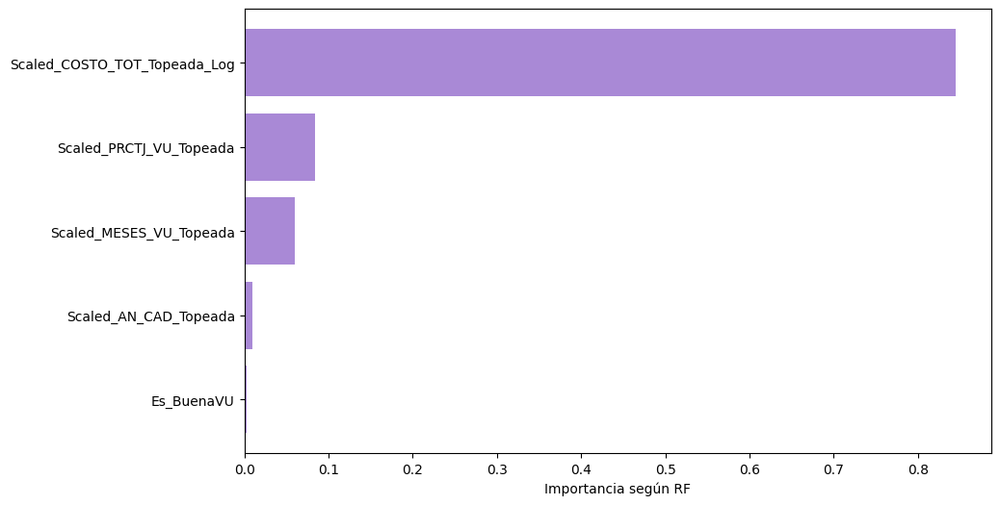

In [433]:
## Importancia de las variables
# Genero matriz de features y array de target
target = 'Scaled_TOTAL_CJ_Topeada_Log'
features = df_train_final.drop(columns=[target]).columns
X = df_train_final.drop(columns=[target]).values
y = df_train_final[target].values

# Crear el modelo de Random Forest
model = RandomForestRegressor(n_estimators = 150,
                               random_state = 123,
                               max_depth = 5,
                               min_samples_leaf = 100,
                               max_features = 3)

# Entrenar el modelo
model.fit(X, y)

# Obtener la importancia de las características
feature_importance = model.feature_importances_

# Crear un DataFrame para visualizar la importancia de las características
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importance})
importance_df = importance_df.sort_values('Importance', ascending=False)
importance_df.sort_values(by = 'Importance', ascending = False)

# Grafico la importancia de cada variable
importance_df = importance_df.sort_values(by = 'Importance', ascending = False)
importance_df = importance_df.loc[importance_df['Importance'] > 0,]
plt.figure(figsize=(10, 6))  # Tamaño de la figura
plt.barh(importance_df['Feature'],
         importance_df['Importance'],
         color = '#A989D6')
plt.xlabel('Importancia según RF')
plt.gca().invert_yaxis()
plt.show()


<Axes: >

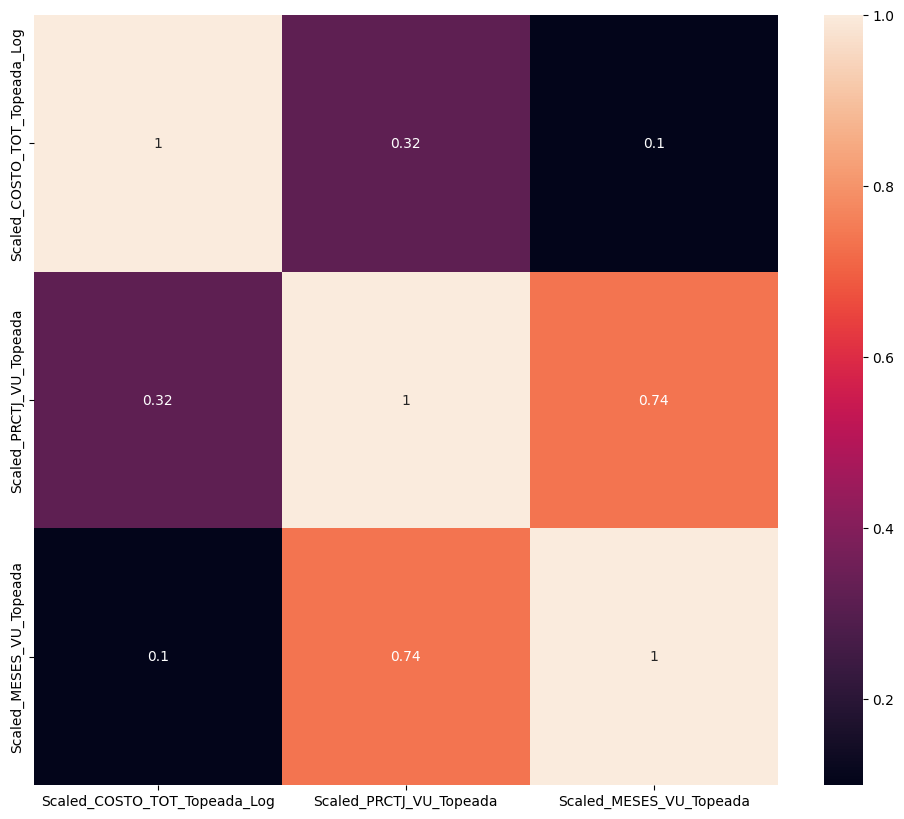

In [434]:
# Variables importantes
features_imp = importance_df['Feature'].loc[importance_df['Importance'] > 0.04]

# Matriz de correlacion
matriz_corr = df_train_final[features_imp].corr()
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(matriz_corr, annot=True)

*Regresión Lineal

In [435]:
X_train = df_train_final[features_imp].values
y_train = df_train_final[target].values
X_test = df_test_final[features_imp].values
y_test = df_test_final[target].values

linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

coeficientes = pd.DataFrame({'Features': features_imp,
                            'Coeficientes': linear_model.coef_})

# Print modelo
print('Intercepto', round(linear_model.intercept_,4))
print('')
print('Coeficientes')
coeficientes

Intercepto 0.0

Coeficientes


,Features,Coeficientes
0,Scaled_COSTO_TOT_Topeada_Log,0.912059
1,Scaled_PRCTJ_VU_Topeada,-0.110489
3,Scaled_MESES_VU_Topeada,0.318065


In [436]:
# Predicciones
y_pred_train = linear_model.predict(X_train)
y_pred_test = linear_model.predict(X_test)

# Convertimos en df la salida
df_train_predict = pd.DataFrame({'Scaled_TOTAL_CJ_Topeada_Log': y_train, 'Predict_RegLin': y_pred_train})
df_test_predict = pd.DataFrame({'Scaled_TOTAL_CJ_Topeada_Log': y_test, 'Predict_RegLin': y_pred_test})

df_test_predict.head()

,Scaled_TOTAL_CJ_Topeada_Log,Predict_RegLin
0,-1.512821,-1.540074
1,0.280591,0.299171
2,-0.400823,-0.470556
3,0.660292,0.645981
4,0.231016,0.140612


In [437]:
# Métricas

# Train
mae_train_1 = metrics.mean_absolute_error(y_train, y_pred_train)
median_error_train_1 = metrics.median_absolute_error(y_train, y_pred_train)
max_error_train_1 = metrics.max_error(y_train, y_pred_train)
rmse_train_1 = np.sqrt(metrics.mean_squared_error(y_train, y_pred_train))
r2_train_1 = r2_score(y_train, y_pred_train)

# Test
mae_test_1 = metrics.mean_absolute_error(y_test, y_pred_test)
median_error_test_1 = metrics.median_absolute_error(y_test,y_pred_test)
max_error_test_1 = metrics.max_error(y_test,y_pred_test)
rmse_test_1 = np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))
r2_test_1 = r2_score(y_test, y_pred_test)

In [438]:
print('')
print('TRAIN')
print('Mean Absolute Error: ', round(mae_train_1,4))
print('Median Absolute Error: ', round(median_error_train_1,4))
print('Max Error: ', round(max_error_train_1,4))
print('Error Cuadrático Medio: ', round(rmse_train_1,4))
print('R2: ', round(r2_train_1,4))
print('')
print('TEST')
print('Mean Absolute Error: ', round(mae_test_1,4))
print('Median Absolute Error: ', round(median_error_test_1,4))
print('Max Error: ', round(max_error_test_1,4))
print('Error Cuadrático Medio: ', round(rmse_test_1,4))
print('R2: ', round(r2_test_1,4))


TRAIN
Mean Absolute Error:  0.2011
Median Absolute Error:  0.1362
Max Error:  1.9101
Error Cuadrático Medio:  0.3361
R2:  0.887

TEST
Mean Absolute Error:  0.2018
Median Absolute Error:  0.135
Max Error:  1.9076
Error Cuadrático Medio:  0.3385
R2:  0.8861


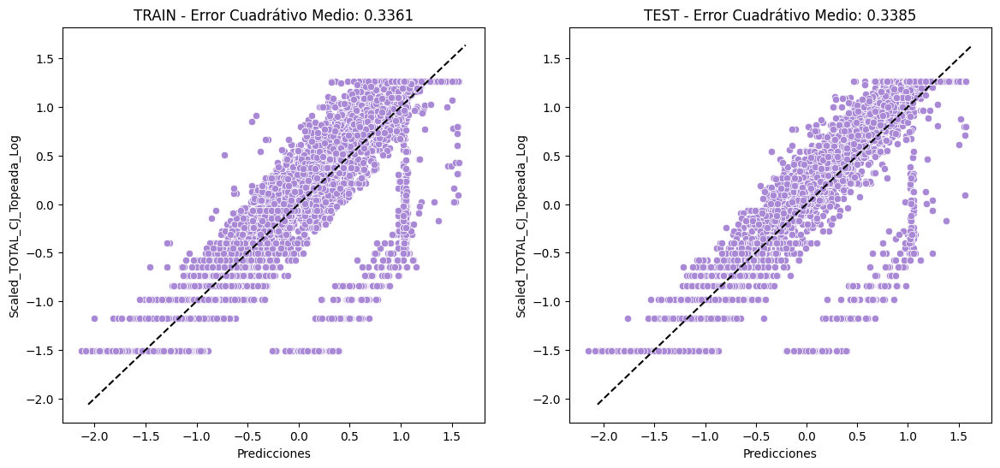

In [439]:
# Análisis Visual
minimo = df_train_predict['Predict_RegLin'].min()
maximo = df_train_predict['Predict_RegLin'].max()

fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(data = df_train_predict,
                x = 'Predict_RegLin',
                y = 'Scaled_TOTAL_CJ_Topeada_Log',
                color = '#A989D6',
                ax = axs[0])

axs[0].set_title('TRAIN - Error Cuadrátivo Medio: ' + str(round(rmse_train_1,4)))

linea_45_grados = np.linspace(minimo*0.97, maximo*1.04, 100)

axs[0].plot(linea_45_grados, linea_45_grados,
         color='black', linestyle='--', label='45°')

axs[0].set_xlabel('Predicciones')

sns.scatterplot(data = df_test_predict,
                x = 'Predict_RegLin',
                y = 'Scaled_TOTAL_CJ_Topeada_Log',
                color = '#A989D6',
                ax = axs[1])

axs[1].set_title('TEST - Error Cuadrátivo Medio: ' + str(round(rmse_test_1,4)))

linea_45_grados = np.linspace(minimo*0.97, maximo*1.04, 100)

axs[1].plot(linea_45_grados, linea_45_grados,
         color='black', linestyle='--', label='45°')

axs[1].set_xlabel('Predicciones')

plt.show()

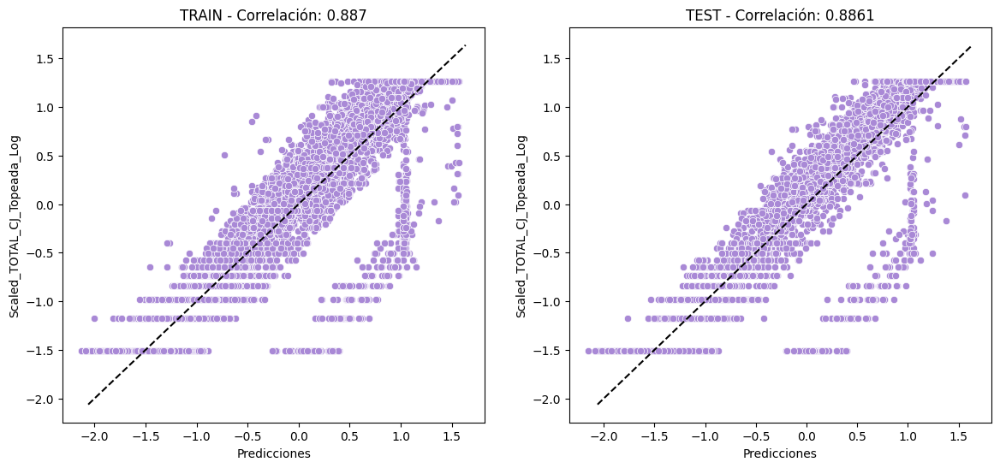

In [440]:
# Análisis Visual
minimo = df_train_predict['Predict_RegLin'].min()
maximo = df_train_predict['Predict_RegLin'].max()

fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(data = df_train_predict,
                x = 'Predict_RegLin',
                y = 'Scaled_TOTAL_CJ_Topeada_Log',
                color = '#A989D6',
                ax = axs[0])

axs[0].set_title('TRAIN - Correlación: ' + str(round(r2_train_1,4)))

linea_45_grados = np.linspace(minimo*0.97, maximo*1.04, 100)

axs[0].plot(linea_45_grados, linea_45_grados,
         color='black', linestyle='--', label='45°')

axs[0].set_xlabel('Predicciones')

sns.scatterplot(data = df_test_predict,
                x = 'Predict_RegLin',
                y = 'Scaled_TOTAL_CJ_Topeada_Log',
                color = '#A989D6',
                ax = axs[1])

axs[1].set_title('TEST - Correlación: ' + str(round(r2_test_1,4)))

linea_45_grados = np.linspace(minimo*0.97, maximo*1.04, 100)

axs[1].plot(linea_45_grados, linea_45_grados,
         color='black', linestyle='--', label='45°')

axs[1].set_xlabel('Predicciones')

plt.show()

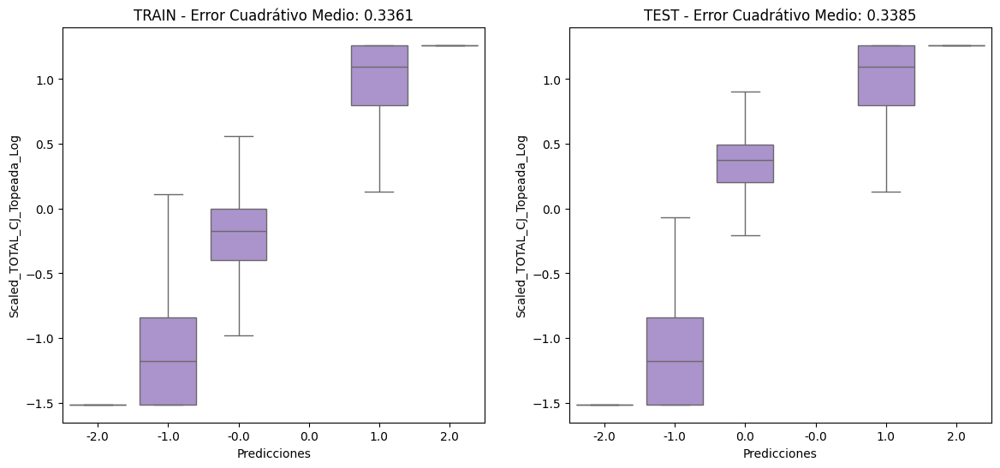

In [441]:
# Analisis Visual 2
df_train_predict['Predict_RegLin_bin'] = np.round(df_train_predict['Predict_RegLin'])
df_test_predict['Predict_RegLin_bin'] = np.round(df_test_predict['Predict_RegLin'])


fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.boxplot(data = df_train_predict,
            x = 'Predict_RegLin_bin',
            y = 'Scaled_TOTAL_CJ_Topeada_Log',
            color = '#A989D6',
            showfliers = False,
            ax = axs[0])

axs[0].set_title('TRAIN - Error Cuadrátivo Medio: ' + str(round(rmse_train_1,4)))

axs[0].set_xlabel('Predicciones')

sns.boxplot(data = df_test_predict,
            x = 'Predict_RegLin_bin',
            y = 'Scaled_TOTAL_CJ_Topeada_Log',
            color = '#A989D6',
            showfliers = False,
            ax = axs[1])


axs[1].set_title('TEST - Error Cuadrátivo Medio: ' + str(round(rmse_test_1,4)))


axs[1].set_xlabel('Predicciones')

plt.show()

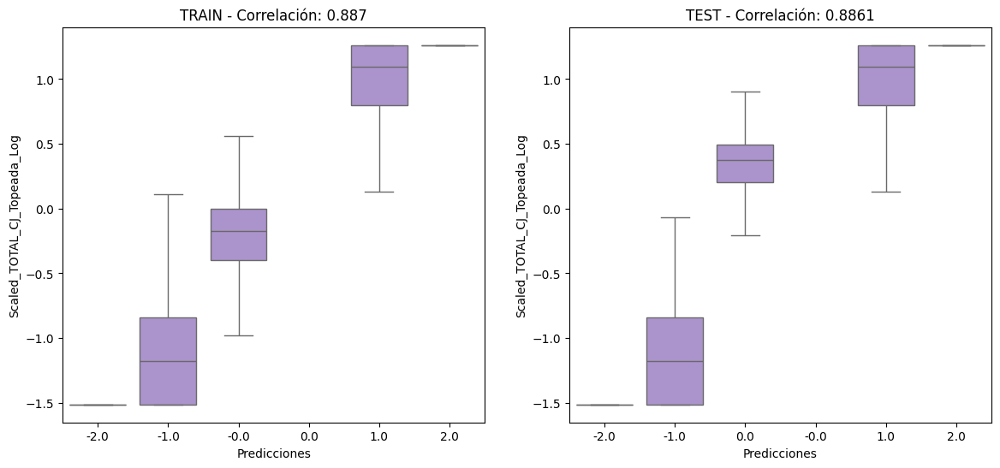

In [442]:
# Analisis Visual 2
df_train_predict['Predict_RegLin_bin'] = np.round(df_train_predict['Predict_RegLin'])
df_test_predict['Predict_RegLin_bin'] = np.round(df_test_predict['Predict_RegLin'])


fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.boxplot(data = df_train_predict,
            x = 'Predict_RegLin_bin',
            y = 'Scaled_TOTAL_CJ_Topeada_Log',
            color = '#A989D6',
            showfliers = False,
            ax = axs[0])

axs[0].set_title('TRAIN - Correlación: ' + str(round(r2_train_1,4)))

axs[0].set_xlabel('Predicciones')

sns.boxplot(data = df_test_predict,
            x = 'Predict_RegLin_bin',
            y = 'Scaled_TOTAL_CJ_Topeada_Log',
            color = '#A989D6',
            showfliers = False,
            ax = axs[1])


axs[1].set_title('TEST - Correlación: ' + str(round(r2_test_1,4)))


axs[1].set_xlabel('Predicciones')

plt.show()

Análisis de errores

In [443]:
df_train_predict['Error_RegLin'] = df_train_predict['Predict_RegLin'] - df_train_predict['Scaled_TOTAL_CJ_Topeada_Log']
df_test_predict['Error_RegLin'] = df_test_predict['Predict_RegLin'] - df_test_predict['Scaled_TOTAL_CJ_Topeada_Log']

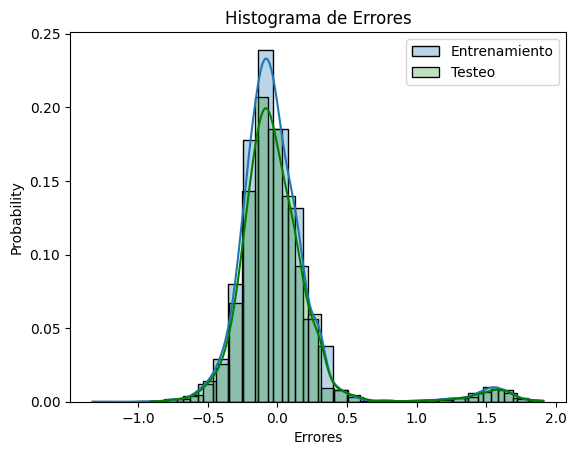

In [444]:
# Histograma de errores
sns.histplot(df_train_predict['Error_RegLin'],
             kde = True,
             bins = 30,
             alpha = 0.3,
             stat = 'probability',
            label='Entrenamiento')
sns.histplot(data  = df_test_predict,
             x = 'Error_RegLin',
             bins = 30,
             alpha = 0.25,
             kde = True,
             stat='probability',
             color='green',
             label='Testeo')
plt.title('Histograma de Errores')
plt.xlabel('Errores')
plt.legend()
plt.show()

Detección de outliers

In [445]:
# Genero las matrices sin NAs para correr el algoritmo
X_train = df_train_scaled.values
X_test = df_test_scaled.values

# Identificar outliers en el dataset de train
iso = IsolationForest(contamination = 0.005) # contamination = proporcion de outliers esperada
yhat = iso.fit_predict(X_train)

# Marco Outlier en train
df_train_scaled['EsOutlier'] = yhat == (-1)

# En test:
yhat_test = iso.predict(X_test)
df_test_scaled['EsOutlier'] = yhat_test == (-1)

df_train_scaled.head()

,Scaled_COSTO_TOT_Topeada_Log,Scaled_PRCTJ_VU_Topeada,Scaled_AN_CAD_Topeada,Scaled_MESES_VU_Topeada,Scaled_TOTAL_CJ_Topeada_Log,EsOutlier
0,0.775201,0.184516,0.219827,0.653207,0.995037,False
1,1.190040,0.620222,1.120663,0.989249,1.262219,False
2,-0.658320,0.224125,0.219827,0.682601,-0.451706,False
3,-0.359354,0.461783,1.120663,0.857375,-0.066079,False
4,-0.772860,-2.786206,-1.581846,-1.708621,-0.843332,False


Text(0.5, 1.0, 'Identificación Outliers')

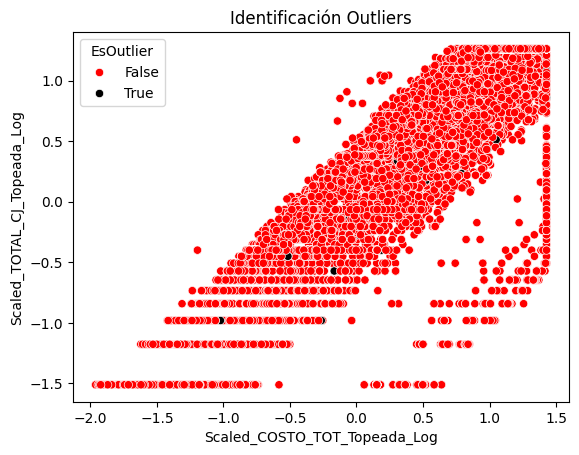

In [446]:
# Visualizo
plt.figure()
sns.scatterplot(data = df_train_scaled,
                x = 'Scaled_COSTO_TOT_Topeada_Log',
                y = 'Scaled_TOTAL_CJ_Topeada_Log',
                hue = 'EsOutlier',
                palette={0: 'red', 1: 'black'})
plt.title('Identificación Outliers')

Saco outliers

Text(0.5, 1.0, 'Relación de variables SIN Outliers')

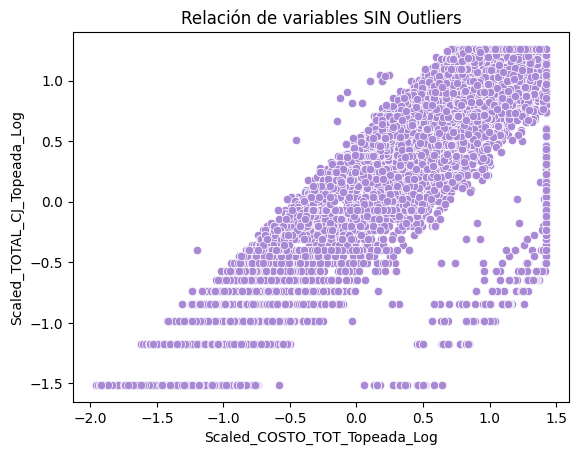

In [447]:
# Filtro
df_train_scaled = df_train_scaled.loc[df_train_scaled['EsOutlier'] == 0,]
df_test_scaled = df_test_scaled.loc[df_test_scaled['EsOutlier'] == 0,]

df_train_scaled = df_train_scaled.drop(columns=['EsOutlier'])
df_test_scaled = df_test_scaled.drop(columns=['EsOutlier'])

# Visualizo
plt.figure()
sns.scatterplot(data = df_train_scaled,
                x = 'Scaled_COSTO_TOT_Topeada_Log',
                y = 'Scaled_TOTAL_CJ_Topeada_Log',
                color = '#A989D6')
plt.title('Relación de variables SIN Outliers')

El volumen es bastante similar en Train y Test, considerando el 70/30 definido inicialmente.

# Validación

Intento 1: Problema de Varianza
Un posible problema en la varianza del modelo significa que las métricas de validación en distintas submuestras es muy diferente, por lo que podríamos tener problemas de Generalización.

In [448]:
# Obtengo data en values
X = df_train_final.drop(columns='Scaled_TOTAL_CJ_Topeada_Log').values
y = df_train_final['Scaled_TOTAL_CJ_Topeada_Log'].values

# Librerias
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor

# Crear el modelo
model = RandomForestRegressor(random_state = 123,
                              n_estimators = 10,
                              max_depth = 100,
                              max_features = 25,
                              min_samples_leaf = 1)

k_elegido = 10

scores = cross_val_score(model, X, y, cv=k_elegido, scoring='r2')

scores_df = pd.DataFrame({'K_orden': range(1,k_elegido+1),
                          'Scores' : scores})

scores_df

,K_orden,Scores
0,1,0.943001
1,2,0.950026
2,3,0.956514
3,4,0.939990
4,5,0.954500
5,6,0.942066
6,7,0.944359
7,8,0.937313
8,9,0.946162
9,10,0.948171


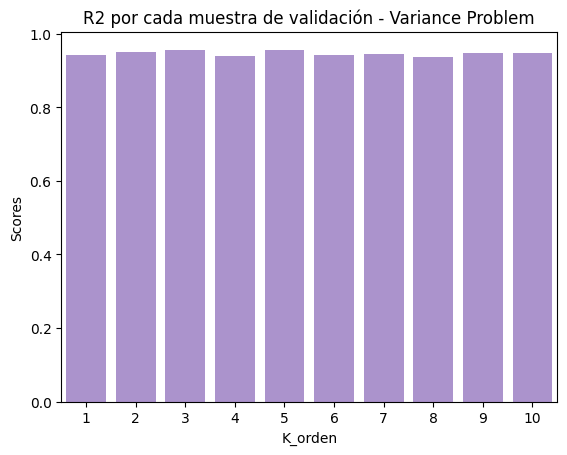

In [449]:
# Visualmente
plt.figure()
sns.barplot(data = scores_df,
              x = 'K_orden',
              y = 'Scores',
            color = '#A989D6')
plt.title('R2 por cada muestra de validación - Variance Problem')
plt.show()

In [450]:
# Metricas
media_1 = scores_df['Scores'].mean()
desvio_1 = scores_df['Scores'].std()

print('R2 Promedio: ', round(media_1,4))
print('R2 Desvio: ', round(desvio_1,4))
print('R2 CV: ', round(desvio_1 / media_1,4))

R2 Promedio:  0.9462
R2 Desvio:  0.0062
R2 CV:  0.0065


Intento 2: Problema de Sesgo
Un posible problema en el sesgo del modelo significa que el modelo no es lo suficientemente complejo como para capturar las verdaderas relaciones, así que estoy ante un caso de Underfitting.

In [451]:
# Obtengo data en values
X = df_train_final.drop(columns='Scaled_TOTAL_CJ_Topeada_Log').values
y = df_train_final['Scaled_TOTAL_CJ_Topeada_Log'].values

# Librerias
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor

# Crear el modelo
model = RandomForestRegressor(random_state = 123,
                              n_estimators = 100,
                              max_depth = 2,
                              max_features = 10,
                              min_samples_leaf = 45)

k_elegido = 2

scores = cross_val_score(model, X, y, cv=k_elegido, scoring='r2')

scores_df = pd.DataFrame({'K_orden': range(1,k_elegido+1),
                          'Scores' : scores})

scores_df

,K_orden,Scores
0,1,0.820025
1,2,0.806706


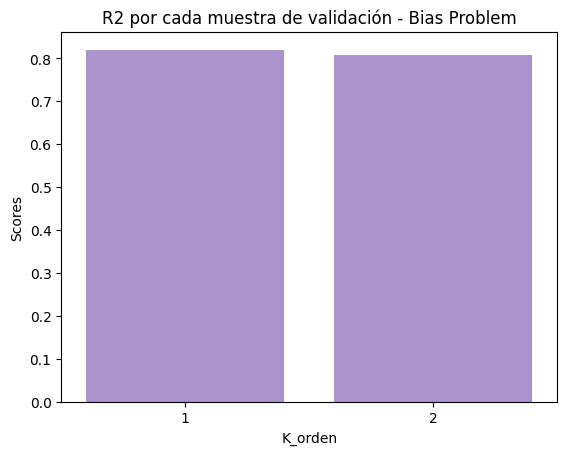

In [452]:
# Visualmente
plt.figure()
sns.barplot(data = scores_df,
              x = 'K_orden',
              y = 'Scores',
            color = '#A989D6')
plt.title('R2 por cada muestra de validación - Bias Problem')
plt.show()

In [453]:
# Metricas
media_2 = scores_df['Scores'].mean()
desvio_2 = scores_df['Scores'].std()

print('R2 Promedio: ', round(media_2,4))
print('R2 Desvio: ', round(desvio_2,4))
print('R2 CV: ', round(desvio_2 / media_2,4))

R2 Promedio:  0.8134
R2 Desvio:  0.0094
R2 CV:  0.0116


Intento 3: Intentando resolver ambos problemas
Veamos de elegir hiperparámetros que maximicen las métricas, y minimicen la varianza.

In [454]:
# Obtengo data en values
X = df_train_final.drop(columns='Scaled_TOTAL_CJ_Topeada_Log').values
y = df_train_final['Scaled_TOTAL_CJ_Topeada_Log'].values

# Librerias
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor

# Crear el modelo
model = RandomForestRegressor(random_state = 123,
                              n_estimators = 100,
                              max_depth = 6,
                              max_features = 9,
                              min_samples_leaf = 20)

k_elegido = 4

scores = cross_val_score(model, X, y, cv=k_elegido, scoring='r2')

scores_df = pd.DataFrame({'K_orden': range(1,k_elegido+1),
                          'Scores' : scores})

scores_df

,K_orden,Scores
0,1,0.919546
1,2,0.919189
2,3,0.909692
3,4,0.916074


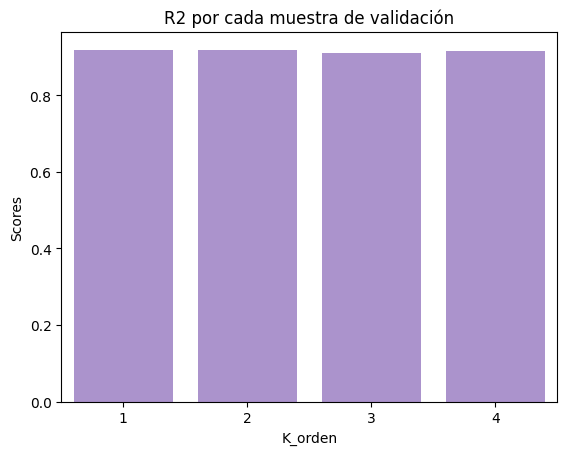

In [455]:
# Visualmente
plt.figure()
sns.barplot(data = scores_df,
              x = 'K_orden',
              y = 'Scores',
            color = '#A989D6')
plt.title('R2 por cada muestra de validación')
plt.show()

In [456]:
# Metricas
media_3 = scores_df['Scores'].mean()
desvio_3 = scores_df['Scores'].std()

print('R2 Promedio: ', round(media_3,4))
print('R2 Desvio: ', round(desvio_3,4))
print('R2 CV: ', round(desvio_3 / media_3,4))

R2 Promedio:  0.9161
R2 Desvio:  0.0046
R2 CV:  0.005


In [457]:
# En cuánto resolvimos el problema?
print('Varianza')
print('Coeficiente de Variación R2 - Intento 1: ', round(desvio_1 / media_1,4))
print('Coeficiente de Variación R2 - Intento 3: ', round(desvio_3 / media_3,4))
print('Mejora: ', round(((desvio_3 / media_3) / (desvio_1 / media_1) - 1 ) * 100), '%')

print('')

print('Bias')
print('Promedio R2 - Intento 2: ', round(media_2,4))
print('Promedio R2 - Intento 3: ', round(media_3,4))
print('Mejora: ', round(((media_3) / (media_2) - 1 ) * 100), '%')

Varianza
Coeficiente de Variación R2 - Intento 1:  0.0065
Coeficiente de Variación R2 - Intento 3:  0.005
Mejora:  -24 %

Bias
Promedio R2 - Intento 2:  0.8134
Promedio R2 - Intento 3:  0.9161
Mejora:  13 %
